In this project, health data of a person recorded by a device was analyzed. These data include the data recorded during sleep and exercise. It also measures number of steps, floors climbed, heart rate and stress of the person. Overall approach of this project is as following:

1. Data Cleaning of each dataset
2. Adjusting the times based on the time offset (for datasets which are not in local time)
3. Analyzing each dataset separately
4. Merging 2 or more datasets for further analysis, finding meaningful correlations, and developping models
5. Implementing Machine Learning tools to develop models
6. Selecting few Plotly graphs, make a dashboard, and deploying the web app on GCP (it can be found in https://github.com/Taraneh-K/Deploy_Dash_Project)


In [14]:
import pandas as pd
from pandas import DataFrame
import numpy as np
import seaborn as sns
import qgrid
import itertools
from scipy.stats.stats import pearsonr

import datetime
from datetime import timedelta
from datetime import datetime

import matplotlib
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go

from sklearn import feature_selection
from sklearn import preprocessing
from sklearn import datasets, linear_model
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import completeness_score
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ridge_regression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

%matplotlib inline

In [5]:
SMALL_SIZE = 20
MEDIUM_SIZE = 20
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [ ]:
sns.set(style="darkgrid")

## Sleep Data

In [6]:
sleep_df = pd.read_csv("sleep.csv", delimiter=',')

In [7]:
sleep_df['start_date']=pd.to_datetime(sleep_df['com.samsung.health.sleep.start_time'], unit='ms').dt.date
sleep_df['start_time']=pd.to_datetime(sleep_df['com.samsung.health.sleep.start_time'], unit='ms').dt.time
sleep_df['end_date']=pd.to_datetime(sleep_df['com.samsung.health.sleep.end_time'], unit='ms').dt.date
sleep_df['end_time']=pd.to_datetime(sleep_df['com.samsung.health.sleep.end_time'], unit='ms').dt.time
#sleep_df['original_bed_time']=pd.to_datetime(sleep_df['original_bed_time'], unit='ms').dt.time
#sleep_df['original_wakeup_time']=pd.to_datetime(sleep_df['original_wake_up_time'], unit='ms').dt.time
sleep_df['start']=pd.to_timedelta(sleep_df['start_time'].astype(str))
sleep_df['end']=pd.to_timedelta(sleep_df['end_time'].astype(str))
sleep_df['bed_duration']=sleep_df['end']-sleep_df['start']

#### sleep efficiecy is defined as total sleep hours/total time in bed. Therefore, the sleep duration is adjusted as following:

In [8]:
sleep_df['sleep_duration']=sleep_df['bed_duration']*sleep_df['efficiency']/100

In [9]:
sleep_df

,Unnamed: 0,com.samsung.health.sleep.datauuid,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.create_time,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,...,com.samsung.health.sleep.update_time,com.samsung.health.sleep.comment,start_date,start_time,end_date,end_time,start,end,bed_duration,sleep_duration
0,0,5ae9435a-9184-9741-ecc9-d30f2855ea09,86.653770,NaN,NaN,1.0,com.sec.android.app.shealth,1535884958245,UTC-0300,1535884920000,...,1535884958245,NaN,2018-09-02,02:05:00,2018-09-02,10:42:00,02:05:00,10:42:00,08:37:00,07:27:59.999454
1,1,e4f5dec4-b492-88b8-f89f-a30bffc7c8dc,92.362770,NaN,NaN,1.0,com.sec.android.app.shealth,1543754177370,UTC-0400,1543754040000,...,1543754177370,NaN,2018-12-02,05:36:00,2018-12-02,12:34:00,05:36:00,12:34:00,06:58:00,06:26:04.582716
2,2,d5712eb4-d002-3f81-1594-a9d6e8b6a0d0,70.967740,NaN,NaN,1.0,com.sec.android.app.shealth,1530743930297,UTC-0300,1530743040000,...,1530743930297,NaN,2018-07-04,21:23:00,2018-07-04,22:24:00,21:23:00,22:24:00,01:01:00,00:43:17.419284
3,3,440a44c6-a8ee-ecd9-8f96-7b62429d46e9,93.589745,NaN,NaN,1.0,com.sec.android.app.shealth,1539772714989,UTC-0300,1539772620000,...,1539772714989,NaN,2018-10-17,01:32:00,2018-10-17,10:37:00,01:32:00,10:37:00,09:05:00,08:30:03.846615
4,4,604fa367-bfab-801d-db26-b75b21a92c61,91.623040,NaN,NaN,1.0,com.sec.android.app.shealth,1525253471680,UTC-0300,1525253400000,...,1525253471680,NaN,2018-05-02,03:09:00,2018-05-02,09:30:00,03:09:00,09:30:00,06:21:00,05:49:05.026944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
657,657,7566450e-b374-4f6f-abb7-e3e8ead0d503,0.000000,NaN,NaN,NaN,com.sec.android.app.shealth,1550618552540,UTC-0400,1550575200000,...,1550618552540,NaN,2019-02-19,03:20:00,2019-02-19,11:20:00,03:20:00,11:20:00,08:00:00,00:00:00
658,658,787184c8-4ccc-afda-9c1c-c8ec693b5f5a,87.000000,NaN,NaN,1.0,com.sec.android.app.shealth,1548633359303,UTC-0400,1548632340000,...,1548633359303,NaN,2019-01-27,21:27:00,2019-01-27,23:39:00,21:27:00,23:39:00,02:12:00,01:54:50.400000
659,659,29cd4285-230c-e261-255d-5fccfe11dbcb,93.253970,NaN,NaN,1.0,com.sec.android.app.shealth,1546693843161,UTC-0400,1546693740000,...,1546693843161,NaN,2019-01-05,04:46:00,2019-01-05,13:09:00,04:46:00,13:09:00,08:23:00,07:49:04.048146
660,660,204dd49d-c183-27a0-4ea6-ece627b3c07a,87.000000,NaN,NaN,1.0,com.sec.android.app.shealth,1557570756635,UTC-0300,1557570720000,...,1557570756635,NaN,2019-05-11,01:08:00,2019-05-11,10:32:00,01:08:00,10:32:00,09:24:00,08:10:40.800000


In [10]:
#Adjusting the sleep start and end time based on time zone
def offset(dataframe,columnname_offset,columnname_torewrite):
    column_offset=[]
    hr= lambda a : int(a[3:6])
    mins= lambda a : int(a[3]+a[6:8])
    for i in dataframe.index:
        hour=(hr(dataframe[columnname_offset][i]))
        minute=(mins(dataframe[columnname_offset][i]))
        human_readable_time=pd.to_datetime(dataframe[columnname_torewrite][i], unit='ms')
        new_time=human_readable_time+datetime.timedelta(hours=hour, minutes=minute )
        column_offset.append(new_time)
    return column_offset

# Apply the offset and create new columns. 
sleep_df['offset_start']=offset(sleep_df, 'com.samsung.health.sleep.time_offset', 'com.samsung.health.sleep.start_time')
sleep_df['offset_end']=offset(sleep_df, 'com.samsung.health.sleep.time_offset', 'com.samsung.health.sleep.end_time')

In [11]:
sleep_df['offset_start_hour']=sleep_df['offset_start'].dt.hour
sleep_df['offset_end_hour']=sleep_df['offset_end'].dt.hour

In [12]:
sleep_df.loc[:,'offset_start_date']=sleep_df['offset_start'].dt.date
sleep_df.loc[:,'offset_end_date']=sleep_df['offset_end'].dt.date

#### Since I want to analyze the effect of daily activities on the person's sleep, the dates need to be adjusted. The dates are adjusted to show the same start date as the date for daily activities. For instance, the dates that the person slept after midnight were shifted to a day before:

In [13]:
sleep_df.loc[sleep_df.offset_start_date != sleep_df.offset_end_date , 'date'] = sleep_df.offset_start_date
sleep_df.loc[sleep_df.offset_start_date == sleep_df.offset_end_date , 'date'] = sleep_df.offset_start_date - pd.Timedelta(days=1)

In [14]:
#removing useless columns
sleep_df.drop(columns=['com.samsung.health.sleep.datauuid','com.samsung.health.sleep.custom','com.samsung.health.sleep.create_time'], axis=1, inplace=True)

In [15]:
#import qgrid
#qgrid_widget=qgrid.show_grid(sleep_df,show_toolbar=True)

#qgrid_widget

In [16]:
sleep_df.sleep_duration.unique()

array([ 26879999454000,  23164582716000,   2597419284000,  30603846615000,
        20945026944000,  24667515720000,  17404037571600,  10867500000000,
                     0,   1449999942000,  20099999580000,  32164731684000,
        24248839860000,   4330786416000,  27843863712000,  20766615624000,
        27006201930000,   4204675224000,   8104864698000,  22503316152000,
        22444307613000,   5108400000000,  13804560000000,  24900000828000,
        23584636296000,   8462432437200,  25563939120000,  25025119488000,
         4742168764800,   6369448932000,  22862412180000,   2235294000000,
        25145573191200,  30422488470000,   5947368540000,    914285700000,
         5464242251999,  23104329030000,  24485222448000,   4323846219000,
        25504795008000,   6365128452000,  21780000000000,  26883165012000,
        24000000360000,  22620000000000,  26047060560000,   2044736772000,
        19204655316000, -56302861373999,  26820001530000,  13745455315200,
        10800000604800,  

 #### There are several negative values which might be due to error or time zone change. These rows are removed as following:

In [17]:
def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.25)
    q3 = df_in[col_name].quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = df_in.loc[(df_in[col_name] > fence_low) & (df_in[col_name] < fence_high)]
    return df_out

In [18]:
sleep_df=remove_outlier(sleep_df,'sleep_duration')
sleep_df

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
0,0,86.653770,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1535884920000,NaN,NaN,...,10:42:00,08:37:00,07:27:59.999454,2018-09-01 23:05:00,2018-09-02 07:42:00,23,7,2018-09-01,2018-09-02,2018-09-01
1,1,92.362770,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1543754040000,NaN,NaN,...,12:34:00,06:58:00,06:26:04.582716,2018-12-02 01:36:00,2018-12-02 08:34:00,1,8,2018-12-02,2018-12-02,2018-12-01
2,2,70.967740,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1530743040000,NaN,NaN,...,22:24:00,01:01:00,00:43:17.419284,2018-07-04 18:23:00,2018-07-04 19:24:00,18,19,2018-07-04,2018-07-04,2018-07-03
3,3,93.589745,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1539772620000,NaN,NaN,...,10:37:00,09:05:00,08:30:03.846615,2018-10-16 22:32:00,2018-10-17 07:37:00,22,7,2018-10-16,2018-10-17,2018-10-16
4,4,91.623040,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1525253400000,NaN,NaN,...,09:30:00,06:21:00,05:49:05.026944,2018-05-02 00:09:00,2018-05-02 06:30:00,0,6,2018-05-02,2018-05-02,2018-05-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
657,657,0.000000,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1550575200000,NaN,0.0,...,11:20:00,08:00:00,00:00:00,2019-02-18 23:20:00,2019-02-19 07:20:00,23,7,2019-02-18,2019-02-19,2019-02-18
658,658,87.000000,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1548632340000,NaN,NaN,...,23:39:00,02:12:00,01:54:50.400000,2019-01-27 17:27:00,2019-01-27 19:39:00,17,19,2019-01-27,2019-01-27,2019-01-26
659,659,93.253970,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1546693740000,NaN,NaN,...,13:09:00,08:23:00,07:49:04.048146,2019-01-05 00:46:00,2019-01-05 09:09:00,0,9,2019-01-05,2019-01-05,2019-01-04
660,660,87.000000,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1557570720000,NaN,NaN,...,10:32:00,09:24:00,08:10:40.800000,2019-05-10 22:08:00,2019-05-11 07:32:00,22,7,2019-05-10,2019-05-11,2019-05-10


### There were several times that the person could not sleep (efficiency = 0):

In [19]:
sleep_df[sleep_df['efficiency'] == 0]

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
8,8,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1517219340000,NaN,NaN,...,09:49:00,00:17:00,0 days,2018-01-29 05:32:00,2018-01-29 05:49:00,5,5,2018-01-29,2018-01-29,2018-01-28
20,20,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1544869680000,NaN,NaN,...,10:28:00,00:15:00,0 days,2018-12-15 06:13:00,2018-12-15 06:28:00,6,6,2018-12-15,2018-12-15,2018-12-14
163,163,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1514957880000,NaN,NaN,...,05:38:00,00:16:00,0 days,2018-01-03 01:22:00,2018-01-03 01:38:00,1,1,2018-01-03,2018-01-03,2018-01-02
181,181,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1514955900000,NaN,NaN,...,05:05:00,00:10:00,0 days,2018-01-03 00:55:00,2018-01-03 01:05:00,0,1,2018-01-03,2018-01-03,2018-01-02
199,199,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1539860520000,NaN,NaN,...,11:02:00,00:16:00,0 days,2018-10-18 07:46:00,2018-10-18 08:02:00,7,8,2018-10-18,2018-10-18,2018-10-17
254,254,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0300,1525766400000,NaN,50001.0,...,08:00:00,03:00:00,0 days,2018-05-08 02:00:00,2018-05-08 05:00:00,2,5,2018-05-08,2018-05-08,2018-05-07
282,282,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1515928020000,NaN,NaN,...,11:07:00,00:16:00,0 days,2018-01-14 06:51:00,2018-01-14 07:07:00,6,7,2018-01-14,2018-01-14,2018-01-13
292,292,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1517222280000,NaN,NaN,...,10:38:00,00:15:00,0 days,2018-01-29 06:23:00,2018-01-29 06:38:00,6,6,2018-01-29,2018-01-29,2018-01-28
310,310,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1524912480000,NaN,NaN,...,10:48:00,00:18:00,0 days,2018-04-28 07:30:00,2018-04-28 07:48:00,7,7,2018-04-28,2018-04-28,2018-04-27
409,409,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0300,1525593000000,NaN,50002.0,...,07:50:00,03:00:00,0 days,2018-05-06 01:50:00,2018-05-06 04:50:00,1,4,2018-05-06,2018-05-06,2018-05-05


#### The person could not sleep on few days. Some of them were for very short periods of time which means the person accidently started or stopped the app. Therefore, we need to remove the accidental errors from the times he/she could not sleep. I assumed that real ones are the ones that the difference of hours are more than 1 hour.

In [20]:
#Data for efficiency of 0 and time in bed of longer than 1 hour
sleep_df[(sleep_df['efficiency'] == 0) & (abs(sleep_df['offset_end_hour'] - sleep_df['offset_start_hour'])>1)]

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
254,254,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0300,1525766400000,NaN,50001.0,...,08:00:00,03:00:00,0 days,2018-05-08 02:00:00,2018-05-08 05:00:00,2,5,2018-05-08,2018-05-08,2018-05-07
409,409,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0300,1525593000000,NaN,50002.0,...,07:50:00,03:00:00,0 days,2018-05-06 01:50:00,2018-05-06 04:50:00,1,4,2018-05-06,2018-05-06,2018-05-05
509,509,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1551094800000,NaN,0.0,...,11:40:00,08:50:00,0 days,2019-02-24 22:50:00,2019-02-25 07:40:00,22,7,2019-02-24,2019-02-25,2019-02-24
583,583,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1549200600000,NaN,0.0,...,13:30:00,07:30:00,0 days,2019-02-03 02:00:00,2019-02-03 09:30:00,2,9,2019-02-03,2019-02-03,2019-02-02
585,585,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0600,1556110800000,NaN,0.0,...,13:00:00,07:00:00,0 days,2019-04-24 00:00:00,2019-04-24 07:00:00,0,7,2019-04-24,2019-04-24,2019-04-23
624,624,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1549108800000,NaN,0.0,...,12:00:00,07:50:00,0 days,2019-02-02 00:10:00,2019-02-02 08:00:00,0,8,2019-02-02,2019-02-02,2019-02-01
635,635,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1551529200000,NaN,0.0,...,12:20:00,09:00:00,0 days,2019-03-01 23:20:00,2019-03-02 08:20:00,23,8,2019-03-01,2019-03-02,2019-03-01
646,646,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1549451400000,NaN,0.0,...,11:10:00,08:00:00,0 days,2019-02-05 23:10:00,2019-02-06 07:10:00,23,7,2019-02-05,2019-02-06,2019-02-05
652,652,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1550748600000,NaN,0.0,...,11:30:00,07:40:00,0 days,2019-02-20 23:50:00,2019-02-21 07:30:00,23,7,2019-02-20,2019-02-21,2019-02-20
657,657,0.0,NaN,NaN,NaN,com.sec.android.app.shealth,UTC-0400,1550575200000,NaN,0.0,...,11:20:00,08:00:00,0 days,2019-02-18 23:20:00,2019-02-19 07:20:00,23,7,2019-02-18,2019-02-19,2019-02-18


In [21]:
#Data for efficiency of 0 and time in bed of shorter than 1 hour (possible error of user)
sleep_df[(sleep_df['efficiency'] == 0) & (abs(sleep_df['offset_end_hour'] - sleep_df['offset_start_hour'])<1)]

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
8,8,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1517219340000,NaN,NaN,...,09:49:00,00:17:00,0 days,2018-01-29 05:32:00,2018-01-29 05:49:00,5,5,2018-01-29,2018-01-29,2018-01-28
20,20,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1544869680000,NaN,NaN,...,10:28:00,00:15:00,0 days,2018-12-15 06:13:00,2018-12-15 06:28:00,6,6,2018-12-15,2018-12-15,2018-12-14
163,163,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1514957880000,NaN,NaN,...,05:38:00,00:16:00,0 days,2018-01-03 01:22:00,2018-01-03 01:38:00,1,1,2018-01-03,2018-01-03,2018-01-02
292,292,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1517222280000,NaN,NaN,...,10:38:00,00:15:00,0 days,2018-01-29 06:23:00,2018-01-29 06:38:00,6,6,2018-01-29,2018-01-29,2018-01-28
310,310,0.0,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1524912480000,NaN,NaN,...,10:48:00,00:18:00,0 days,2018-04-28 07:30:00,2018-04-28 07:48:00,7,7,2018-04-28,2018-04-28,2018-04-27


In [22]:
#removing the rows for efficiency of 0 and time in bed of shorter than 1 hour (possible error of user)
indexNames = sleep_df[(sleep_df['efficiency'] == 0) & (abs(sleep_df['offset_end_hour'] - sleep_df['offset_start_hour'])<1) ].index
sleep_df = sleep_df.drop(indexNames)

### Sleep start hour distribution

In [23]:
sleep_df.offset_start_hour.unique()

array([23,  1, 18, 22,  0,  7,  2,  8,  5, 14,  4, 12, 16, 15, 19, 13,  3,
       17, 21,  6, 20, 10], dtype=int64)

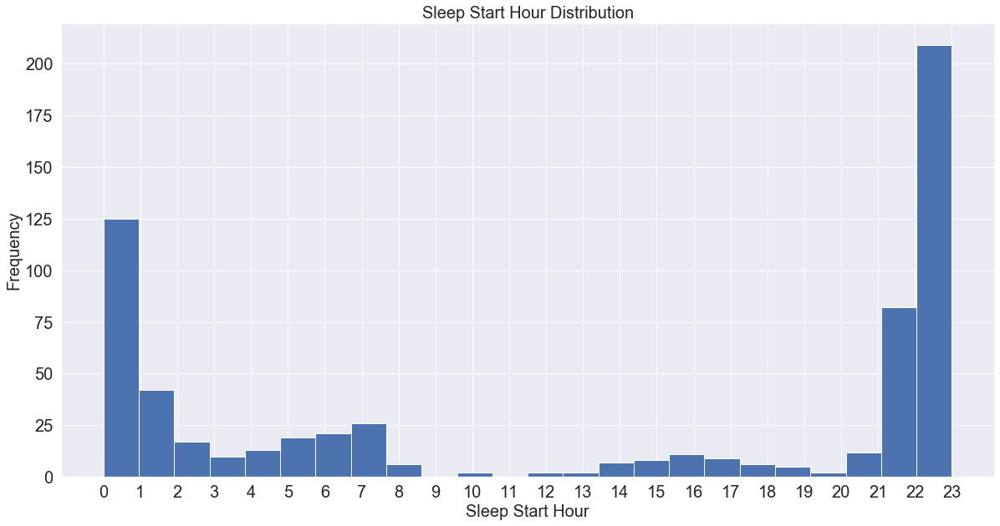

In [24]:
idx = np.asarray([i for i in range(24)])
ax_1 = sleep_df['offset_start_hour'].hist(bins=24,figsize=(20,10))
ax_1.set_xlabel("Sleep Start Hour")
ax_1.set_ylabel("Frequency") 
plt.title('Sleep Start Hour Distribution')
ax_1.set_xticks(idx)

#### The graph above shows that the person normally sleeps around 9 pm- 1 am and most frequently sleeps at 10 pm-11 pm. He/She sometimes sleeps after 1 am. The person also takes naps during the day. We assume that the naps occur between 9 am to 7 pm. These naps are separated from the main sleep data as following:

In [25]:
#Separating nap data from night sleep
sleep_df.loc[:,'offset_start_hour']=pd.to_numeric(sleep_df.loc[:,'offset_start_hour'])
nap_df = sleep_df.loc[(sleep_df['offset_start_hour']<20) & (sleep_df['offset_start_hour']>=9)]
nap_df

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
2,2,70.967740,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1530743040000,NaN,NaN,...,22:24:00,01:01:00,00:43:17.419284,2018-07-04 18:23:00,2018-07-04 19:24:00,18,19,2018-07-04,2018-07-04,2018-07-03
22,22,86.000000,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1529868300000,NaN,NaN,...,19:25:00,01:39:00,01:25:08.400000,2018-06-24 14:46:00,2018-06-24 16:25:00,14,16,2018-06-24,2018-06-24,2018-06-23
26,26,95.945946,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0400,1518290340000,NaN,NaN,...,19:19:00,02:27:00,02:21:02.432437,2018-02-10 12:52:00,2018-02-10 15:19:00,12,15,2018-02-10,2018-02-10,2018-02-09
35,35,87.719300,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1537738380000,NaN,NaN,...,21:33:00,01:53:00,01:39:07.368540,2018-09-23 16:40:00,2018-09-23 18:33:00,16,18,2018-09-23,2018-09-23,2018-09-22
40,40,93.589745,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1529180040000,NaN,NaN,...,20:14:00,01:17:00,01:12:03.846219,2018-06-16 15:57:00,2018-06-16 17:14:00,15,17,2018-06-16,2018-06-16,2018-06-15
60,60,94.047615,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1526339760000,NaN,NaN,...,23:16:00,01:23:00,01:18:03.571226,2018-05-14 18:53:00,2018-05-14 20:16:00,18,20,2018-05-14,2018-05-14,2018-05-13
62,62,89.873410,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1525821840000,NaN,NaN,...,23:24:00,01:20:00,01:11:53.923679,2018-05-08 19:04:00,2018-05-08 20:24:00,19,20,2018-05-08,2018-05-08,2018-05-07
64,64,89.915970,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1534690800000,NaN,NaN,...,15:00:00,01:58:00,01:46:06.050676,2018-08-19 16:02:00,2018-08-19 18:00:00,16,18,2018-08-19,2018-08-19,2018-08-18
76,76,93.283585,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1535199240000,NaN,NaN,...,12:14:00,02:13:00,02:04:04.030083,2018-08-25 13:01:00,2018-08-25 15:14:00,13,15,2018-08-25,2018-08-25,2018-08-24
93,93,86.956520,NaN,NaN,1.0,com.sec.android.app.shealth,UTC-0300,1532297100000,NaN,NaN,...,22:05:00,01:41:00,01:27:49.565112,2018-07-22 17:24:00,2018-07-22 19:05:00,17,19,2018-07-22,2018-07-22,2018-07-21


In [26]:
#defining night sleep data excluding naps
sleep_df=sleep_df.loc[(sleep_df['offset_start_hour']>=20) | (sleep_df['offset_start_hour']<9)]

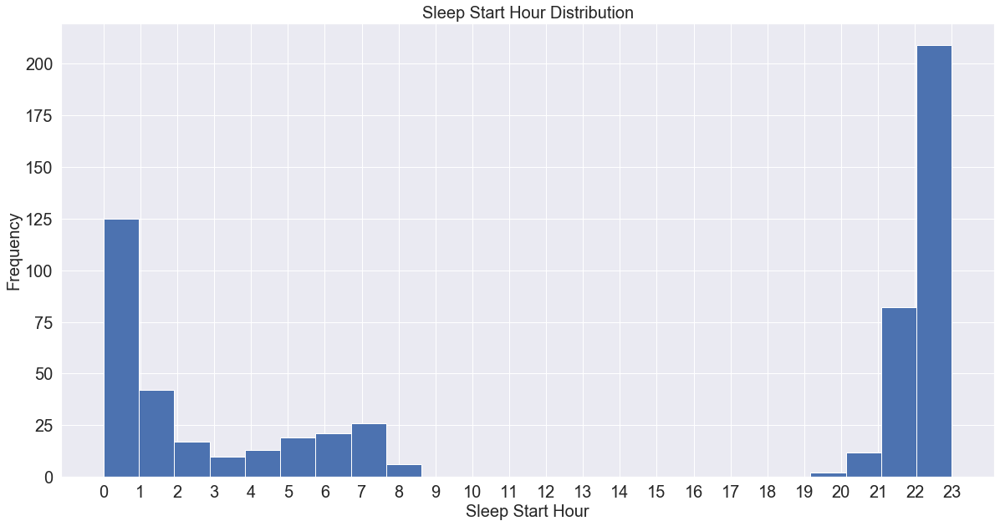

In [27]:
#Sleep start hour distribution (excluding naps):
idx = np.asarray([i for i in range(24)])
ax_1 = sleep_df['offset_start_hour'].hist(bins=24,figsize=(20,10))
ax_1.set_xlabel("Sleep Start Hour")
ax_1.set_ylabel("Frequency") 
plt.title('Sleep Start Hour Distribution')
ax_1.set_xticks(idx)

In [28]:
sleep_df.isna().sum()

Unnamed: 0                                0
efficiency                                0
original_efficiency                     548
original_bed_time                       548
has_sleep_data                           10
com.samsung.health.sleep.pkg_name         0
com.samsung.health.sleep.time_offset      0
com.samsung.health.sleep.end_time         0
original_wake_up_time                   548
quality                                 538
com.samsung.health.sleep.deviceuuid       0
extra_data                              461
com.samsung.health.sleep.start_time       0
com.samsung.health.sleep.update_time      0
com.samsung.health.sleep.comment        584
start_date                                0
start_time                                0
end_date                                  0
end_time                                  0
start                                     0
end                                       0
bed_duration                              0
sleep_duration                  

In [35]:
#Sleep efficiency of each day vs. sleep start hour
fig=px.scatter(sleep_df, x='date', y='efficiency',color='offset_start_hour')
fig.update_layout(
    title="Sleep efficiency Graph",
    xaxis_title="Date",
    yaxis_title="Sleep Efficiency %",
    )

fig.show()

### The graph above shows distribution of sleep efficiency of each date as a dependant of sleep start hour. We see that several times that he/she had 0 efficiency, he/she slept after midnight or around midnight. 

## Grouping sleep data by date

In [36]:
#Grouping time offset by date
by_date = sleep_df.groupby('date').first()['com.samsung.health.sleep.time_offset'].reset_index()

In [37]:
#Grouping mean efficiency, sleep quality, and original efficiency by Date
by_date_mean=sleep_df.groupby('date').mean()[['efficiency','quality','original_efficiency']].reset_index()

In [38]:
#qgrid_widget_1=qgrid.show_grid(by_date_mean,show_toolbar=True)

#qgrid_widget_1

The table above shows that the original effieciecy is the same as effiency values and we only have sleep quality for 25 days.

In [39]:
#Removing original efficiency from by_date_mean dataset
by_date_mean=sleep_df.groupby('date').mean()[['efficiency','quality']].reset_index()

In [40]:
#Grouping Total sleep duration by Date (Naps excluded)
by_date_sum=sleep_df[['date','sleep_duration']].groupby('date').sum().reset_index()

In [41]:
#Grouping Total nap duration by Date
nap_by_date_sum=nap_df[['date','sleep_duration']].groupby('date').sum().reset_index()
nap_by_date_sum

,date,sleep_duration
0,2018-02-09,02:21:02.432437
1,2018-05-07,01:11:53.923679
2,2018-05-13,01:18:03.571226
3,2018-06-01,01:15:59.999976
4,2018-06-08,01:26:00
5,2018-06-15,01:12:03.846219
6,2018-06-19,00:55:12
7,2018-06-22,01:29:07.059180
8,2018-06-23,01:25:08.400000
9,2018-06-27,01:10:04.675224


In [42]:
#qgrid_widget_2=qgrid.show_grid(by_date_sum,show_toolbar=True)

#qgrid_widget_2

### Merging 2 tables for sleep data per day

In [43]:
#converting dates to string and merging 2 tables based on date
by_date_mean.loc[:,'date'] = by_date_mean.loc[:,'date'].astype(str)
by_date_sum.loc[:,'date'] = by_date_sum.loc[:,'date'].astype(str)
merged_1 = pd.merge(left=by_date_mean, right=by_date_sum, left_on='date', right_on='date').reset_index()

In [44]:
#converting dates to string and merging 2 tables based on date
by_date.loc[:,'date'] = by_date.loc[:,'date'].astype(str)
by_date_sum.loc[:,'date'] = by_date_sum.loc[:,'date'].astype(str)
merged_2 = pd.merge(left=by_date, right=by_date_sum, left_on='date', right_on='date').reset_index()

In [45]:
#converting back the dates to datetime format
merged_1.loc[:,'date'] = pd.to_datetime(merged_1.loc[:,'date'])
by_date_mean.loc[:,'date'] = pd.to_datetime(by_date_mean.loc[:,'date'])
by_date_sum.loc[:,'date'] = pd.to_datetime(by_date_sum.loc[:,'date'])
by_date.loc[:,'date'] = pd.to_datetime(by_date.loc[:,'date'])

## Average sleep duration for each day of week (afternoon naps are excluded)

In [46]:
#Adding column of day of week to merged_1 dataset
merged_1.loc[:,'day_of_week'] = merged_1.loc[:,'date'].dt.day_name()

In [47]:
#Adding time zone column to merged_1 dataset
merged_1.loc[:,'time_zone'] = merged_2.loc[:,'com.samsung.health.sleep.time_offset']

Text(0.5, 1.0, 'Avg Sleep Duration during days of week')

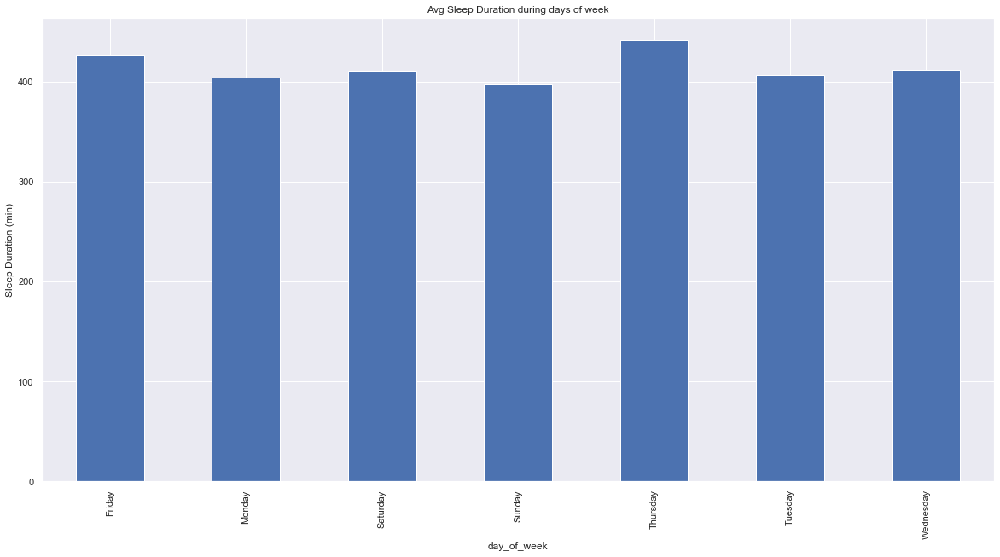

In [48]:
#Plotting total sleep duration per day of week
%matplotlib inline
merged_1.loc[:,'sleep_duration']=merged_1.loc[:,'sleep_duration'].dt.total_seconds()/60
ax_1 = merged_1.groupby('day_of_week').mean()['sleep_duration'].plot(kind='bar', figsize=(20,10))
ax_1.set_ylabel("Sleep Duration (min)")
plt.title('Avg Sleep Duration during days of week')

#### The person sleeps for total of about 400 min (~7 hours) per day. He/She sleeps the most on Thursday nights and the least on Sunday nights.

In [49]:
#Plotting sleep efficiency of each day on different week days
fig = px.scatter(merged_1, x='date', y='efficiency',color='day_of_week')
fig.show()

## Analyzing Time Zone Changes in Sleep Data

In [50]:
merged_1.groupby('time_zone').date.count()

time_zone
UTC+0300      4
UTC-0300    270
UTC-0400    182
UTC-0600     14
UTC-0700     10
Name: date, dtype: int64

In [51]:
#Finding the data with time zone of UTC+0300
sleep_df[sleep_df['com.samsung.health.sleep.time_offset']=='UTC+0300']

,Unnamed: 0,efficiency,original_efficiency,original_bed_time,has_sleep_data,com.samsung.health.sleep.pkg_name,com.samsung.health.sleep.time_offset,com.samsung.health.sleep.end_time,original_wake_up_time,quality,...,end,bed_duration,sleep_duration,offset_start,offset_end,offset_start_hour,offset_end_hour,offset_start_date,offset_end_date,date
104,104,87.66234,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1534883820000,NaN,NaN,...,20:37:00,02:33:00,02:14:07.402812,2018-08-21 21:04:00,2018-08-21 23:37:00,21,23,2018-08-21,2018-08-21,2018-08-20
151,151,76.86568,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1535348400000,NaN,NaN,...,05:40:00,02:13:00,01:42:13.881264,2018-08-27 06:27:00,2018-08-27 08:40:00,6,8,2018-08-27,2018-08-27,2018-08-26
226,226,89.21568,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1535308920000,NaN,NaN,...,18:42:00,01:42:00,01:30:59.999616,2018-08-26 20:00:00,2018-08-26 21:42:00,20,21,2018-08-26,2018-08-26,2018-08-25
496,496,73.77049,NaN,NaN,1.0,com.sec.android.app.shealth,UTC+0300,1534913940000,NaN,NaN,...,04:59:00,01:01:00,00:44:59.999933,2018-08-22 06:58:00,2018-08-22 07:59:00,6,7,2018-08-22,2018-08-22,2018-08-21


Text(0.5, 1.0, 'Frequency of Sleep Data per week')

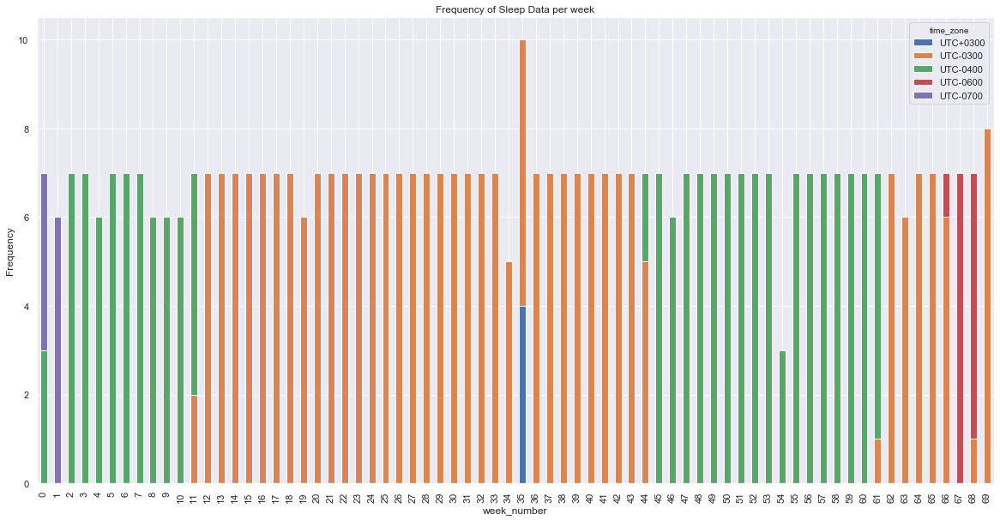

In [52]:
# Observing frequency of data for each week
merged_1.loc[:,'date'] = pd.to_datetime(merged_1['date'])
merged_1.loc[:,'week_number'] = ((merged_1.day_of_week == 'Monday').cumsum())

ax_3 = merged_1.groupby(['week_number','time_zone']).date.count().unstack().plot(kind='bar',stacked=True,figsize=(20,10))
ax_3.set_ylabel("Frequency")
plt.title('Frequency of Sleep Data per week')

In [53]:
#Data of week 35 since it does not look nomal
merged_1[merged_1['week_number']==35]

,index,date,efficiency,quality,sleep_duration,day_of_week,time_zone,week_number
237,237,2018-08-20,87.662340,NaN,134.123380,Monday,UTC+0300,35
238,238,2018-08-21,73.770490,NaN,44.999999,Tuesday,UTC+0300,35
239,239,2018-08-25,89.215680,NaN,90.999994,Saturday,UTC+0300,35
240,240,2018-08-26,76.865680,NaN,102.231354,Sunday,UTC+0300,35
241,241,2018-08-28,89.473690,NaN,390.105288,Tuesday,UTC-0300,35
242,242,2018-08-29,89.004025,NaN,482.943665,Wednesday,UTC-0300,35
243,243,2018-08-30,93.876372,NaN,485.122448,Thursday,UTC-0300,35
244,244,2018-08-31,89.322380,NaN,434.999991,Friday,UTC-0300,35
245,245,2018-09-01,86.653770,NaN,447.999991,Saturday,UTC-0300,35
246,246,2018-09-02,86.541730,NaN,507.999955,Sunday,UTC-0300,35


#### The graph above shows that: 1- We have 7 data points for most of the weeks. 2- There are some missing data for several days of several weeks. 3- The person was on vacation to area with time zone UTC-0700 during week 0 and 1. 4- The person was on vacation to area with time zone UTC+0300 from 2018-08-20 to 2018-08-26. 5-The person was on vacation to area with time zone UTC-600 during weeks 66 to 68. 6-Time offset changes on weeks 11,44,and 61 were due to daylight saving not because of travelling.

## Separating Sleep Data during travel from no travel and analysis of Sleep Efficiency

In [54]:
#Separating Travel data by assuming travel data to have time zone of UTC-0700, UTC-0600, and UTC+0300
sleep_travel=merged_1.loc[(merged_1['time_zone'] == 'UTC-0700')|(merged_1['time_zone'] == 'UTC-0600')|(merged_1['time_zone'] == 'UTC+0300')]
sleep_travel

,index,date,efficiency,quality,sleep_duration,day_of_week,time_zone,week_number
3,3,2017-12-21,91.434265,NaN,458.085668,Thursday,UTC-0700,0
4,4,2017-12-22,93.188850,NaN,300.068097,Friday,UTC-0700,0
5,5,2017-12-23,94.117645,NaN,495.058813,Saturday,UTC-0700,0
6,6,2017-12-24,93.262410,NaN,525.067368,Sunday,UTC-0700,0
7,7,2017-12-25,92.051280,NaN,358.079479,Monday,UTC-0700,1
8,8,2017-12-27,89.926735,NaN,490.100706,Wednesday,UTC-0700,1
9,9,2017-12-28,90.120964,NaN,446.098772,Thursday,UTC-0700,1
10,10,2017-12-29,92.952385,NaN,487.070497,Friday,UTC-0700,1
11,11,2017-12-30,89.778534,NaN,526.102209,Saturday,UTC-0700,1
12,12,2017-12-31,90.506050,NaN,478.189880,Sunday,UTC-0700,1


In [55]:
sleep_travel.efficiency.mean()

83.86976100000001

In [56]:
sleep_travel.sleep_duration.mean()

353.22593629071383

### The person traveled to time zone of UTC-0700 on 2017-12-21 (Thurseday) and returned on 2017-12-31 (Sunday). Also, he/she travelled from 2018-08-20 to 2018-08-26 and from 2019-04-14 to 2019-04-27.  His/her average sleep efficiency and sleep duration during vacation was 83.87% and 353 min (5.88 hours), respectively. 

In [57]:
#Separating No Travel data by assuming no travel data having time zones of UTC-0400 and UTC-0300
sleep_no_travel=merged_1.loc[(merged_1['time_zone'] == 'UTC-0400')|(merged_1['time_zone'] == 'UTC-0300')]
sleep_no_travel

,index,date,efficiency,quality,sleep_duration,day_of_week,time_zone,week_number
0,0,2017-12-15,94.902916,NaN,390.050985,Friday,UTC-0400,0
1,1,2017-12-17,96.341460,NaN,473.036569,Sunday,UTC-0400,0
2,2,2017-12-19,93.174065,NaN,273.000010,Tuesday,UTC-0400,0
13,13,2018-01-01,93.593315,NaN,335.064068,Monday,UTC-0400,2
14,14,2018-01-02,55.861473,NaN,378.324179,Tuesday,UTC-0400,2
...,...,...,...,...,...,...,...,...
475,475,2019-05-02,91.000000,NaN,405.860000,Thursday,UTC-0300,69
476,476,2019-05-03,90.000000,NaN,315.900000,Friday,UTC-0300,69
477,477,2019-05-04,88.000000,NaN,448.190000,Saturday,UTC-0300,69
478,478,2019-05-10,87.000000,NaN,490.680000,Friday,UTC-0300,69


In [58]:
sleep_no_travel.isna().sum()

index               0
date                0
efficiency          0
quality           408
sleep_duration      0
day_of_week         0
time_zone           0
week_number         0
dtype: int64

In [59]:
sleep_no_travel.efficiency.mean()

89.03054277249268

#### Average sleep efficiency for the person while he/she was not travelling is 89.03% since there were several times that he/she did not sleep at night (efficiency=0)

In [60]:
sleep_no_travel.groupby('time_zone').efficiency.mean()

time_zone
UTC-0300    89.981901
UTC-0400    87.619188
Name: efficiency, dtype: float64

Text(0.5, 1.0, 'Avg Sleep Efficiency per week')

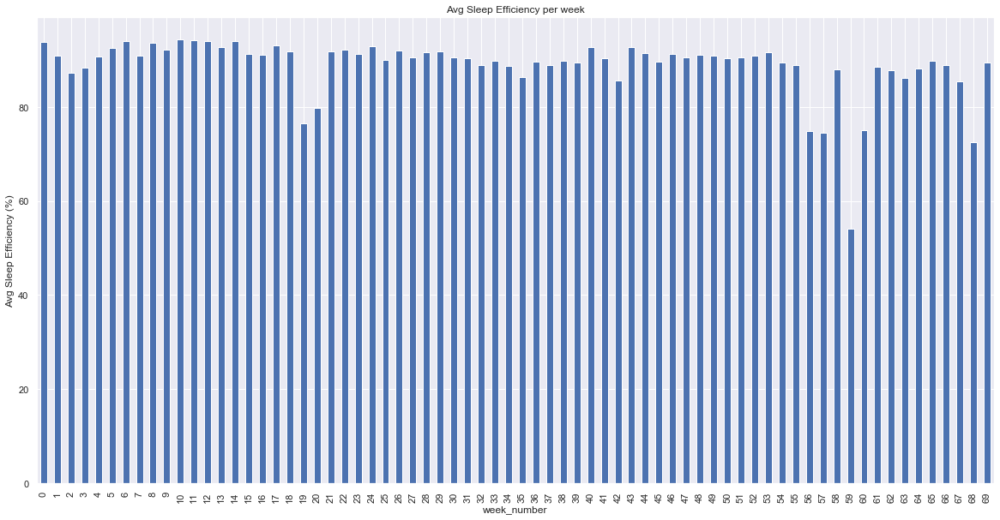

In [61]:
#Plotting Average sleep efficiecy per week
ax_4=merged_1.groupby('week_number').efficiency.mean().plot(kind='bar', figsize=(20,10))
ax_4.set_ylabel("Avg Sleep Efficiency (%)")
plt.title('Avg Sleep Efficiency per week')

Text(0.5, 1.0, 'Min Sleep Efficiency per week')

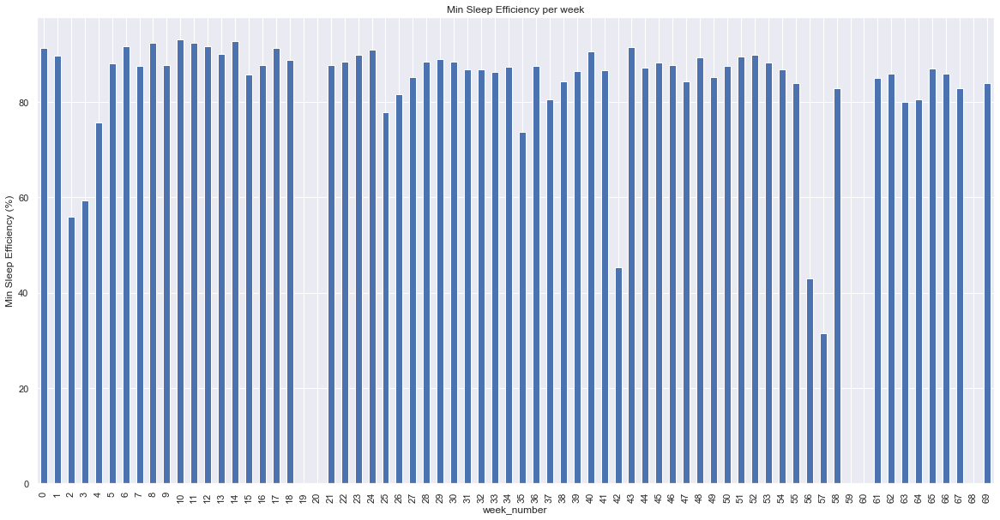

In [62]:
#plotting minimum sleep efficiency per week
ax_5=merged_1.groupby('week_number').efficiency.min().plot(kind='bar', figsize=(20,10))
ax_5.set_ylabel("Min Sleep Efficiency (%)")
plt.title('Min Sleep Efficiency per week')

Text(0.5, 1.0, 'Avg Sleep Efficiency per day of week')

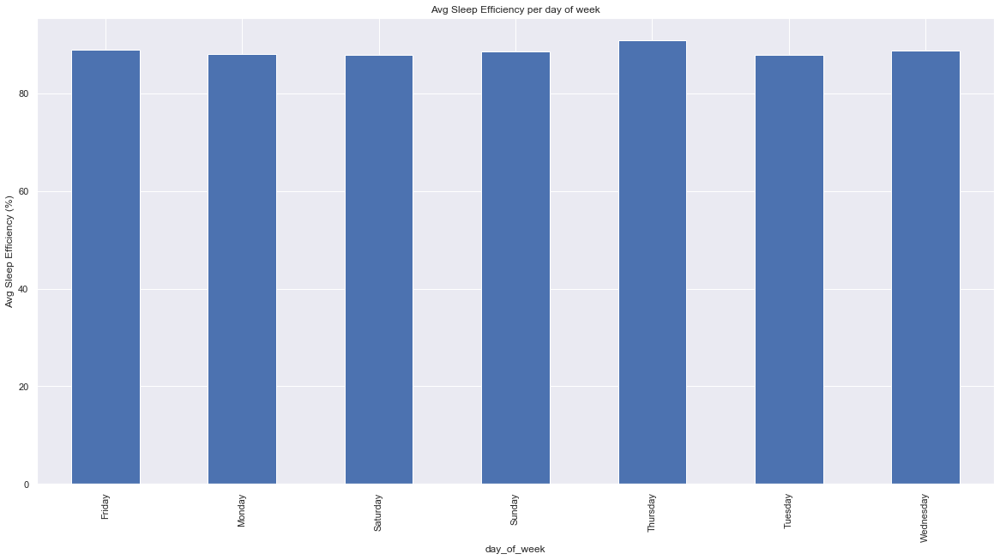

In [64]:
#Plotting Average Sleep efficiency per day of week
ax_7=merged_1.groupby('day_of_week').efficiency.mean().plot(kind='bar',figsize=(20,10))
ax_7.set_ylabel("Avg Sleep Efficiency (%)")
plt.title('Avg Sleep Efficiency per day of week')

Text(0.5, 1.0, 'Min Sleep Efficiency per day of week')

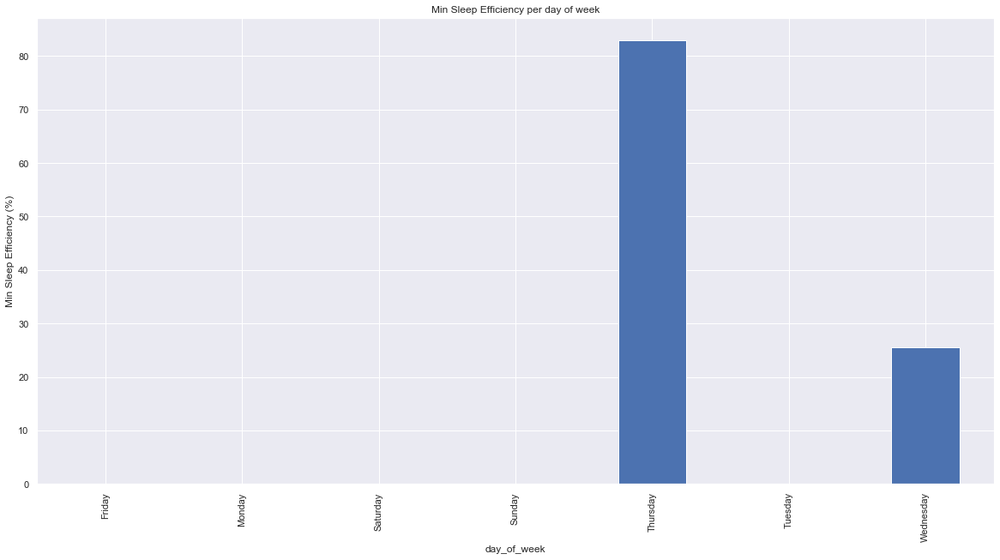

In [65]:
#Plotting Minimum Sleep efficiency per day of week
ax_8=merged_1.groupby('day_of_week').efficiency.min().plot(kind='bar', figsize=(20,10))
ax_8.set_ylabel("Min Sleep Efficiency (%)")
plt.title('Min Sleep Efficiency per day of week')

#### Average sleep efficiency for the person while he/she was not travelling is 89.98 during daylight saving months and 87.61 during regular months(Nov-Mar). He/She could not sleep on few nights during weeks 19, 20, 59, 60, and 68. In general, the person could sleep more easily on Thursday and Wednesday nights (highest min sleep efficiency).

# Exercise Data

In [3]:
exercise_df=pd.read_csv("exercise.csv", delimiter=',')

In [4]:
exercise_df['start_date']=pd.to_datetime(exercise_df['start_time']).dt.date
exercise_df['start']=pd.to_datetime(exercise_df['start_time']).dt.time
exercise_df['end_date']=pd.to_datetime(exercise_df['end_time']).dt.date
exercise_df['exercise_duration']=pd.to_timedelta(exercise_df['duration'],unit='ms')

### Exercise Data Cleaning

In [68]:
exercise_df.columns

Index(['Unnamed: 0', 'max_rpm', 'live_data', 'mean_rpm', 'distance',
       'max_caloricburn_rate', 'additional', 'altitude_gain', 'deviceuuid',
       'duration', 'update_time', 'datauuid', 'location_data',
       'decline_distance', 'altitude_loss', 'mean_caloricburn_rate',
       'incline_distance', 'max_altitude', 'max_cadence', 'create_time',
       'time_offset', 'mean_speed', 'mean_heart_rate', 'count_type',
       'min_altitude', 'count', 'end_time', 'max_speed', 'exercise_type',
       'start_time', 'max_power', 'pkg_name', 'mean_power', 'min_heart_rate',
       'calorie', 'comment', 'max_heart_rate', 'mean_cadence',
       'exercise_custom_type', 'start_date', 'start', 'end_date',
       'exercise_duration'],
      dtype='object')

In [69]:
#Removing the useless columns
exercise_df.drop(columns=['deviceuuid','pkg_name','max_cadence','live_data','datauuid','altitude_loss','max_altitude','count','altitude_gain','exercise_custom_type','max_rpm','mean_caloricburn_rate','incline_distance','decline_distance','mean_power','max_power','mean_rpm','min_altitude','count_type','max_caloricburn_rate','comment','additional','max_heart_rate','mean_heart_rate','min_heart_rate','mean_cadence','location_data'], axis=1, inplace=True)

In [70]:
exercise_df

,Unnamed: 0,distance,duration,update_time,create_time,time_offset,mean_speed,end_time,max_speed,exercise_type,start_time,calorie,start_date,start,end_date,exercise_duration
0,0,701.45900,654419,2018-02-07 22:28:19.252,2018-02-07 22:28:19.252,UTC-0400,1.307612,2018-02-07 22:27:17.766,1.541910,1001,2018-02-07 22:16:23.347,40.61000,2018-02-07,22:16:23.347000,2018-02-07,00:10:54.419000
1,1,1511.08800,1412519,2018-06-15 23:45:03.370,2018-06-15 23:45:03.370,UTC-0300,1.203861,2018-06-15 23:44:02.630,1.965237,1001,2018-06-15 23:20:30.111,88.80000,2018-06-15,23:20:30.111000,2018-06-15,00:23:32.519000
2,2,4188.52000,3367121,2018-03-25 15:40:47.657,2018-03-25 15:40:47.657,UTC-0300,1.243947,2018-03-25 15:23:07.000,1.638889,1001,2018-03-25 14:27:00.000,221.59999,2018-03-25,14:27:00,2018-03-25,00:56:07.121000
3,3,0.00000,2550312,2019-05-10 11:51:06.412,2018-03-08 11:32:47.136,UTC-0400,0.000000,2018-03-08 11:32:46.933,NaN,0,2018-03-08 10:50:15.456,226.05600,2018-03-08,10:50:15.456000,2018-03-08,00:42:30.312000
4,4,1670.41100,1680955,2018-03-04 23:26:13.923,2018-03-04 22:10:48.054,UTC-0400,1.031962,2018-03-04 21:48:23.708,1.333333,1001,2018-03-04 21:20:22.753,105.50000,2018-03-04,21:20:22.753000,2018-03-04,00:28:00.955000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1061,1061,772.29000,677008,2019-05-10 12:12:15.607,2019-05-10 12:12:15.607,UTC-0300,1.361585,2019-05-10 12:11:13.906,1.461868,1001,2019-05-10 11:59:56.898,50.68000,2019-05-10,11:59:56.898000,2019-05-10,00:11:17.008000
1062,1062,810.38995,669609,2019-05-10 12:54:59.824,2019-05-10 12:54:59.824,UTC-0300,1.210244,2019-05-10 12:11:09.000,1.527778,1001,2019-05-10 12:00:00.000,49.04000,2019-05-10,12:00:00,2019-05-10,00:11:09.609000
1063,1063,1264.27000,1075053,2019-05-11 00:00:22.329,2019-05-11 00:00:22.329,UTC-0300,1.176007,2019-05-10 22:27:15.000,1.777778,1001,2019-05-10 22:09:20.000,93.76000,2019-05-10,22:09:20,2019-05-10,00:17:55.053000
1064,1064,1190.21000,1098514,2019-05-12 14:25:52.976,2019-05-10 22:31:50.668,UTC-0300,1.341121,2019-05-10 22:27:59.977,1.666667,1001,2019-05-10 22:09:41.463,81.09000,2019-05-10,22:09:41.463000,2019-05-10,00:18:18.514000


In [71]:
pd.unique(exercise_df['exercise_type'])

array([ 1001,     0, 14001, 11007,  1002, 15006, 13001,  9002],
      dtype=int64)

In [73]:
#qgrid_widget_3=qgrid.show_grid(exercise_df,show_toolbar=True)

#qgrid_widget_3

In [74]:
exercise_df.loc[:,'exercise_duration_minutes']=exercise_df.loc[:,'exercise_duration'].dt.total_seconds()/60

In [75]:
exercise_df.loc[:,'exercise_duration_minutes']=pd.to_numeric(exercise_df['exercise_duration_minutes'])

In [76]:
exercise_df.loc[:,'calorie']=pd.to_numeric(exercise_df['calorie'])

## Assumptions:

#### 1-Activities longer than 15 minutes is accounted as exercise 2- Activities with higher calories than 34 are accounted as exercise. Based on calorie chart, walking for 15 minutes uses at least 34 calories (for person with 100 lbs weight).

In [77]:
exercise_df=exercise_df.loc[(exercise_df['exercise_duration_minutes'] > 15) & (exercise_df['calorie']>34) ]

## Exercise Start Hour Distribution

In [5]:
exercise_df.loc[:,'start_hour']=pd.to_datetime(exercise_df['start_time']).dt.hour

In [6]:
exercise_df.loc[:,'end_hour']=pd.to_datetime(exercise_df['end_time']).dt.hour

Text(0.5, 1.0, 'Frequency of Exercise Start Hour')

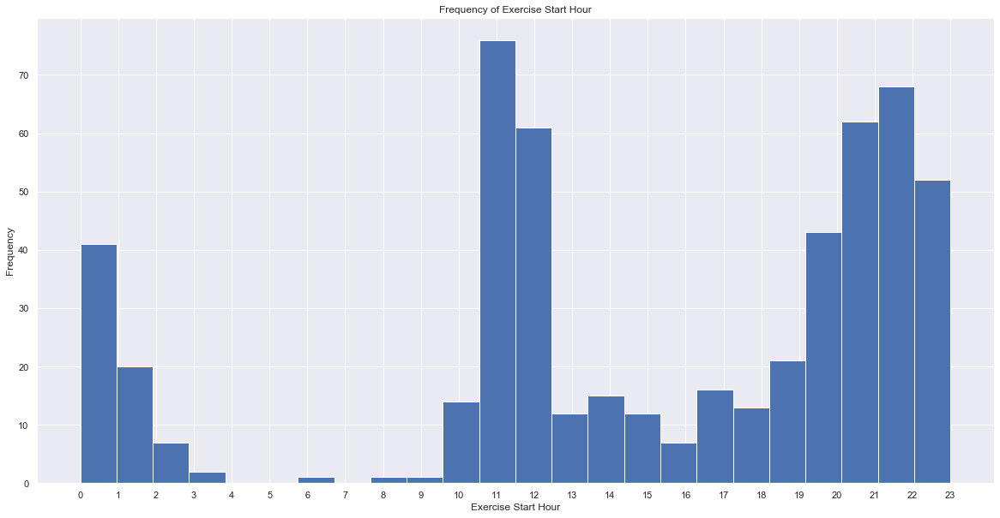

In [80]:
idx = np.asarray([i for i in range(24)])
ax_9=exercise_df['start_hour'].hist(bins=24, figsize=(20,10))
ax_9.set_xlabel("Exercise Start Hour")
ax_9.set_ylabel("Frequency") 
ax_9.set_xticks(idx)
plt.title('Frequency of Exercise Start Hour')

In [81]:
exercise_df.loc[(exercise_df['start_hour']>1) & (exercise_df['start_hour']<7)]

,Unnamed: 0,distance,duration,update_time,create_time,time_offset,mean_speed,end_time,max_speed,exercise_type,start_time,calorie,start_date,start,end_date,exercise_duration,exercise_duration_minutes,start_hour,end_hour
37,37,1507.610,1276881,2018-05-20 03:18:49.846,2018-05-20 03:18:49.846,UTC-0300,1.322176,2018-05-20 03:17:48.015,1.666667,1001,2018-05-20 02:56:31.134,85.980,2018-05-20,02:56:31.134000,2018-05-20,00:21:16.881000,21.281350,2,3
48,48,1131.100,910747,2018-06-17 10:21:24.530,2018-06-17 10:21:24.530,UTC-0300,1.241947,2018-06-17 02:18:10.000,1.972222,1001,2018-06-17 02:03:00.000,58.570,2018-06-17,02:03:00,2018-06-17,00:15:10.747000,15.179117,2,2
219,219,1720.540,1297986,2018-05-20 03:20:01.578,2018-05-20 03:20:01.578,UTC-0300,1.325546,2018-05-20 03:18:02.000,2.250000,1001,2018-05-20 02:56:25.000,89.070,2018-05-20,02:56:25,2018-05-20,00:21:37.986000,21.633100,2,3
767,767,1554.120,1300526,2018-08-25 06:41:32.222,2018-08-25 06:41:32.222,UTC+0300,1.507197,2018-08-25 06:40:32.007,1.722222,1001,2018-08-25 06:18:51.481,89.070,2018-08-25,06:18:51.481000,2018-08-25,00:21:40.526000,21.675433,6,6
788,788,0.000,2700000,2019-01-31 13:35:15.017,2019-01-31 13:35:11.629,UTC-0400,0.000000,2019-01-31 02:55:00.000,NaN,9002,2019-01-31 02:10:00.000,157.000,2019-01-31,02:10:00,2019-01-31,00:45:00,45.000000,2,2
891,891,0.000,1504729,2019-02-04 12:28:09.870,2019-02-04 03:13:18.624,UTC-0400,0.000000,2019-02-04 03:13:18.288,NaN,9002,2019-02-04 02:48:11.225,87.745,2019-02-04,02:48:11.225000,2019-02-04,00:25:04.729000,25.078817,2,3
1012,1012,2015.320,1803124,2019-04-18 03:32:38.409,2019-04-18 03:32:38.409,UTC-0600,1.256308,2019-04-18 03:31:37.976,1.555556,1001,2019-04-18 03:01:34.852,120.830,2019-04-18,03:01:34.852000,2019-04-18,00:30:03.124000,30.052067,3,3
1039,1039,1190.397,1165119,2019-04-17 02:37:49.316,2019-04-17 02:37:49.316,UTC-0600,1.297647,2019-04-17 02:36:48.465,1.722222,1001,2019-04-17 02:17:23.346,70.290,2019-04-17,02:17:23.346000,2019-04-17,00:19:25.119000,19.418650,2,2
1043,1043,1134.260,934980,2019-04-17 02:44:18.271,2019-04-17 02:44:18.271,UTC-0600,1.213138,2019-04-17 02:36:42.000,1.472222,1001,2019-04-17 02:21:08.000,62.730,2019-04-17,02:21:08,2019-04-17,00:15:34.980000,15.583000,2,2
1048,1048,2168.700,1691264,2019-04-18 03:36:56.489,2019-04-18 03:36:56.489,UTC-0600,1.282295,2019-04-18 03:29:35.000,1.472222,1001,2019-04-18 03:01:24.000,119.590,2019-04-18,03:01:24,2019-04-18,00:28:11.264000,28.187733,3,3


### According to the table above, the person has exercised few times at 1 am-7 am. Among those, only 5 times were during the time he/she was not on travel. The remaining were during vacation which means that strange exercise hours might be due to device errors or experiencing jet lag during vacation. Therefore, it is not habit of person to exercise during night time. He/She most frequently exercises around 11 am, followed by 7 pm-11 pm and 12 am.

## Grouping Exercise Data by dates

In [82]:
by_date_mean_exercise=exercise_df.groupby('start_date').sum()[['calorie','exercise_duration_minutes']].reset_index()

In [83]:
exercise_time_zone=exercise_df.groupby('start_date').first()['time_offset'].reset_index()

In [84]:
by_date_mean_exercise.loc[:,'start_date']=by_date_mean_exercise.loc[:,'start_date'].astype(str)
exercise_time_zone.loc[:,'start_date']=exercise_time_zone.loc[:,'start_date'].astype(str)
merged_exercise = pd.merge(left=by_date_mean_exercise, right=exercise_time_zone, left_on='start_date', right_on='start_date').reset_index()

In [85]:
merged_exercise.loc[:,'start_date']=pd.to_datetime(merged_exercise['start_date'])
merged_exercise.loc[:,'day_of_week'] = merged_exercise.loc[:,'start_date'].dt.day_name()

## Separating Exercise data during travel and no travel

In [86]:
merged_exercise.time_offset.unique()

array(['UTC-0600', 'UTC-0400', 'UTC-0700', 'UTC-0300', 'UTC+0300'],
      dtype=object)

In [87]:
travel_exercise=merged_exercise.loc[(merged_exercise['time_offset']=='UTC-0700')|(merged_exercise['time_offset']=='UTC-0600')|(merged_exercise['time_offset']=='UTC+0300')]

In [88]:
travel_exercise.describe()

,index,calorie,exercise_duration_minutes
count,24.000000,24.000000,24.000000
mean,156.458333,383.362682,65.703820
std,130.837097,405.250122,65.256951
min,0.000000,56.948387,15.875533
25%,8.750000,102.077500,29.294025
50%,174.500000,261.519998,50.783775
75%,307.250000,449.242500,70.442213
max,313.000000,1786.680000,324.496533


In [89]:
No_travel_exercise=merged_exercise.loc[(merged_exercise['time_offset']=='UTC-0300')|(merged_exercise['time_offset']=='UTC-0400')]

In [90]:
No_travel_exercise.describe()

,index,calorie,exercise_duration_minutes
count,298.000000,298.000000,298.000000
mean,160.825503,325.222480,54.649543
std,89.668580,193.714809,33.364738
min,3.000000,46.940000,15.051300
25%,83.250000,210.602500,30.000000
50%,157.500000,302.790000,45.928542
75%,238.750000,387.354750,70.454033
max,321.000000,1298.187000,224.954933


In [91]:
No_travel_exercise.groupby('time_offset').calorie.mean()

time_offset
UTC-0300    310.334592
UTC-0400    349.252053
Name: calorie, dtype: float64

In [92]:
No_travel_exercise.groupby('time_offset').exercise_duration_minutes.mean()

time_offset
UTC-0300    54.448403
UTC-0400    54.974189
Name: exercise_duration_minutes, dtype: float64

#### The person exercised during vacation for about average time of 66 minutes (min=16 min, max=324 min) per day. However, when the person was not on vacation, he/she exercised for about average time of 55 minutes (min= 15 min, max= 224 min) per day. Exercise time was almost the same during daylight saving seasons and other seasons , average exercise time was about 54 minutes.

## Analysis based on exercise type

In [93]:
#observing the data for exercise type of other than defined categories
exercise_df[exercise_df.exercise_type == 0]

,Unnamed: 0,distance,duration,update_time,create_time,time_offset,mean_speed,end_time,max_speed,exercise_type,start_time,calorie,start_date,start,end_date,exercise_duration,exercise_duration_minutes,start_hour,end_hour
3,3,0.0,2550312,2019-05-10 11:51:06.412,2018-03-08 11:32:47.136,UTC-0400,0.0,2018-03-08 11:32:46.933,NaN,0,2018-03-08 10:50:15.456,226.056,2018-03-08,10:50:15.456000,2018-03-08,00:42:30.312000,42.505200,10,11
15,15,0.0,3979437,2019-05-10 11:51:07.011,2018-03-31 12:53:04.514,UTC-0300,0.0,2018-03-31 12:53:04.299,NaN,0,2018-03-31 11:46:41.250,352.825,2018-03-31,11:46:41.250000,2018-03-31,01:06:19.437000,66.323950,11,12
32,32,0.0,4390836,2019-05-10 11:51:09.236,2018-04-19 00:15:49.170,UTC-0300,0.0,2018-04-19 00:15:48.937,NaN,0,2018-04-18 23:02:24.919,389.267,2018-04-18,23:02:24.919000,2018-04-19,01:13:10.836000,73.180600,23,0
46,46,0.0,4040940,2019-05-10 11:51:05.406,2018-02-04 13:02:30.824,UTC-0400,0.0,2018-02-04 13:02:30.583,NaN,0,2018-02-04 11:55:06.985,358.280,2018-02-04,11:55:06.985000,2018-02-04,01:07:20.940000,67.349000,11,13
57,57,0.0,2496115,2019-05-10 11:51:09.321,2018-04-19 20:35:14.880,UTC-0300,0.0,2018-04-19 20:35:14.680,NaN,0,2018-04-19 19:53:32.077,221.101,2018-04-19,19:53:32.077000,2018-04-19,00:41:36.115000,41.601917,19,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,992,0.0,2396664,2019-05-10 11:51:19.886,2019-01-05 22:06:16.026,UTC-0400,0.0,2019-01-05 22:06:15.819,NaN,0,2019-01-05 21:26:16.986,212.429,2019-01-05,21:26:16.986000,2019-01-05,00:39:56.664000,39.944400,21,22
993,993,0.0,3792992,2019-05-10 11:51:21.736,2019-03-04 23:04:34.427,UTC-0400,0.0,2019-03-04 23:04:34.166,NaN,0,2019-03-04 22:01:19.386,336.287,2019-03-04,22:01:19.386000,2019-03-04,01:03:12.992000,63.216533,22,23
1014,1014,0.0,2040098,2019-05-06 02:02:10.257,2019-05-05 20:52:30.310,UTC-0300,0.0,2019-05-05 20:52:30.119,NaN,0,2019-05-05 20:18:28.996,180.820,2019-05-05,20:18:28.996000,2019-05-05,00:34:00.098000,34.001633,20,20
1033,1033,0.0,2947737,2019-04-12 16:06:56.660,2019-04-11 21:53:30.491,UTC-0300,0.0,2019-04-11 21:53:30.177,NaN,0,2019-04-11 21:04:21.316,261.300,2019-04-11,21:04:21.316000,2019-04-11,00:49:07.737000,49.128950,21,21


#### The person does (128 times during this time period) exercises which are not included in the categories of health app. These rows are excluded from our analysis:

In [94]:
type_exercise=exercise_df[exercise_df.exercise_type != 0]

In [95]:
type_exercise=type_exercise.sort_values('start_date')

In [96]:
pd.unique(type_exercise['exercise_type'])

array([13001,  1002,  1001, 14001, 11007,  9002], dtype=int64)

In [149]:
type_map = {1001: 'Walking', 1002: 'Running',9002:'Yoga',11007:'Cycling',13001:'Hiking',14001:'Swimming'}
type_exercise['type'] = type_exercise['exercise_type'].map(type_map)

Text(0.5, 1.0, 'Exercise Type Distribution')

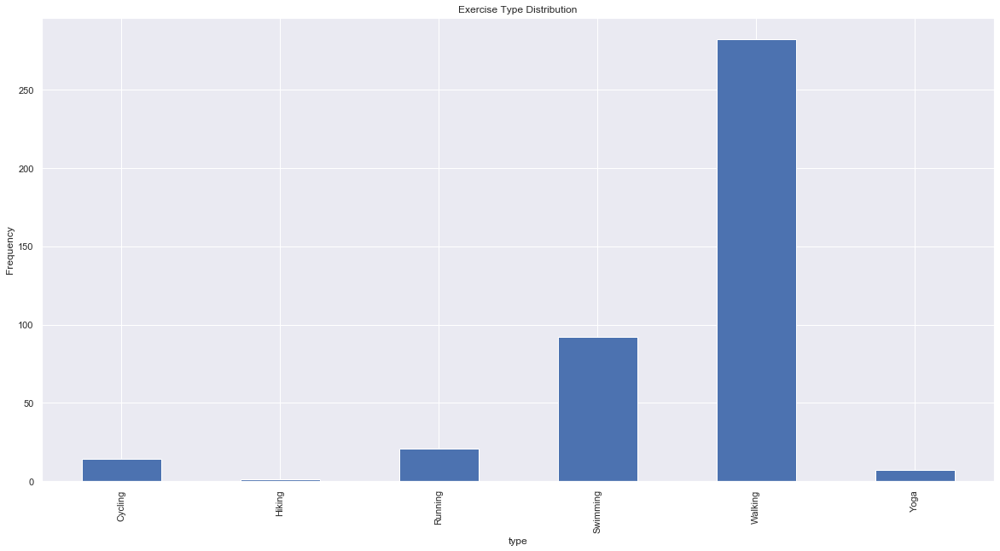

In [150]:
ax_10=type_exercise.groupby('type').start_date.count().plot(kind='bar',stacked=True, figsize=(20,10))
ax_10.set_ylabel("Frequency")
plt.title('Exercise Type Distribution')

In [ ]:
type_exercise.type.unique()

In [151]:
type_exercise.groupby('type').start_date.count()

type
Cycling      14
Hiking        1
Running      21
Swimming     92
Walking     282
Yoga          7
Name: start_date, dtype: int64

#### Exercise categories are as followimg: 1001=Walking, 14001=Swimming, 11007=Cycling, 13001=Hiking, 1002=Running,9002= Yoga . 
#### The person mostly walks for exercise. He/she sometimes goes swimming. He/She rarely goes running, cycling, Yoga and hiking. As mentioned earlier, the person sometimes (128 times during this time period) does  exercises which are not included in the categories of health app.

Text(0.5, 1.0, 'Exercise Type Distribution by date')

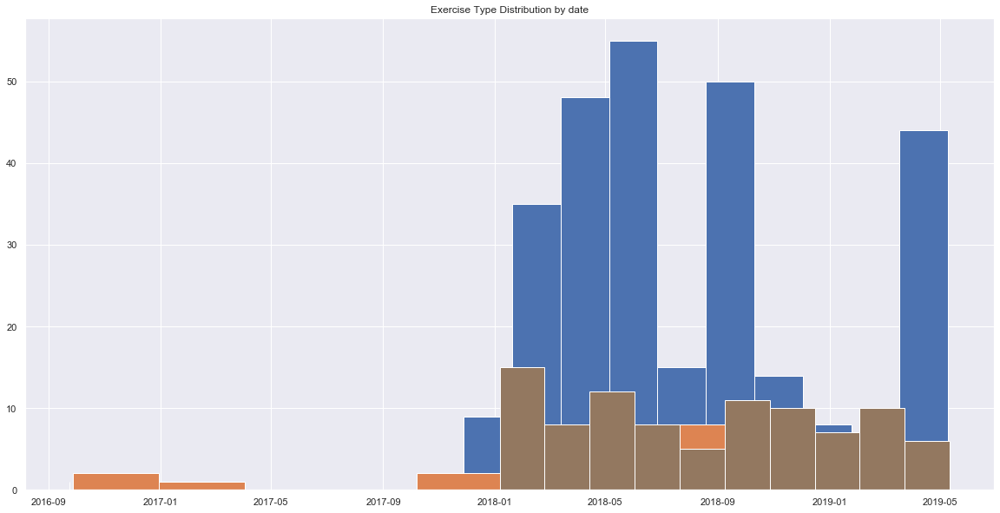

In [152]:
type_exercise.groupby('exercise_type').start_date.hist(bins=10,figsize=(20, 10))
plt.title('Exercise Type Distribution by date')

#### Based on the graph above, between 2017-12 to 2019-05, the person usually does both swimming and walking every month. However, he/she mostly walks as exercise.

In [153]:
fig = px.scatter(type_exercise, x='exercise_duration_minutes', y='calorie',color='type', marginal_y="box",
           marginal_x="box",trendline="ols")

fig.update_layout(title='Calorie Vs exercise duration for different exercise types',
                   xaxis_title='Exercise Duration (min)',
                   yaxis_title='Calorie (cal)',
            )
fig.show()

C:\Users\Taraneh\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:23: FutureWarning:

The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version

C:\Users\Taraneh\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



#### Based on the graph above, exercise duration and calories was different depending on the exercise type. Calorie and exercise duration are linearly correlated for Cycling, Walking and Yoga, and we can see the trend line coefficients for each exercise type. The longest exercise duration was for Cycling, followed by Yoga, Swimming, Running, and Walking, by order. However, the amount of average calories was the highest for Running, Cycling,Swimming,Yoga, and Walking, by order. This behaviour can be also seen in the slopes for different activity types. Among the activity types, Swimming and Running did not have a good correlation between Calorie and duration.

### Analyzing Walking data to separate normal walking from exercise

In [154]:
walk_df=type_exercise[type_exercise.exercise_type==1001]
walk_df

,Unnamed: 0,distance,duration,update_time,create_time,time_offset,mean_speed,end_time,max_speed,exercise_type,start_time,calorie,start_date,start,end_date,exercise_duration,exercise_duration_minutes,start_hour,end_hour,type
205,205,3770.000,2515029,2017-11-28 22:04:23.826,2017-11-28 21:15:59.250,UTC-0400,1.499006,2017-11-28 22:03:05.366,1.727394,1001,2017-11-28 21:15:59.218,246.000000,2017-11-28,21:15:59.218000,2017-11-28,00:41:55.029000,41.917150,21,22,Walking
430,430,987.061,994597,2017-12-26 19:33:53.516,2017-12-26 19:33:53.516,UTC-0700,1.225024,2017-12-26 19:32:52.046,1.474362,1001,2017-12-26 19:16:17.449,57.180000,2017-12-26,19:16:17.449000,2017-12-26,00:16:34.597000,16.576617,19,19,Walking
207,207,1159.260,952532,2017-12-30 21:21:36.413,2017-12-30 21:21:36.413,UTC-0700,1.197589,2017-12-30 21:20:35.056,1.452267,1001,2017-12-30 21:04:42.524,68.120000,2017-12-30,21:04:42.524000,2017-12-30,00:15:52.532000,15.875533,21,21,Walking
149,149,1542.569,1171467,2018-01-01 20:26:57.435,2018-01-01 20:26:57.435,UTC-0700,1.523625,2018-01-01 20:25:55.930,2.305556,1001,2018-01-01 20:06:24.463,93.310000,2018-01-01,20:06:24.463000,2018-01-01,00:19:31.467000,19.524450,20,20,Walking
343,343,1700.781,1734242,2018-01-06 21:09:52.562,2018-01-06 21:09:52.562,UTC-0400,1.227018,2018-01-06 21:08:52.911,1.611111,1001,2018-01-06 20:39:58.669,104.250000,2018-01-06,20:39:58.669000,2018-01-06,00:28:54.242000,28.904033,20,21,Walking
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1049,1049,1248.760,945240,2019-04-29 22:29:55.903,2019-04-29 22:29:55.903,UTC-0300,1.321104,2019-04-29 22:21:12.000,1.833333,1001,2019-04-29 22:05:27.000,84.650000,2019-04-29,22:05:27,2019-04-29,00:15:45.240000,15.754000,22,22,Walking
1025,1025,1217.390,969852,2019-05-08 23:49:03.775,2019-05-08 23:49:03.775,UTC-0300,1.255233,2019-05-08 21:39:33.000,1.694444,1001,2019-05-08 21:23:24.000,54.239998,2019-05-08,21:23:24,2019-05-08,00:16:09.852000,16.164200,21,21,Walking
1008,1008,1058.950,903078,2019-05-09 01:42:51.315,2019-05-09 01:42:51.315,UTC-0300,1.172601,2019-05-09 01:38:11.000,2.944444,1001,2019-05-09 01:23:08.000,46.940000,2019-05-09,01:23:08,2019-05-09,00:15:03.078000,15.051300,1,1,Walking
1064,1064,1190.210,1098514,2019-05-12 14:25:52.976,2019-05-10 22:31:50.668,UTC-0300,1.341121,2019-05-10 22:27:59.977,1.666667,1001,2019-05-10 22:09:41.463,81.090000,2019-05-10,22:09:41.463000,2019-05-10,00:18:18.514000,18.308567,22,22,Walking


Text(0.5, 1.0, 'Walking Start Hour Distribution')

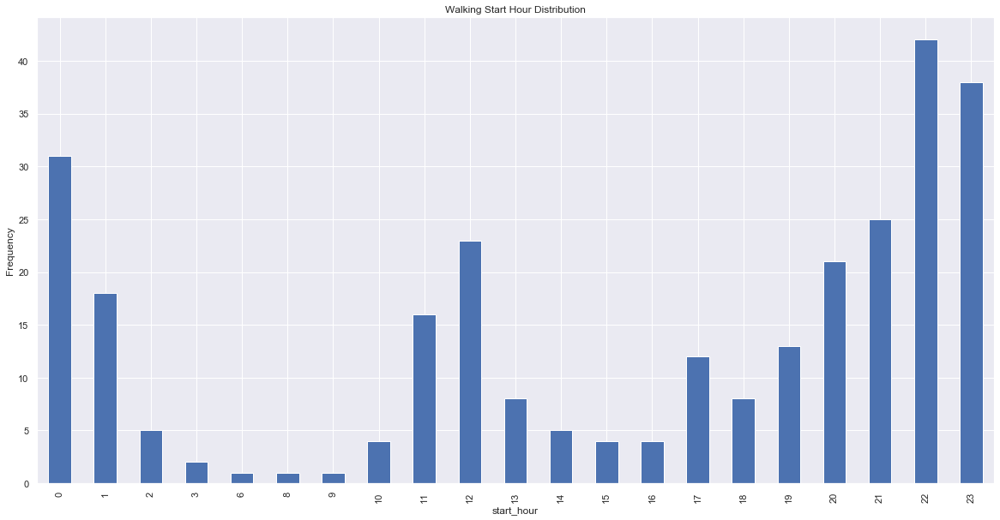

In [155]:
ax_14=walk_df.groupby('start_hour').start_time.count().plot(kind='bar', figsize=(20,10))
ax_14.set_ylabel("Frequency")
plt.title('Walking Start Hour Distribution')

Text(0.5, 1.0, 'Walking End Hour Distribution')

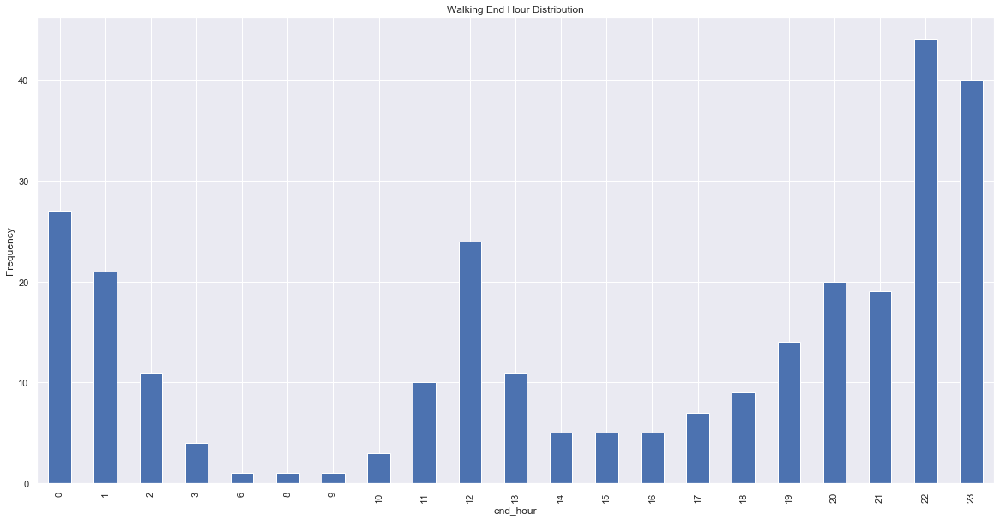

In [156]:
ax_15=walk_df.groupby('end_hour').start_time.count().plot(kind='bar',figsize=(20,10))
ax_15.set_ylabel("Frequency")
plt.title('Walking End Hour Distribution')

### According to this graph, the person does not walk (earlier assumption applies: walks are accounted as exercise when longer than 15 minutes and use calories more than 45) mostly walks at 10 pm-1 am followed by 11 am-12 am.

### Total avg walking speed, duration, and calories per hour

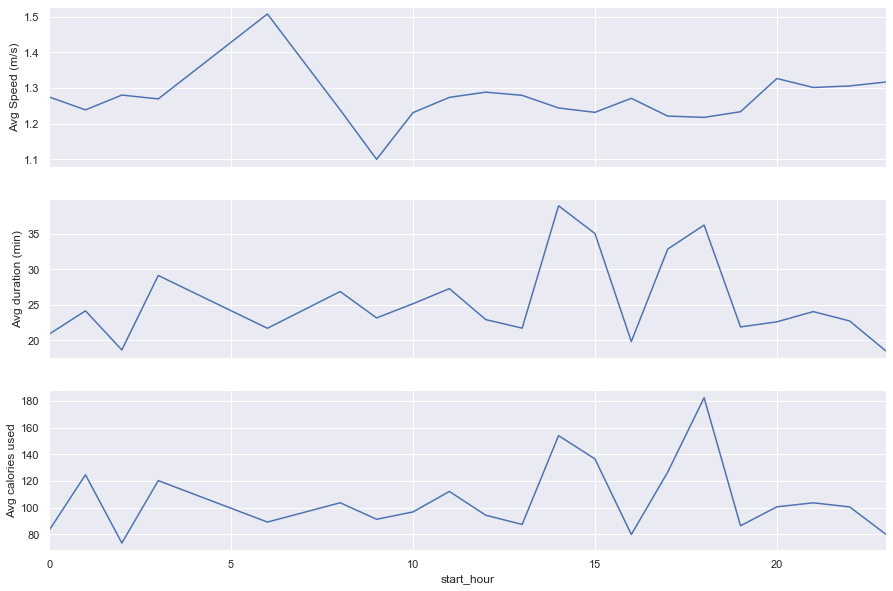

In [157]:
fig, axes = plt.subplots(nrows=3, ncols=1,sharex=True)
ax_11=walk_df.groupby('start_hour').mean_speed.mean().plot(ax=axes[0],kind='line',figsize=(15,10))
ax_11.set_ylabel("Avg Speed (m/s)")


ax_12=walk_df.groupby('start_hour').exercise_duration_minutes.mean().plot(ax=axes[1],kind='line')
ax_12.set_ylabel("Avg duration (min)")


ax_13=walk_df.groupby('start_hour').calorie.mean().plot(ax=axes[2],kind='line')
ax_13.set_ylabel("Avg calories used")


plt.show()

In [158]:
walk_df[walk_df.start_hour==6].describe()

,Unnamed: 0,distance,duration,mean_speed,max_speed,exercise_type,calorie,exercise_duration,exercise_duration_minutes,start_hour,end_hour
count,1.0,1.00,1.0,1.000000,1.000000,1.0,1.00,1,1.000000,1.0,1.0
mean,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN
min,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0
25%,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0
50%,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0
75%,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0
max,767.0,1554.12,1300526.0,1.507197,1.722222,1001.0,89.07,0 days 00:21:40.526000,21.675433,6.0,6.0


#### Based on the graphs above, his/her average walking speed is 1.5 m/s. His/Her highest walking speed was around 6 a.m for one time. Also, comparing the 3 graphs shows that amount of calories burnt is correlated with exercise duration and not with speed.

In [159]:
walk_df=walk_df[walk_df.calorie<400] #remove 3 outliers

## Correlation of Walking Calories with duration and Speed

In [160]:
fig = px.scatter(walk_df, x='exercise_duration_minutes', y='calorie',color='mean_speed', marginal_y="box",
           marginal_x="box",trendline="ols")
fig.show()

#### Graph above confirms the linear correlation between calorie and exercise duration. We can also see walking duration median was 19 minutes and it is mostly between 16-27 minutes. The calorie median was 84 cal and it was mostly between 68-111 cal. Speed also has some effect on the calories, as we can see for several situations, with the same exercise duration, higher speed resulted in more calories burn. To find out about the effect of speed on calorie, we need to do further analysis as following:

In [161]:
fig = px.scatter(walk_df, x='mean_speed', y='calorie',color='exercise_duration_minutes', marginal_y="box",
           marginal_x="box",trendline="ols")
fig.show()

#### According to the graph above, calorie and mean walking speed are not linearly correlated. It might be bacause of small range of walking speed data (0.98-1.6 m/s).

## Hypothesis 1: Calorie of walking has higher correlation with only duration
## Hypothesis 2: Calorie of walking has higher correlation when considering both duration and speed

### Hypothesis 1:

In [163]:
walk_df=remove_outlier(walk_df,'calorie')

In [164]:
best_cols = ['exercise_duration_minutes']
df_best = walk_df[best_cols]
df_scaled = pd.DataFrame(preprocessing.scale(df_best))

In [165]:
X_train, X_test, y_train, y_test = train_test_split(df_scaled, walk_df.calorie, test_size=0.2)

In [166]:
lreg = LinearRegression()
lreg.fit(X_train, y_train)
y_pred = lreg.predict(X_test)
y_pred

array([136.7731068 ,  65.43610402,  69.78880949,  69.01493864,
       121.61060038,  68.50912042,  70.94257156,  67.56674693,
       108.77069954, 103.22109782, 109.66038105,  69.94676132,
       119.35024459,  78.85245145,  82.39466855, 125.26546289,
       101.39450442,  78.9093017 ,  73.81928083, 107.0080937 ,
       153.91643463,  96.42265262,  75.95569564,  74.45065369,
       155.00825723,  69.42573752,  72.12680684,  86.68915838,
        93.77706814,  64.80491736,  65.72680986,  71.69434777,
        98.03177521, 159.00980693,  65.51535922,  77.86793679,
        66.78486987,  70.97223795,  76.06356216,  82.34812086,
        75.65133582,  84.88621121, 103.78041486,  68.39107548,
        65.54930801,  65.50803572,  92.03184011, 123.91142164,
        64.67334255,  64.75135648, 118.66171116, 119.68340192,
       120.50692364,  68.18024547])

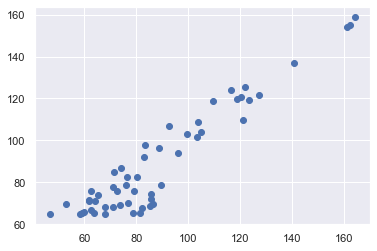

In [167]:
plt.scatter(y_test, y_pred)

In [168]:
lreg.score(X_test, y_test)

0.891677237643354

In [169]:
lreg.coef_

array([25.01766988])

In [170]:
lreg.intercept_

89.3428713189347

### Hypothesis 2:

In [171]:
best_cols = ['exercise_duration_minutes','mean_speed']
df_best = walk_df[best_cols]
df_scaled = pd.DataFrame(preprocessing.scale(df_best))

In [172]:
X_train, X_test, y_train, y_test = train_test_split(df_scaled, walk_df.calorie, test_size=0.2)

In [173]:
lreg = LinearRegression()
lreg.fit(X_train, y_train)
y_pred = lreg.predict(X_test)
y_pred

array([ 78.82597293, 108.05820643,  74.52003813,  65.43114804,
       101.48169481,  82.47625689,  89.69777571,  69.46110319,
        74.01539237,  66.15433332,  65.05644109,  65.41671481,
        90.72441988,  80.53594374,  95.53725106, 161.03553374,
       123.94160541,  91.51960208, 105.28313928,  82.34159549,
        60.26415917,  61.81020906,  90.61742782,  66.13874546,
        73.51521712, 133.98843966,  63.41721961,  78.58733317,
       120.05315385,  64.75191228,  62.24547614,  79.01090635,
        66.93301881,  83.54051729,  56.37058637,  57.86500924,
       120.42593252, 120.61561445, 112.39275542,  78.2021434 ,
        78.98044557,  71.02859815, 121.66957852,  79.7370172 ,
        96.66030739, 110.19223561, 113.77472693,  89.97716749,
        81.50728026,  62.64970601,  71.65642178,  72.6591451 ,
        83.06291819, 141.40108328])

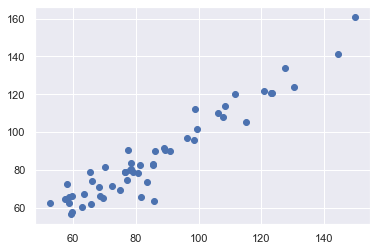

In [174]:
plt.scatter(y_test, y_pred)

In [175]:
lreg.score(X_test, y_test)

0.9067260838317749

In [176]:
lreg.coef_

array([26.55416334,  6.027708  ])

In [177]:
lreg.intercept_

89.39994947375105

### Based on the linear regaression fittings above, both hypotheses give almost the same linear regression score. Therefore, it is better to choose hypothesis 1 (which assumes that calories only depends on duration)since it has less variables. Also, if we had a bigger speed range we could have a better conclusion.

In [178]:
walk_df.describe()

,Unnamed: 0,distance,duration,mean_speed,max_speed,exercise_type,calorie,exercise_duration,exercise_duration_minutes,start_hour,end_hour
count,266.000000,266.000000,2.660000e+02,266.000000,266.000000,266.0,266.000000,266,266.000000,266.000000,266.000000
mean,507.759398,1482.666738,1.298446e+06,1.277929,1.857072,1001.0,89.166278,0 days 00:21:38.445969,21.640766,14.853383,14.511278
std,321.766097,495.332333,4.038572e+05,0.133753,0.557764,0.0,27.322168,0 days 00:06:43.857241,6.730954,8.253823,8.424687
min,1.000000,765.319000,9.004700e+05,0.891748,1.083333,1001.0,46.290000,0 days 00:15:00.470000,15.007833,0.000000,0.000000
25%,216.250000,1127.455000,9.726382e+05,1.187468,1.555556,1001.0,67.960000,0 days 00:16:12.638250,16.210637,11.000000,10.250000
50%,479.000000,1300.333500,1.131500e+06,1.264062,1.694444,1001.0,81.625000,0 days 00:18:51.500000,18.858333,19.000000,18.000000
75%,781.500000,1779.372500,1.545995e+06,1.345001,1.960039,1001.0,105.387500,0 days 00:25:45.995250,25.766587,22.000000,22.000000
max,1064.000000,3107.900000,2.471549e+06,1.740395,4.722222,1001.0,168.270000,0 days 00:41:11.549000,41.192483,23.000000,23.000000


### His/her average walking speed was 1.28 m/s (~3mph)

## Analysis of Effect of only Walking Speed on Calorie

##### For this analysis, we need to factor the effect of duration on calorie first:

In [179]:
walk_df.loc[:,'exercise_duration_int']=walk_df['exercise_duration_minutes'].astype(int)

Text(0, 0.5, 'Frequency')

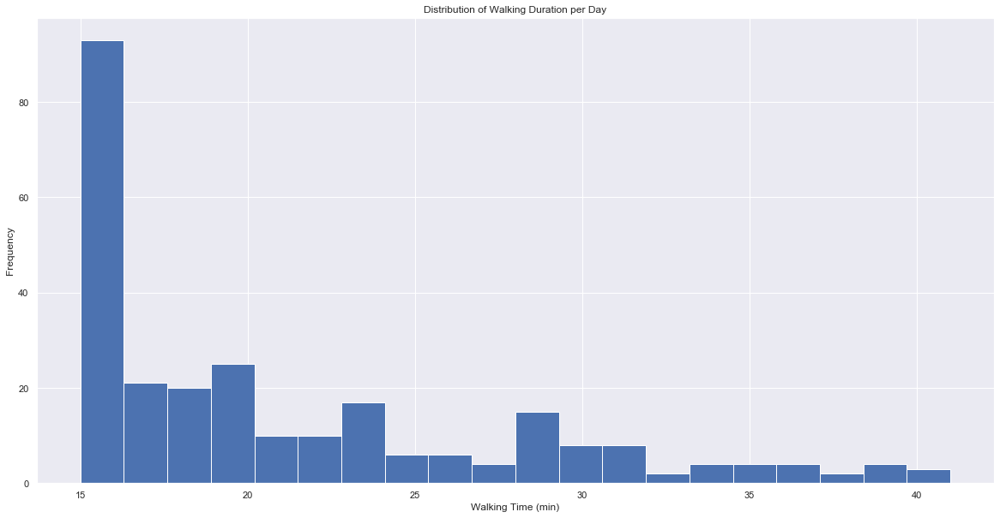

In [180]:
walk_df['exercise_duration_int'].hist(bins=20, figsize=(20,10))
plt.title('Distribution of Walking Duration per Day')
plt.xlabel('Walking Time (min)')
plt.ylabel('Frequency')

In [181]:
#Extracting walking data for duration of 15 minutes
walk_df_2=walk_df[walk_df.exercise_duration_int==15] #a duration that had most data points was chosen

In [182]:
walk_df_2

,Unnamed: 0,distance,duration,update_time,create_time,time_offset,mean_speed,end_time,max_speed,exercise_type,...,calorie,start_date,start,end_date,exercise_duration,exercise_duration_minutes,start_hour,end_hour,type,exercise_duration_int
207,207,1159.2600,952532,2017-12-30 21:21:36.413,2017-12-30 21:21:36.413,UTC-0700,1.197589,2017-12-30 21:20:35.056,1.452267,1001,...,68.120000,2017-12-30,21:04:42.524000,2017-12-30,00:15:52.532000,15.875533,21,21,Walking,15
45,45,1076.8690,906462,2018-01-31 13:14:56.332,2018-01-31 13:14:56.332,UTC-0400,1.502710,2018-01-31 13:13:58.877,1.750000,1001,...,70.640000,2018-01-31,12:58:52.415000,2018-01-31,00:15:06.462000,15.107700,12,13,Walking,15
65,65,1115.5300,903084,2018-02-01 13:06:43.198,2018-02-01 13:06:43.198,UTC-0400,1.235245,2018-02-01 02:08:03.000,2.027778,1001,...,66.110000,2018-02-01,01:53:00,2018-02-01,00:15:03.084000,15.051400,1,2,Walking,15
49,49,1136.5980,957463,2018-02-07 13:08:29.315,2018-02-07 13:08:29.315,UTC-0400,1.531869,2018-02-07 13:07:27.775,2.138889,1001,...,71.120000,2018-02-07,12:51:30.312000,2018-02-07,00:15:57.463000,15.957717,12,13,Walking,15
308,308,989.6010,959484,2018-02-12 23:47:11.367,2018-02-12 23:47:11.367,UTC-0400,1.440886,2018-02-12 23:46:10.688,1.694444,1001,...,71.390000,2018-02-12,23:30:11.204000,2018-02-12,00:15:59.484000,15.991400,23,23,Walking,15
230,230,1084.5800,914525,2018-02-15 02:21:36.397,2018-02-15 02:21:36.397,UTC-0400,1.185949,2018-02-15 02:07:14.000,1.555556,1001,...,78.590000,2018-02-15,01:52:00,2018-02-15,00:15:14.525000,15.242083,1,2,Walking,15
322,322,926.8600,945669,2018-03-06 23:21:07.378,2018-03-06 23:21:07.378,UTC-0400,1.094198,2018-03-06 23:20:07.487,1.250000,1001,...,59.570000,2018-03-06,23:04:21.818000,2018-03-06,00:15:45.669000,15.761150,23,23,Walking,15
296,296,1173.3400,909877,2018-03-12 19:59:08.597,2018-03-12 19:59:08.597,UTC-0300,1.289559,2018-03-12 19:53:09.000,2.305556,1001,...,64.080000,2018-03-12,19:38:00,2018-03-12,00:15:09.877000,15.164617,19,19,Walking,15
22,22,1003.3100,923491,2018-03-25 19:28:43.461,2018-03-25 19:28:43.461,UTC-0300,1.178641,2018-03-25 19:27:42.786,1.388889,1001,...,60.800000,2018-03-25,19:12:19.295000,2018-03-25,00:15:23.491000,15.391517,19,19,Walking,15
494,494,830.5630,900958,2018-03-29 01:09:14.155,2018-03-29 01:09:14.155,UTC-0300,1.273143,2018-03-29 01:08:13.543,1.583333,1001,...,67.780000,2018-03-29,00:53:12.585000,2018-03-29,00:15:00.958000,15.015967,0,1,Walking,15


C:\Users\Taraneh\Anaconda3\lib\site-packages\seaborn\regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



Text(9.925000000000004, 0.5, 'Calorie (cal)')

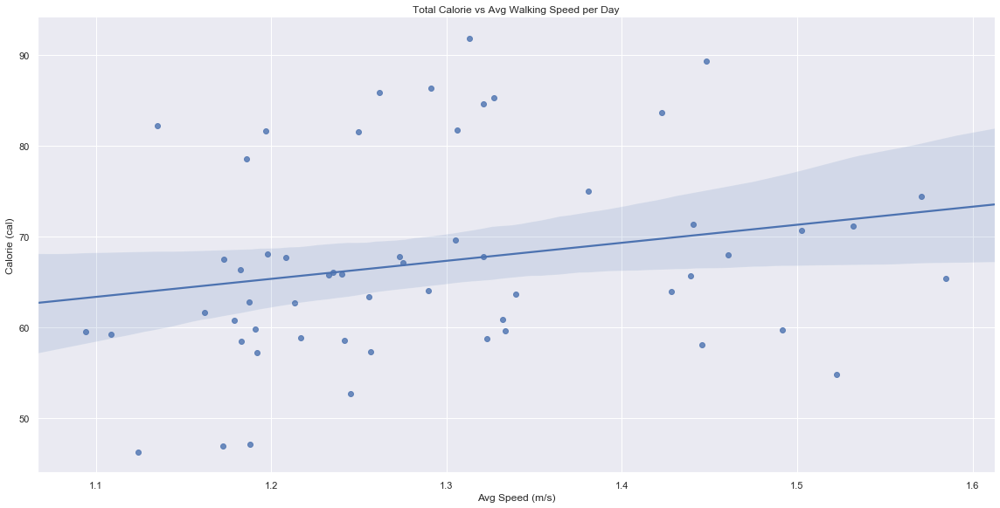

In [183]:
sns.lmplot(x='mean_speed',y='calorie',data=walk_df_2,fit_reg=True,size = 8,aspect =2) 
plt.title('Total Calorie vs Avg Walking Speed per Day')
plt.xlabel('Avg Speed (m/s)')
plt.ylabel('Calorie (cal)')

## Further analysis based on calorie-duration correlation:

In [184]:
# plotting the graph after removing calorie outliers
fig = px.scatter(walk_df, x='exercise_duration_minutes', y='calorie',color='mean_speed', marginal_y="box",
           marginal_x="box",trendline="ols")
fig.show()

C:\Users\Taraneh\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



### Based on this graph and information on Exercise Calorie chart, we can estimate person's weight. In our graph, the line equation is: calorie=3.736*exercise_duration_min + 8.316.
### The person's median speed is 1.27 m/s (2.84 mph). From the equation, for 15 minutes and 30 minutes, the calorie can be calculated as 64.356 cal and 120.396 cal. respectively. Based on the calorie chart, these values correspond to a person with about 175 lb (79 kg) weight.

## Correlation between daily exercise and sleep (i.e. the effect of daily exercise on the sleep duration and sleep efficiency)

In [185]:
merged_exercise.loc[:,'start_date']=merged_exercise.loc[:,'start_date'].astype(str)
merged_1.loc[:,'date']=merged_1.loc[:,'date'].astype(str)
merged_sleep_exercise = pd.merge(left=merged_exercise, right=merged_1, left_on='start_date', right_on='date').reset_index()
merged_sleep_exercise

#merged_inner_1['duration']=pd.to_timedelta(exercise_df['duration'],unit='ms')


,index,index_x,start_date,calorie,exercise_duration_minutes,time_offset,day_of_week_x,index_y,date,efficiency,quality,sleep_duration,day_of_week_y,time_zone,week_number
0,0,5,2017-12-19,160.901,30.272167,UTC-0400,Tuesday,2,2017-12-19,93.174065,NaN,273.000010,Tuesday,UTC-0400,0
1,1,6,2017-12-24,553.224,61.963850,UTC-0700,Sunday,6,2017-12-24,93.262410,NaN,525.067368,Sunday,UTC-0700,0
2,2,8,2017-12-29,366.661,68.925250,UTC-0700,Friday,10,2017-12-29,92.952385,NaN,487.070497,Friday,UTC-0700,1
3,3,9,2017-12-30,68.120,15.875533,UTC-0700,Saturday,11,2017-12-30,89.778534,NaN,526.102209,Saturday,UTC-0700,1
4,4,10,2017-12-31,385.162,31.352950,UTC-0700,Sunday,12,2017-12-31,90.506050,NaN,478.189880,Sunday,UTC-0700,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,297,313,2019-04-27,1786.680,324.496533,UTC-0600,Saturday,470,2019-04-27,82.000000,NaN,402.620000,Saturday,UTC-0600,68
298,298,314,2019-04-29,205.070,44.552350,UTC-0300,Monday,472,2019-04-29,84.000000,NaN,455.280000,Monday,UTC-0300,69
299,299,315,2019-04-30,309.020,58.081467,UTC-0300,Tuesday,473,2019-04-30,89.000000,NaN,389.820000,Tuesday,UTC-0300,69
300,300,316,2019-05-02,336.000,40.000000,UTC-0300,Thursday,475,2019-05-02,91.000000,NaN,405.860000,Thursday,UTC-0300,69


In [186]:
merged_sleep_exercise.drop(columns=['index_x','time_zone','day_of_week_x','index_y'], axis=1, inplace=True)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Sleep Duration vs Exercise Duration')

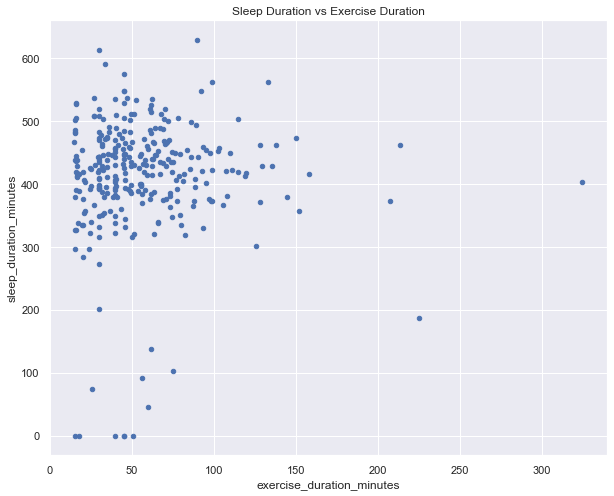

In [187]:
ax_16=merged_sleep_exercise.plot.scatter(y='sleep_duration',x='exercise_duration_minutes',figsize=(10,8))
ax_16.set_ylabel('sleep_duration_minutes')
plt.title('Sleep Duration vs Exercise Duration')

### The graph above, does not show any correlation between exercise duration and sleep duration. We need to analyze further to find the effect of different parameters on sleep duration.

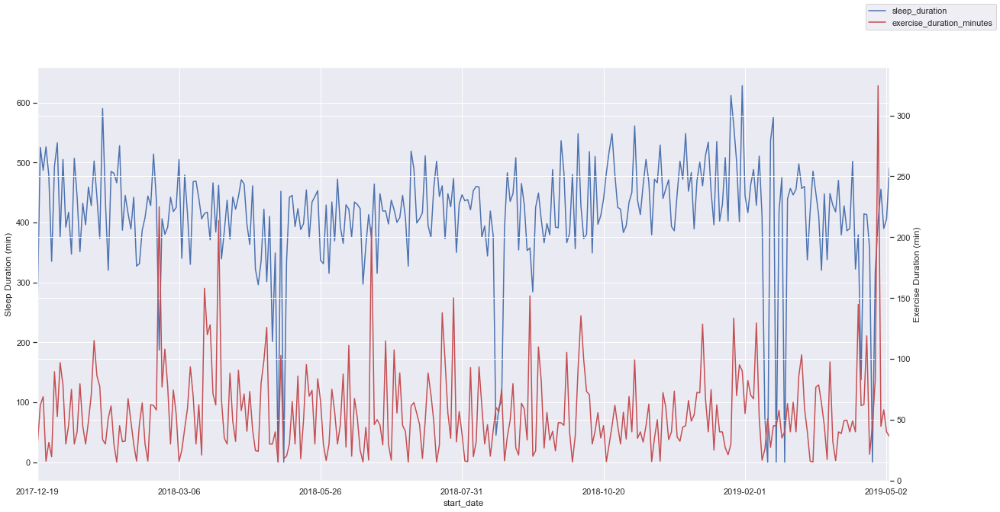

In [188]:
ax_11 = merged_sleep_exercise.plot(x="start_date", y="sleep_duration", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_sleep_exercise.plot(x="start_date", y="exercise_duration_minutes", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Exercise Duration (min)')
ax_11.set_ylabel('Sleep Duration (min)')

plt.show()

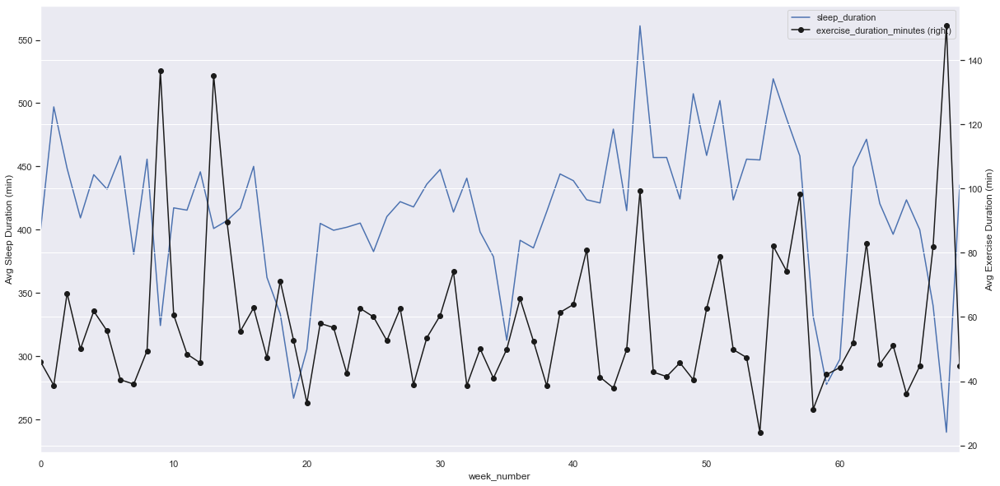

In [189]:
ax_17=merged_sleep_exercise.groupby('week_number').sleep_duration.mean().plot(x="week_number", y="sleep_duration", kind="line", legend=True,figsize=(20,10))
ax = merged_sleep_exercise.groupby('week_number').mean()['exercise_duration_minutes'].plot(secondary_y=True, color='k', marker='o',legend=True)
ax.set_ylabel('Avg Exercise Duration (min)')
ax_17.set_ylabel('Avg Sleep Duration (min)')
plt.show()

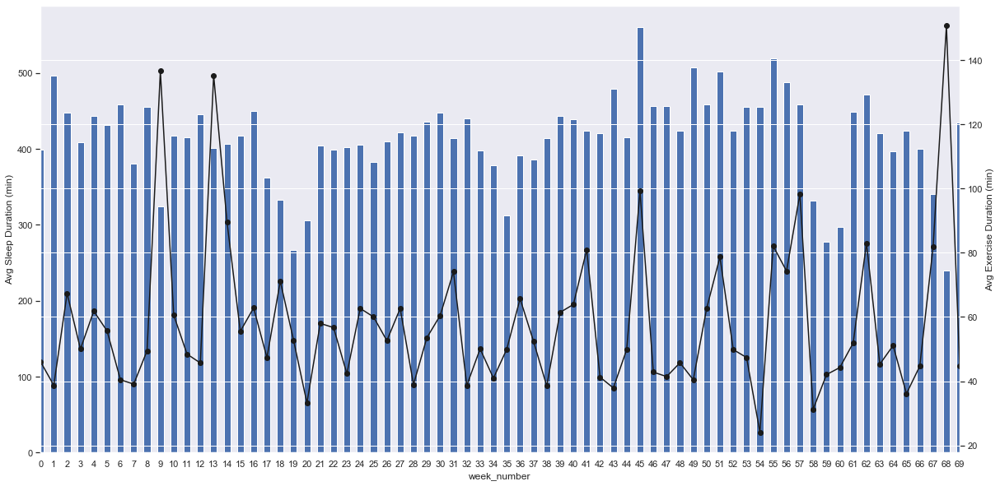

In [190]:
ax_17=merged_sleep_exercise.groupby('week_number').sleep_duration.mean().plot(x="week_number", y="sleep_duration",stacked=True, kind="bar", legend=False,figsize=(20,10))
ax = merged_sleep_exercise.groupby('week_number').mean()['exercise_duration_minutes'].plot(secondary_y=True, color='k', marker='o')
ax.set_ylabel('Avg Exercise Duration (min)')
ax_17.set_ylabel('Avg Sleep Duration (min)')
plt.show()

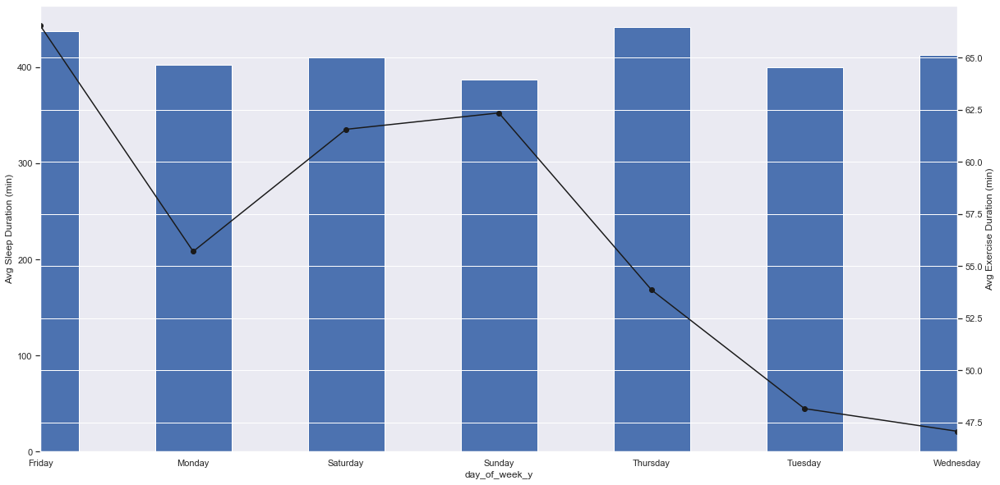

In [191]:
ax_18=merged_sleep_exercise.groupby('day_of_week_y').sleep_duration.mean().plot(x="day_of_week_y", y="sleep_duration",stacked=True, kind="bar", legend=False,figsize=(20,10))
ax = merged_sleep_exercise.groupby('day_of_week_y').mean()['exercise_duration_minutes'].plot(secondary_y=True, color='k', marker='o')
ax.set_ylabel('Avg Exercise Duration (min)')
ax_18.set_ylabel('Avg Sleep Duration (min)')

plt.show()

### Overall looking at the graphs above, sleep duration and exercise duration are not correlated.

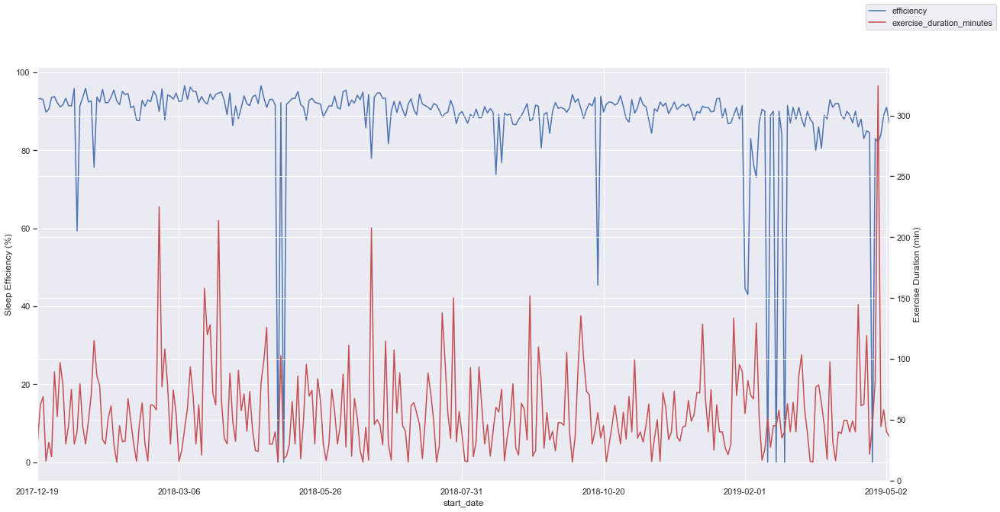

In [192]:
ax_11 = merged_sleep_exercise.plot(x="start_date", y="efficiency", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_sleep_exercise.plot(x="start_date", y="exercise_duration_minutes", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Exercise Duration (min)')
ax_11.set_ylabel('Sleep Efficiency (%)')

plt.show()

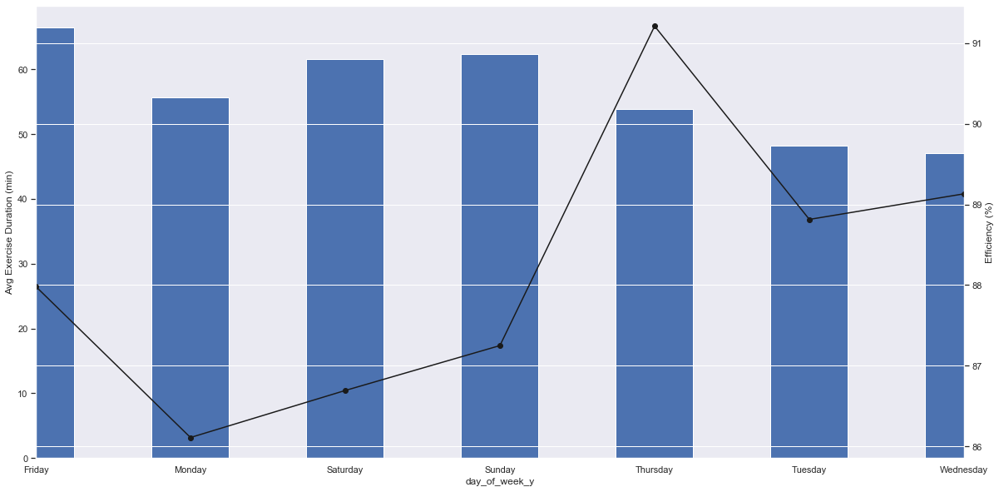

In [193]:
ax_17=merged_sleep_exercise.groupby('day_of_week_y').exercise_duration_minutes.mean().plot(x="day_of_week_y", y="exercise_duration_minutes",stacked=True, kind="bar", legend=False,figsize=(20,10))
ax = merged_sleep_exercise.groupby('day_of_week_y').mean()['efficiency'].plot(secondary_y=True, color='k', marker='o')
ax.set_ylabel('Efficiency (%)')
ax_17.set_ylabel('Avg Exercise Duration (min)')
plt.show()


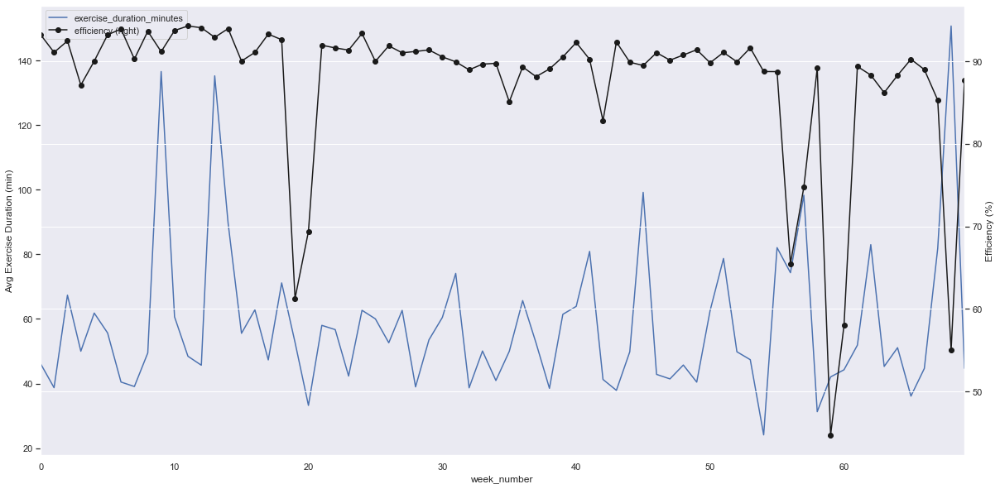

In [194]:
ax_17=merged_sleep_exercise.groupby('week_number').exercise_duration_minutes.mean().plot(x="week_number", y="exercise_duration_minutes", kind="line", legend=True,figsize=(20,10))
ax = merged_sleep_exercise.groupby('week_number').mean()['efficiency'].plot(secondary_y=True, color='k', marker='o',legend=True)
ax.set_ylabel('Efficiency (%)')
ax_17.set_ylabel('Avg Exercise Duration (min)')
plt.show()

The graph for avg exercise duration vs week number shows that sleep efficiency trend is mostly the same as exercise duration. The differences are mostly at the weeks that extremes occured (very low efficiency or long time exercise).To understand the correlation better, the outliers are removed as following:

In [195]:
S_E_1=remove_outlier(merged_sleep_exercise,'exercise_duration_minutes')


In [196]:
S_E_2=remove_outlier(S_E_1,'efficiency')

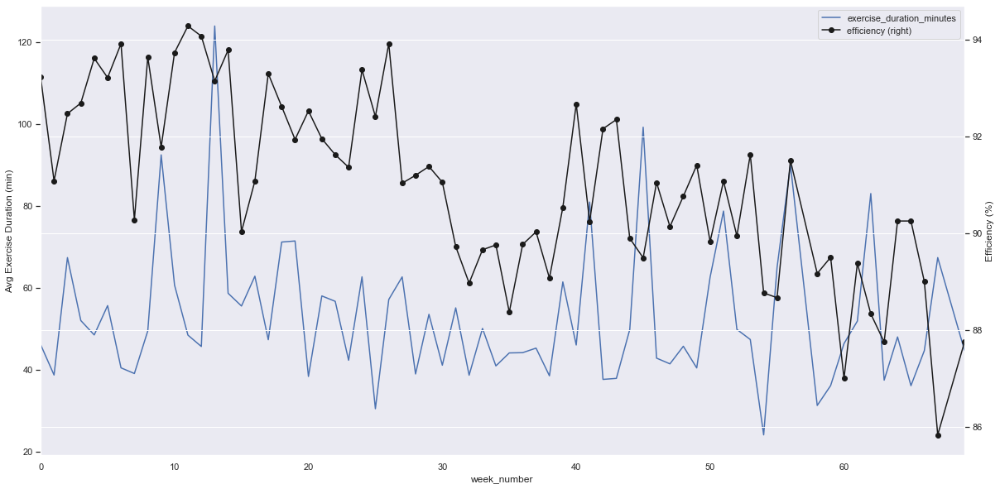

In [197]:
ax_17=S_E_2.groupby('week_number').exercise_duration_minutes.mean().plot(x="week_number", y="exercise_duration_minutes", kind="line", legend=True,figsize=(20,10))
ax = S_E_2.groupby('week_number').mean()['efficiency'].plot(secondary_y=True, color='k', marker='o',legend=True)
ax.set_ylabel('Efficiency (%)')
ax_17.set_ylabel('Avg Exercise Duration (min)')
plt.show()

In [198]:
S_E_3=remove_outlier(S_E_2,'exercise_duration_minutes')

In [199]:
S_E_4=remove_outlier(S_E_3,'efficiency')

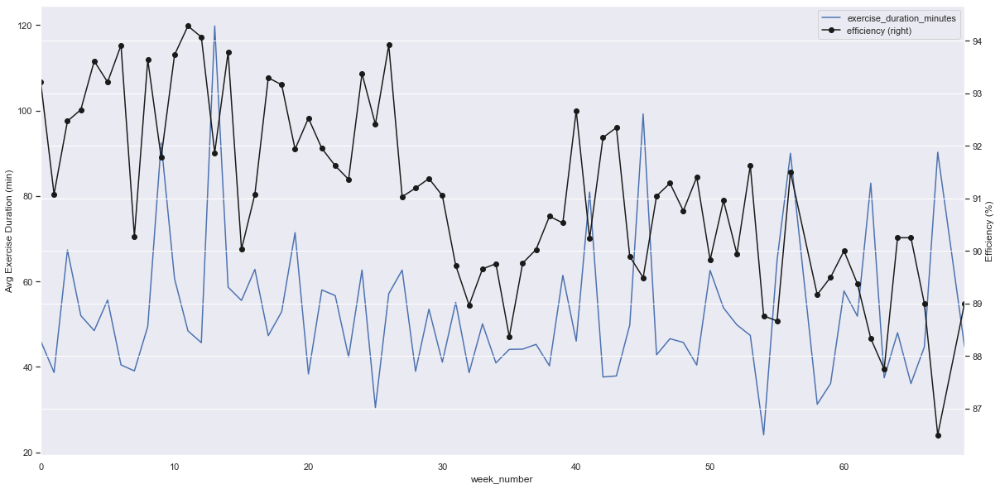

In [200]:
ax_17=S_E_4.groupby('week_number').exercise_duration_minutes.mean().plot(x="week_number", y="exercise_duration_minutes", kind="line", legend=True,figsize=(20,10))
ax = S_E_4.groupby('week_number').mean()['efficiency'].plot(secondary_y=True, color='k', marker='o',legend=True)
ax.set_ylabel('Efficiency (%)')
ax_17.set_ylabel('Avg Exercise Duration (min)')
plt.show()

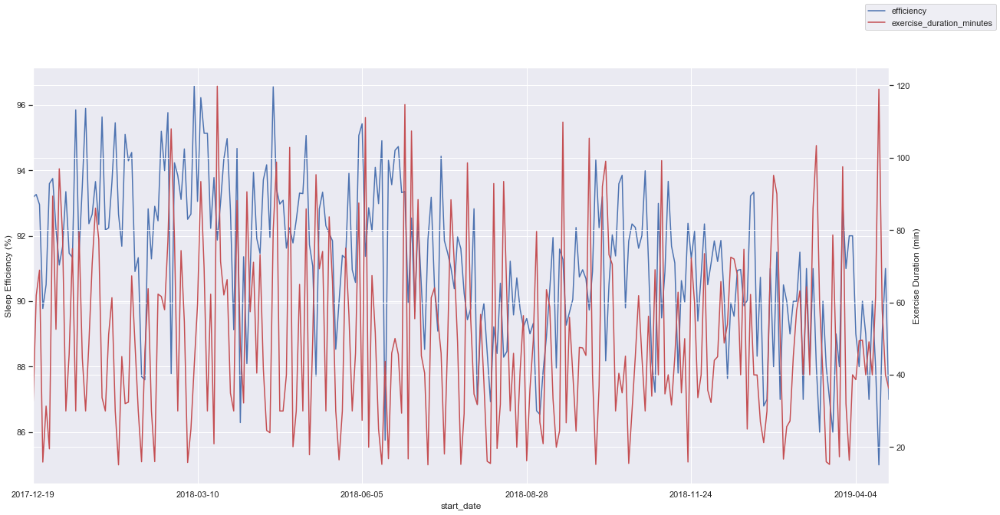

In [201]:
ax_11 = S_E_4.plot(x="start_date", y="efficiency", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
S_E_4.plot(x="start_date", y="exercise_duration_minutes", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Exercise Duration (min)')
ax_11.set_ylabel('Sleep Efficiency (%)')

plt.show()

C:\Users\Taraneh\Anaconda3\lib\site-packages\seaborn\regression.py:546: UserWarning:

The `size` paramter has been renamed to `height`; please update your code.



Text(9.925000000000004, 0.5, 'Efficiency (%)')

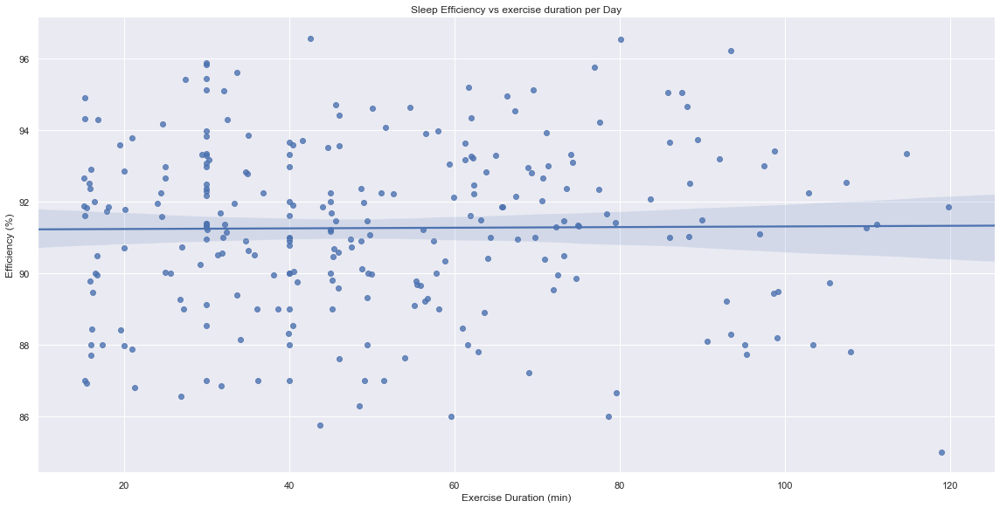

In [202]:
sns.lmplot(x='exercise_duration_minutes',y='efficiency',data=S_E_4,fit_reg=True,size = 8,aspect =2) 
plt.title('Sleep Efficiency vs exercise duration per Day')
plt.xlabel('Exercise Duration (min)')
plt.ylabel('Efficiency (%)') 


### The graph above shows that even after removing outliers, sleep efficiency and exercise duration are not correlated.

## Analyzing based on Travel and No Travel times

In [203]:
merged_sleep_exercise.loc[((merged_sleep_exercise.time_offset == 'UTC-0400')| (merged_sleep_exercise.time_offset == 'UTC-0300')), 'status'] = 'No_Travel'
merged_sleep_exercise.loc[((merged_sleep_exercise.time_offset == 'UTC-0700')| (merged_sleep_exercise.time_offset == 'UTC+0300')| (merged_sleep_exercise.time_offset == 'UTC-0600')), 'status'] = 'Travel'

In [204]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='efficiency',color='status')
fig.show()

In [205]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='calorie',color='status')
fig.show()

In [206]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='exercise_duration_minutes',color='status')
fig.show()

### The graphs above show that he/she exercised a lot (high duration and calorie burn) and could not sleep for one day during the travel of Apr 2019. 

## Analyzing based on day of week

C:\Users\Taraneh\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

`Series.plot()` should not be called with positional arguments, only keyword arguments. The order of positional arguments will change in the future. Use `Series.plot(kind='bar')` instead of `Series.plot('bar',)`.



Text(0, 0.5, 'Day of Week')

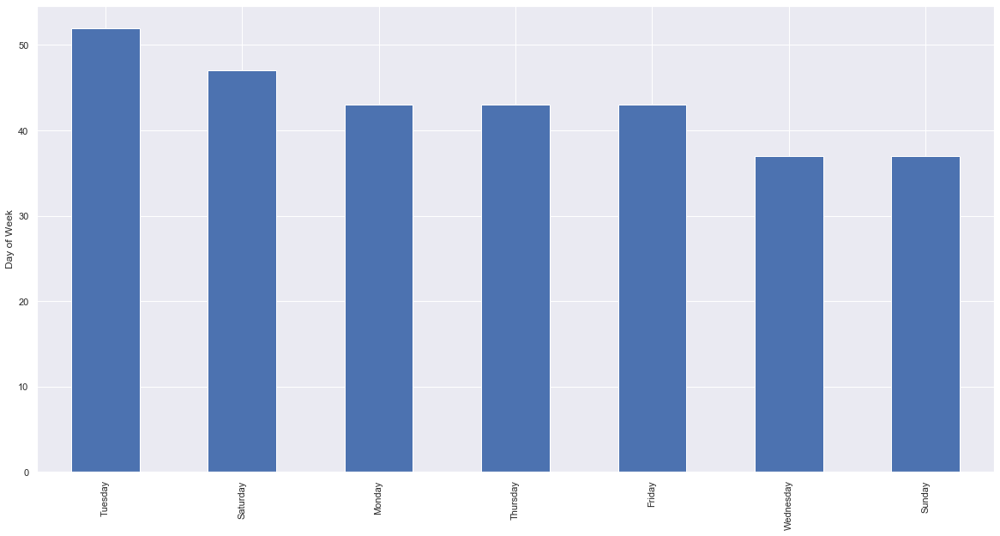

In [207]:
ax=merged_sleep_exercise['day_of_week_y'].value_counts().plot('bar',figsize=(20,10))
ax.set_ylabel('Frequency')
ax.set_ylabel('Day of Week')

### Based on the graph above, the person exercises most frequently on Tuesdays and least frequently on Sundays.

In [208]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='exercise_duration_minutes',color='day_of_week_y')
fig.show()

In [209]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='efficiency',color='calorie')
fig.show()

In [210]:
by_week_day=merged_sleep_exercise.groupby('day_of_week_y', as_index=False).agg({'calorie':'mean','exercise_duration_minutes':'mean','efficiency':'mean','sleep_duration':'mean'})

In [211]:
fig = px.scatter(by_week_day, x="calorie", y='efficiency', size="sleep_duration", color="day_of_week_y",
           hover_name="day_of_week_y", log_x=True, size_max=60)
fig.update_layout(title='Sleep Efficiency vs Calorie for each Day of Week',
                   xaxis_title='Calorie (cal)',
                   yaxis_title='Sleep Efficiency (%)',
            )
fig.show()

### In the first graph above, we can see distribution of person's exercise duration of each day and day of week. In the second graph, sleep efficiency of each day and the calorie burnt each day is shown. We don not see any interesting trends in those graphs. In the third graph, we can see average sleep efficiency as a variable of calories burnt per day and day of week. Based on this graph, he/she has the highest sleep efficiency on Thursday and the lowest sleep efficiency on Monday. Also, he/she burns least calories on Tuesdays and most calories on Friday. 

In [212]:
fig=px.scatter(merged_sleep_exercise, x='start_date', y='sleep_duration',color='calorie')
fig.show()

### Based on the graph above, sleep duration does not depend much on the calories spent per day. It can be due to not having a big range of calors for calorie bar. Therefore, it may help to remove few calorie outliers and replot

In [213]:
merged_sleep_exercise_wo_high_calories=remove_outlier(merged_sleep_exercise,'calorie')

In [214]:
merged_sleep_exercise_wo_high_calories_low_duration=remove_outlier(merged_sleep_exercise_wo_high_calories,'sleep_duration')

In [215]:
fig=px.scatter(merged_sleep_exercise_wo_high_calories, x='start_date', y='sleep_duration',color='calorie')
fig.show()

### The graph above still does not show any correlation between sleep duration and calories.

In [216]:
fig = px.scatter(merged_sleep_exercise_wo_high_calories_low_duration, x='calorie', y='sleep_duration', marginal_y="box",
           marginal_x="box",trendline="ols")
fig.show()

C:\Users\Taraneh\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



### Based on the graph above, even after removing outliers of Calorie and sleep duration, there is no correlation between sleep duration and calorie spent each day.  The person usually burns  205 - 378 cal per day with median value of 297 cal. He/ She usually sleeps for 389 - 464 minutes per day with median value of 429 minutes. 

In [217]:
fig = px.scatter(merged_sleep_exercise, x='start_date', y='exercise_duration_minutes',color='day_of_week_y', marginal_y="box")
fig.show()

### Based on the graph above, we can see exercise duration distribution of the person per day of week. The highest durations are for Friday and Sunday (median value of 59-60 min) and the lowest duration are for Tuesday and Thursday (median value of 40 minutes).

In [218]:
fig = px.scatter(merged_sleep_exercise, x='exercise_duration_minutes', y='calorie',color='status', marginal_y="violin",
           marginal_x="box",trendline="ols")
fig.show()

### Based on the graph above, the person usually exercised for 38-79 minutes (median value of 62 minutes) during vacation and 30-70 minutes(median value of 46 minutes) when not on vacation. Also, he/she spent median value of 328 cal on vacation and 305 cal when not on vacation.

## Heart Rate Data

In [7]:
heart_rate_df = pd.read_csv("heart_rate.csv", delimiter=',')
heart_rate_df

,Unnamed: 0,end_time,heart_rate,binning_data,start_time,heart_beat_count,update_time,max,min,pkg_name,time_offset,datauuid,create_time
0,0,2017-12-16 04:30:29.450,60.0,NaN,2017-12-16 04:30:29.450,1,2017-12-16 04:35:00.341,0.0,0.0,com.sec.android.app.shealth,UTC-0400,00978ee8-6b03-16cb-7bba-d22949a728cb,2017-12-16 04:35:00.341
1,1,2017-12-16 05:50:29.380,56.0,NaN,2017-12-16 05:50:29.380,1,2017-12-16 05:55:00.264,0.0,0.0,com.sec.android.app.shealth,UTC-0400,038d68e5-ddb9-df1f-f52f-4f85c32cb95a,2017-12-16 05:55:00.264
2,2,2017-12-30 02:08:16.211,55.0,NaN,2017-12-30 02:08:16.211,1,2017-12-30 02:08:16.411,0.0,0.0,com.sec.android.app.shealth,UTC-0700,0423adf2-6d1f-6e23-276b-ec25462bf3d5,2017-12-30 02:08:16.411
3,3,2018-01-15 14:47:37.175,62.0,NaN,2018-01-15 14:47:37.175,1,2018-01-15 14:47:37.371,0.0,0.0,com.sec.android.app.shealth,UTC-0400,07dc6531-0aa6-1b07-df29-049197357434,2018-01-15 14:47:37.371
4,4,2017-12-16 02:20:29.470,47.0,NaN,2017-12-16 02:20:29.470,1,2017-12-16 02:35:00.252,0.0,0.0,com.sec.android.app.shealth,UTC-0400,0a32cb55-8257-d3ae-e87a-e38ecb14fe97,2017-12-16 02:35:00.252
...,...,...,...,...,...,...,...,...,...,...,...,...,...
306,306,2018-01-27 03:10:29.317,56.0,NaN,2018-01-27 03:10:29.317,1,2018-01-27 03:15:01.234,0.0,0.0,com.sec.android.app.shealth,UTC-0400,feca46c6-c0cc-a36b-cf84-83eeae14b9b9,2018-01-27 03:15:01.234
307,307,2018-01-28 03:10:59.537,56.0,NaN,2018-01-28 03:10:59.537,1,2018-01-28 03:15:01.247,0.0,0.0,com.sec.android.app.shealth,UTC-0400,ff3053ff-477a-e81e-8a79-61b9dcde6d25,2018-01-28 03:15:01.247
308,308,2017-12-01 08:24:43.615,88.0,NaN,2017-12-01 08:24:43.615,0,2017-12-01 08:24:56.689,88.0,88.0,com.sec.android.app.shealth,UTC-0400,ff71138c-658e-4fbd-8999-fc876df41091,2017-12-01 08:24:56.689
309,309,2017-12-16 05:20:29.440,54.0,NaN,2017-12-16 05:20:29.440,1,2017-12-16 05:35:00.311,0.0,0.0,com.sec.android.app.shealth,UTC-0400,ff724a98-2fa7-7572-136b-90bae95a43ea,2017-12-16 05:35:00.311


In [8]:
heart_rate_df['start_date']=pd.to_datetime(heart_rate_df['start_time']).dt.date
heart_rate_df['start']=pd.to_datetime(heart_rate_df['start_time']).dt.time

In [9]:
heart_rate_df['start_year']=pd.to_datetime(heart_rate_df['start_time']).dt.year

In [222]:
heart_rate_df.isna().sum()

Unnamed: 0              0
create_time             0
time_offset             0
max                    17
heart_beat_count        0
custom              24278
end_time                0
heart_rate              0
deviceuuid              0
start_time              0
pkg_name                0
update_time             0
min                    17
binning_data        24232
datauuid                0
comment             24278
start_date              0
start                   0
start_year              0
dtype: int64

In [223]:
heart_rate_df.drop(columns=['binning_data','heart_beat_count','max','min','pkg_name','datauuid','custom','comment'], axis=1, inplace=True)

In [224]:
#qgrid_widget_5=qgrid.show_grid(heart_rate_df,show_toolbar=True)

#qgrid_widget_5

In [225]:
heart_rate_df=heart_rate_df.drop([405 , 406]) #2 outliers for start_date (year 1969)

In [11]:
heart_rate_2=heart_rate_df[heart_rate_df.start_year != 2016]

In [13]:
heart_rate_2.loc[:,'start_hour']=pd.to_datetime(heart_rate_2.loc[:,'start_time']).dt.hour

### Average heart rate per day

In [330]:
bydate_heart_rate=heart_rate_2[['start_date','heart_rate']].groupby('start_date').mean().reset_index()
bydate_heart_rate

,start_date,heart_rate
0,2017-02-13,49.000000
1,2017-03-07,71.000000
2,2017-05-14,56.000000
3,2017-09-17,56.000000
4,2017-11-06,93.500000
...,...,...
394,2019-05-05,59.783784
395,2019-05-06,70.333333
396,2019-05-10,66.321429
397,2019-05-11,57.597222


In [229]:
bydate_heart_rate.describe()

,heart_rate
count,399.000000
mean,62.160686
std,9.834683
min,49.000000
25%,58.651339
50%,60.666667
75%,62.580940
max,166.500000


Text(0.5, 1.0, 'Heart Rate Distribution')

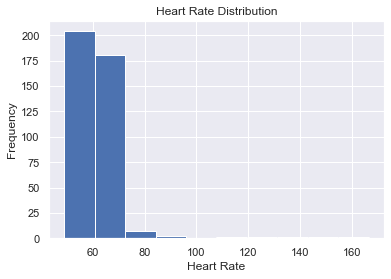

In [230]:
ax_20=bydate_heart_rate['heart_rate'].hist()
ax_20.set_ylabel("Frequency")
ax_20.set_xlabel("Heart Rate")

plt.title('Heart Rate Distribution')

Text(0.5, 1.0, 'Avg Heart Rate per day ')

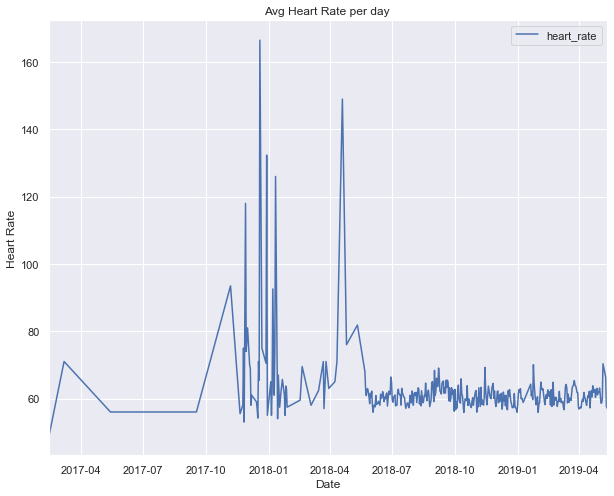

In [231]:
#merged_exercise.loc[:,'offset_start_date']=merged_exercise.loc[:,'offset_start_date'].astype(str)
ax_21=bydate_heart_rate.plot(x='start_date',y='heart_rate',figsize=(10,8),kind='line')
ax_21.set_xlabel('Date')
ax_21.set_ylabel('Heart Rate')
#ax_21.set_xlim('2017-07','2018-01')
plt.title('Avg Heart Rate per day ')

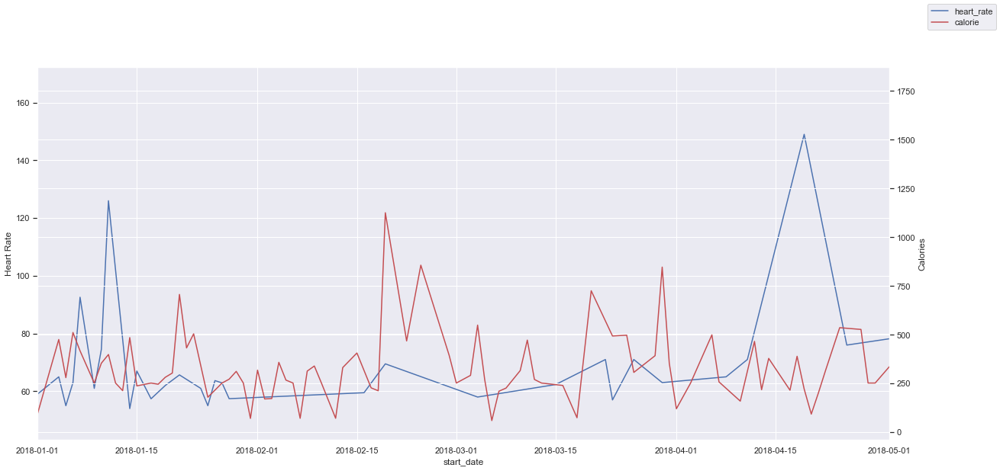

In [232]:
merged_exercise.loc[:,'start_date']=pd.to_datetime(merged_exercise['start_date'])
ax_11 = bydate_heart_rate.plot(x="start_date", y="heart_rate", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_exercise.plot(x="start_date", y="calorie", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Calories')
ax_11.set_ylabel('Heart Rate')
ax_12.set_xlim('2018-01','2018-05')

plt.show()

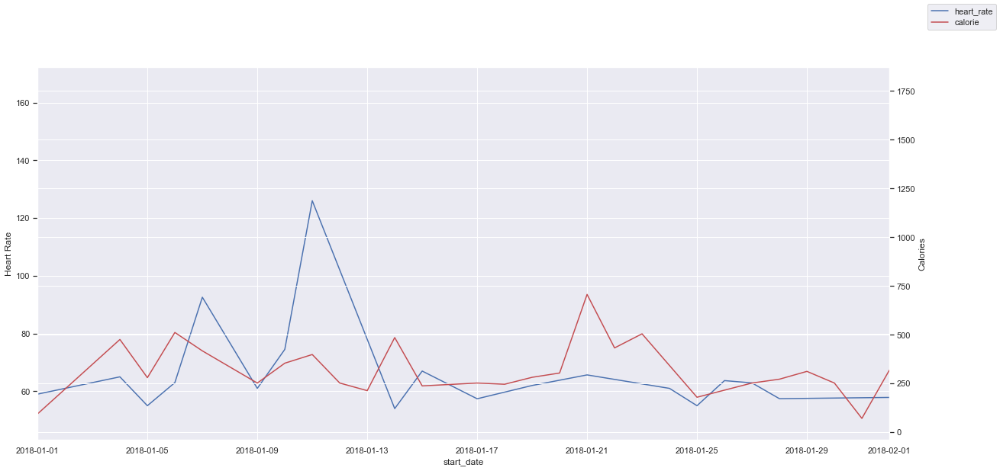

In [233]:
merged_exercise.loc[:,'start_date']=pd.to_datetime(merged_exercise['start_date'])
ax_11 = bydate_heart_rate.plot(x="start_date", y="heart_rate", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_exercise.plot(x="start_date", y="calorie", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Calories')
ax_11.set_ylabel('Heart Rate')
ax_12.set_xlim('2018-01','2018-02')

plt.show()

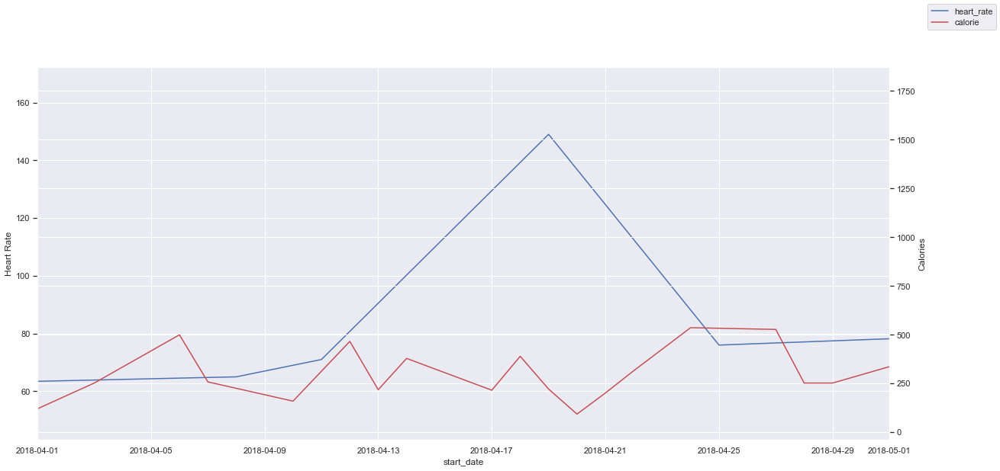

In [234]:
merged_exercise.loc[:,'start_date']=pd.to_datetime(merged_exercise['start_date'])
ax_11 = bydate_heart_rate.plot(x="start_date", y="heart_rate", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_exercise.plot(x="start_date", y="calorie", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Calories')
ax_11.set_ylabel('Heart Rate')
ax_12.set_xlim('2018-04','2018-05')

plt.show()

### Based on the graphs above, the person's heart rate is usually steady. There were few instances that he/she had spikes in heart rate. 2 times in Jan. 2018 was probably because of hard exercise (since the calorie was high too). The other time in Apr. 2018 was a gradual increase in heart rate and had the same rate as it decreased to normal heart rate. This might be because of heart problem or an stressful event in the period of life

In [235]:
bydate_heart_rate_max=heart_rate_2[['start_date','heart_rate']].groupby('start_date').max().reset_index()

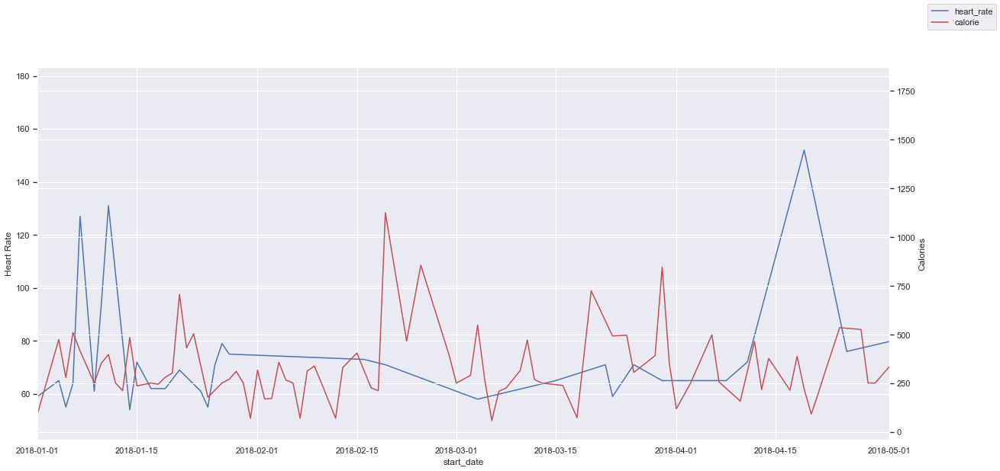

In [236]:
#merged_exercise.loc[:,'offset_start_date']=pd.to_datetime(merged_exercise['offset_start_date'])
ax_11 = bydate_heart_rate_max.plot(x="start_date", y="heart_rate", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
merged_exercise.plot(x="start_date", y="calorie", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Calories')
ax_11.set_ylabel('Heart Rate')
ax_12.set_xlim('2018-01','2018-05')

plt.show()

The trend for maximum heart rate per day is almost the same as mean heart rate so the previous analysis stays valid.

## Steps count data

In [237]:
steps_df = pd.read_csv("step_count.csv", delimiter=',')

In [238]:
steps_df['start_date']=pd.to_datetime(steps_df['start_time']).dt.date
steps_df['start']=pd.to_datetime(steps_df['start_time']).dt.time

In [239]:
#Adjusting the start time based on time zone
def offset(dataframe,columnname_offset,columnname_torewrite):
    column_offset=[]
    hr= lambda a : int(a[3:6])
    mins= lambda a : int(a[3]+a[6:8])
    for i in dataframe.index:
        hour=(hr(dataframe[columnname_offset][i]))
        minute=(mins(dataframe[columnname_offset][i]))
        human_readable_time=pd.to_datetime(dataframe[columnname_torewrite][i])
        new_time=human_readable_time+datetime.timedelta(hours=hour, minutes=minute )
        column_offset.append(new_time)
    return column_offset

# Apply the offset and create new columns. 
steps_df['offset_start']=offset(steps_df, 'time_offset', 'start_time')


In [240]:
steps_df['start_hour']=pd.to_datetime(steps_df['offset_start']).dt.hour

In [241]:
steps_df['offset_start_date']=pd.to_datetime(steps_df['offset_start']).dt.date

In [242]:
steps_df.drop(columns=['pkg_name','datauuid'], axis=1, inplace=True)

In [243]:
steps_df.loc[:,'speed int'] = steps_df.loc[:,'speed'].astype(int)

In [244]:
#qgrid_widget_7=qgrid.show_grid(steps_df,show_toolbar=True)

#qgrid_widget_7

QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

In [245]:
steps_df=steps_df.loc[steps_df['count'] != 0]

Text(0.5, 1.0, 'Steps Count Distribution')

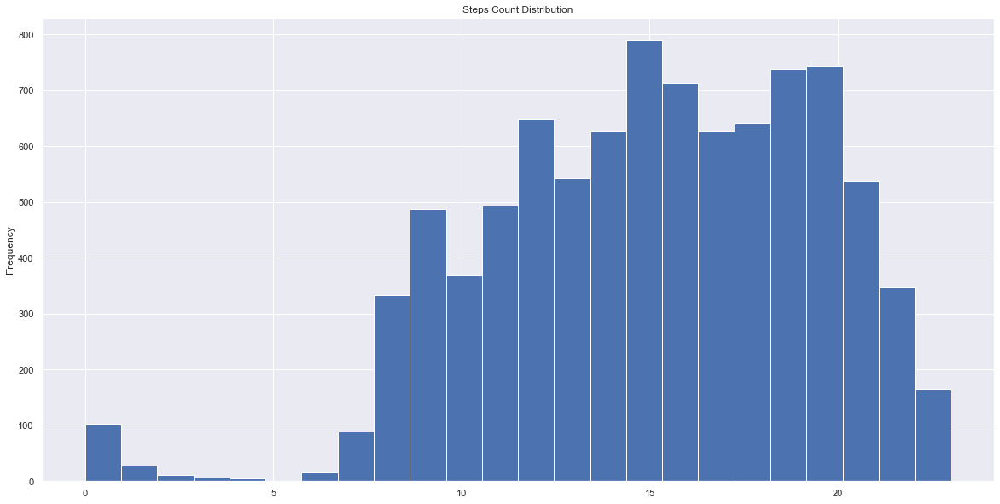

In [246]:
ax_25=steps_df['start_hour'].hist(bins=24,figsize=(20,10))
ax_25.set_ylabel("Frequency")
plt.title('Steps Count Distribution')

Text(0, 0.5, 'Avg Steps Count')

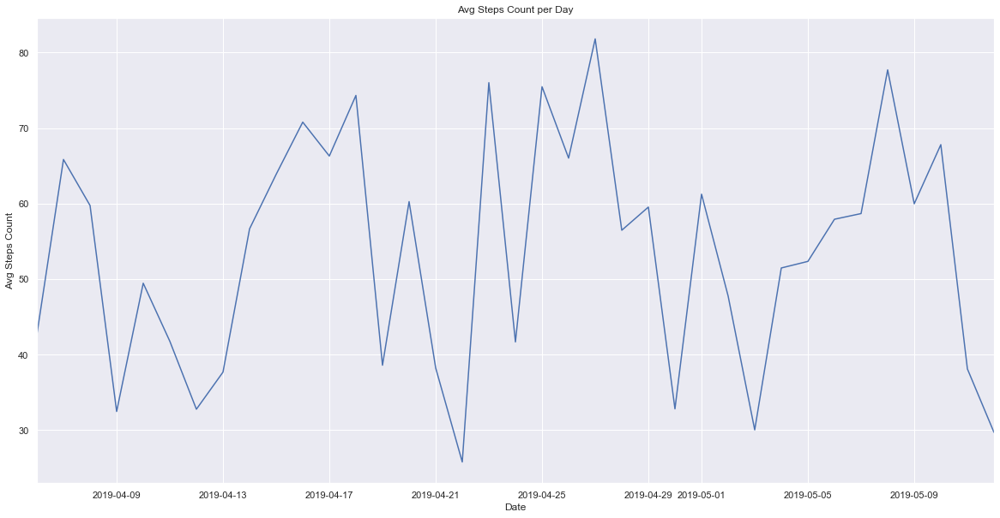

In [247]:
steps_df.groupby('start_date').mean()['count'].plot(kind='line',stacked=True,figsize=(20,10))
plt.title('Avg Steps Count per Day')
plt.xlabel('Date')
plt.ylabel('Avg Steps Count') 

In [248]:
by_hour_sum_steps=steps_df.groupby('start_hour').sum()[['count','calorie','distance']].reset_index()


Text(0, 0.5, 'Avg Steps Count')

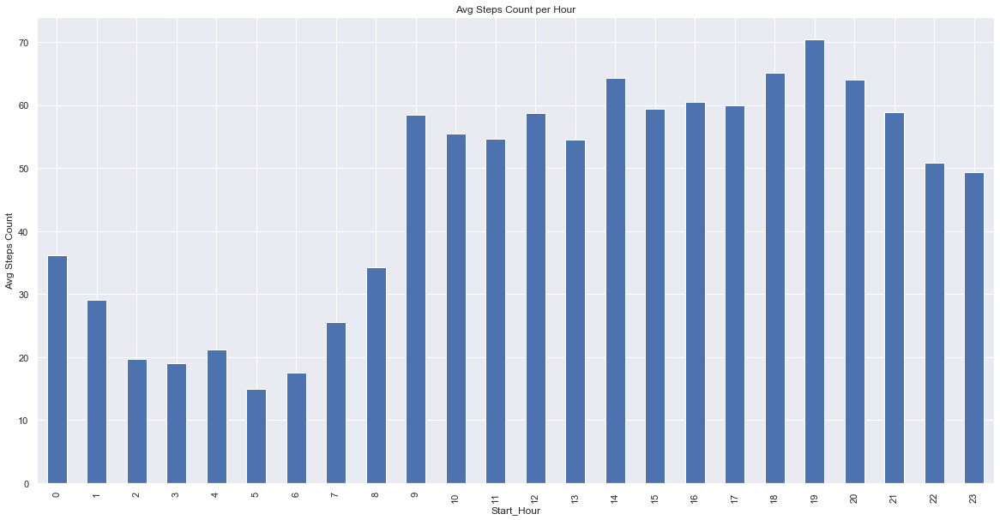

In [249]:
steps_df.groupby('start_hour').mean()['count'].plot(kind='bar',stacked=True, figsize=(20,10))
plt.title('Avg Steps Count per Hour')
plt.xlabel('Start_Hour')
plt.ylabel('Avg Steps Count') 

Text(0, 0.5, 'Total Steps Count')

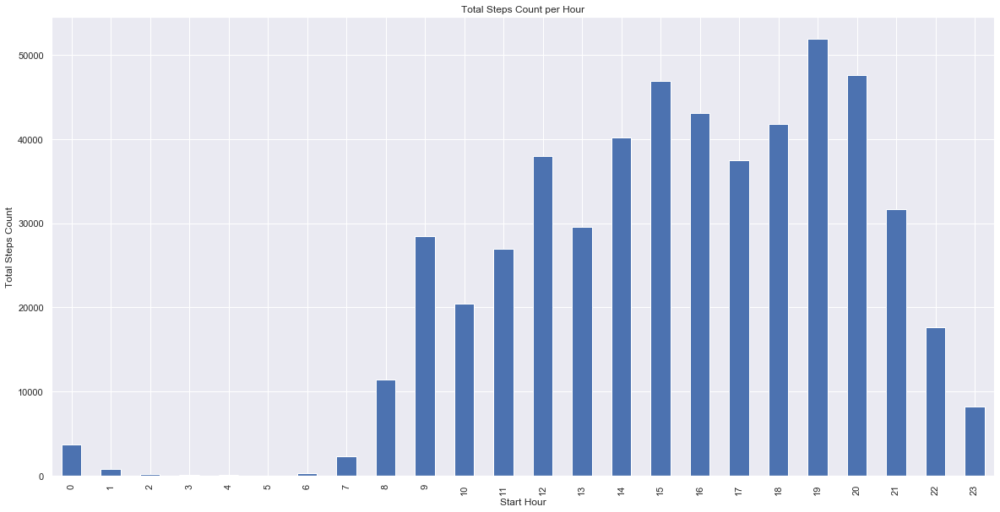

In [250]:
steps_df.groupby('start_hour').sum()['count'].plot(kind='bar',stacked=True, figsize=(20,10))
plt.title('Total Steps Count per Hour')
plt.xlabel('Start Hour')
plt.ylabel('Total Steps Count') 

### Based on above graphs for steps counts per hour, the person normally walks at 9 am- 11 pm. The highest average steps count was for 7 pm followed by 8 pm and the lowest for 1 am - 7 am when he/she is sleeping. 

Text(0.5, 0, 'Start Hour')

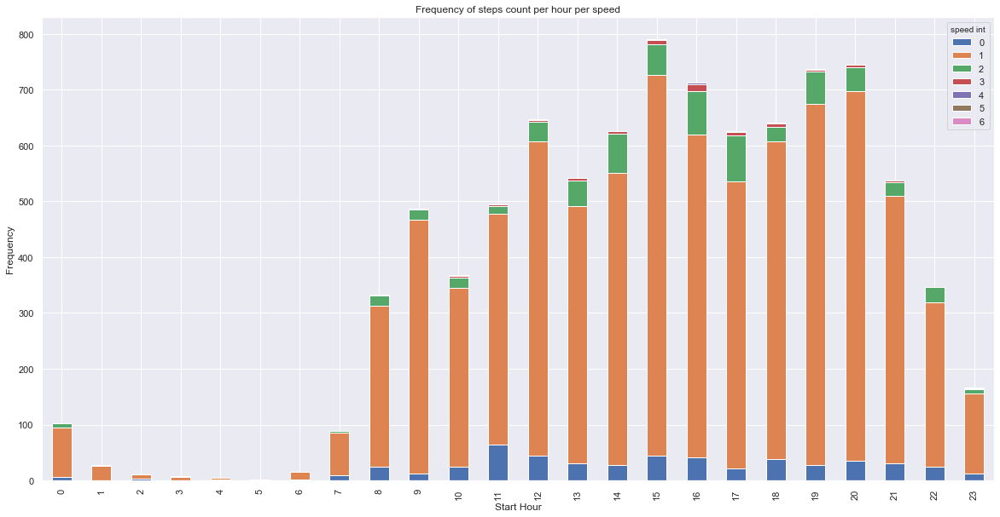

In [251]:
ax_10=steps_df.groupby(['start_hour','speed int']).start_time.count().unstack().plot(kind='bar',stacked=True, figsize=(20,10))
ax_10.set_ylabel("Frequency")
plt.title('Frequency of steps count per hour per speed')
plt.xlabel('Start Hour')


### According to above graph, he/she mostly has speed of between 1-2 m/s. 

In [252]:
by_date_sum_steps=steps_df.groupby('offset_start_date').sum()[['count','calorie','distance']].reset_index()
by_date_sum_steps

,offset_start_date,count,calorie,distance
0,2019-04-06,7907,328.609996,5685.671009
1,2019-04-07,48144,1981.908947,34255.151860
2,2019-04-08,33448,1296.340945,24219.228173
3,2019-04-09,4964,214.410000,3606.107002
4,2019-04-10,10205,446.141000,7053.076000
5,2019-04-11,3254,142.750000,2225.216005
6,2019-04-12,6151,257.800001,4546.258001
7,2019-04-13,12199,509.899985,8884.609976
8,2019-04-14,22531,954.109995,16207.866982
9,2019-04-15,15302,801.790000,12313.399996


Text(0, 0.5, 'Frequency')

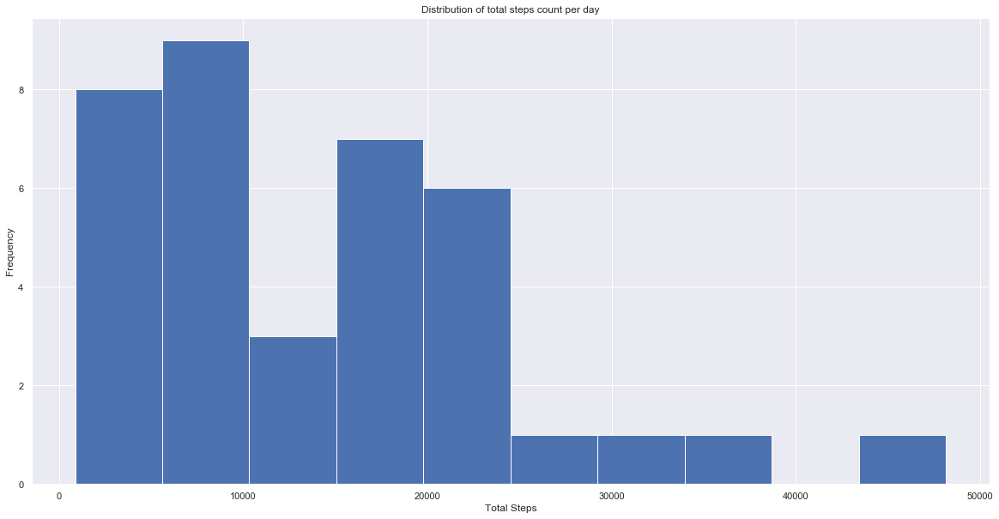

In [253]:
by_date_sum_steps['count'].hist(bins=10,figsize=(20,10))
plt.title('Distribution of total steps count per day')
plt.xlabel('Total Steps')
plt.ylabel('Frequency') 

Text(0, 0.5, 'Frequency')

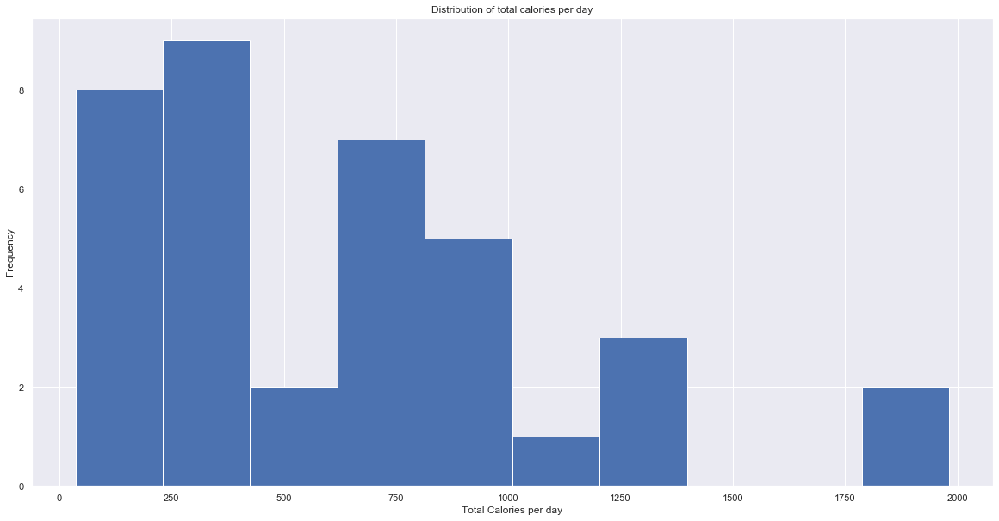

In [254]:
by_date_sum_steps['calorie'].hist(bins=10,figsize=(20,10))
plt.title('Distribution of total calories per day')
plt.xlabel('Total Calories per day')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

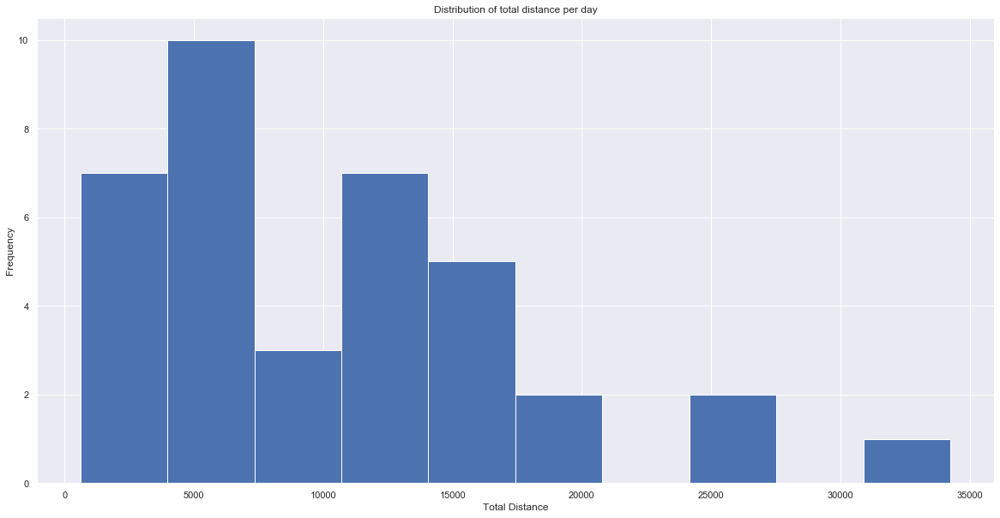

In [255]:
by_date_sum_steps['distance'].hist(bins=10,figsize=(20,10))
plt.title('Distribution of total distance per day')
plt.xlabel('Total Distance')
plt.ylabel('Frequency')

### Based on the graphs above, he/she most frequently walks for 5000-1000 steps, total distance of about 5000 m per day and burns around 300-400 cal per day.

## Correlation between Steps count, Sleep , and Exercise data

In [256]:
merged_sleep_exercise.loc[:,'start_date']=merged_sleep_exercise.loc[:,'start_date'].astype(str)
by_date_sum_steps.loc[:,'offset_start_date']=by_date_sum_steps.loc[:,'offset_start_date'].astype(str)
merged_steps_sleep_exercise = pd.merge(left=merged_sleep_exercise, right=by_date_sum_steps, left_on='start_date', right_on='offset_start_date').reset_index()
merged_steps_sleep_exercise

,level_0,index,start_date,calorie_x,exercise_duration_minutes,time_offset,date,efficiency,quality,sleep_duration,day_of_week_y,week_number,status,offset_start_date,count,calorie_y,distance
0,0,285,2019-04-07,171.370000,49.408350,UTC-0300,2019-04-07,88.0,NaN,427.68,Sunday,65,No_Travel,2019-04-07,48144,1981.908947,34255.151860
1,1,286,2019-04-08,169.510000,49.567400,UTC-0300,2019-04-08,90.0,NaN,386.10,Monday,66,No_Travel,2019-04-08,33448,1296.340945,24219.228173
2,2,287,2019-04-09,336.000000,40.000000,UTC-0300,2019-04-09,89.0,NaN,389.82,Tuesday,66,No_Travel,2019-04-09,4964,214.410000,3606.107002
3,3,288,2019-04-11,261.300000,49.128950,UTC-0300,2019-04-11,87.0,NaN,501.99,Thursday,66,No_Travel,2019-04-11,3254,142.750000,2225.216005
4,4,289,2019-04-13,336.000000,40.000000,UTC-0300,2019-04-13,90.0,NaN,322.20,Saturday,66,No_Travel,2019-04-13,12199,509.899985,8884.609976
5,5,290,2019-04-15,1214.848000,144.683100,UTC-0600,2019-04-15,86.0,NaN,379.26,Monday,67,Travel,2019-04-15,15302,801.790000,12313.399996
6,6,291,2019-04-16,228.710000,61.553033,UTC-0600,2019-04-16,88.0,NaN,137.28,Tuesday,67,Travel,2019-04-16,28794,1222.079965,20205.908705
7,7,292,2019-04-17,441.477000,62.542500,UTC-0600,2019-04-17,83.0,NaN,414.17,Wednesday,67,Travel,2019-04-17,20337,1000.639998,15041.901968
8,8,293,2019-04-18,484.830000,118.945317,UTC-0600,2019-04-18,85.0,NaN,413.10,Thursday,67,Travel,2019-04-18,4950,208.260000,3622.605010
9,9,294,2019-04-20,77.990000,21.622300,UTC-0600,2019-04-20,84.5,NaN,356.80,Saturday,67,Travel,2019-04-20,16261,737.839991,11686.531036


In [257]:
merged_steps_sleep_exercise.drop(columns=['quality'], axis=1, inplace=True)

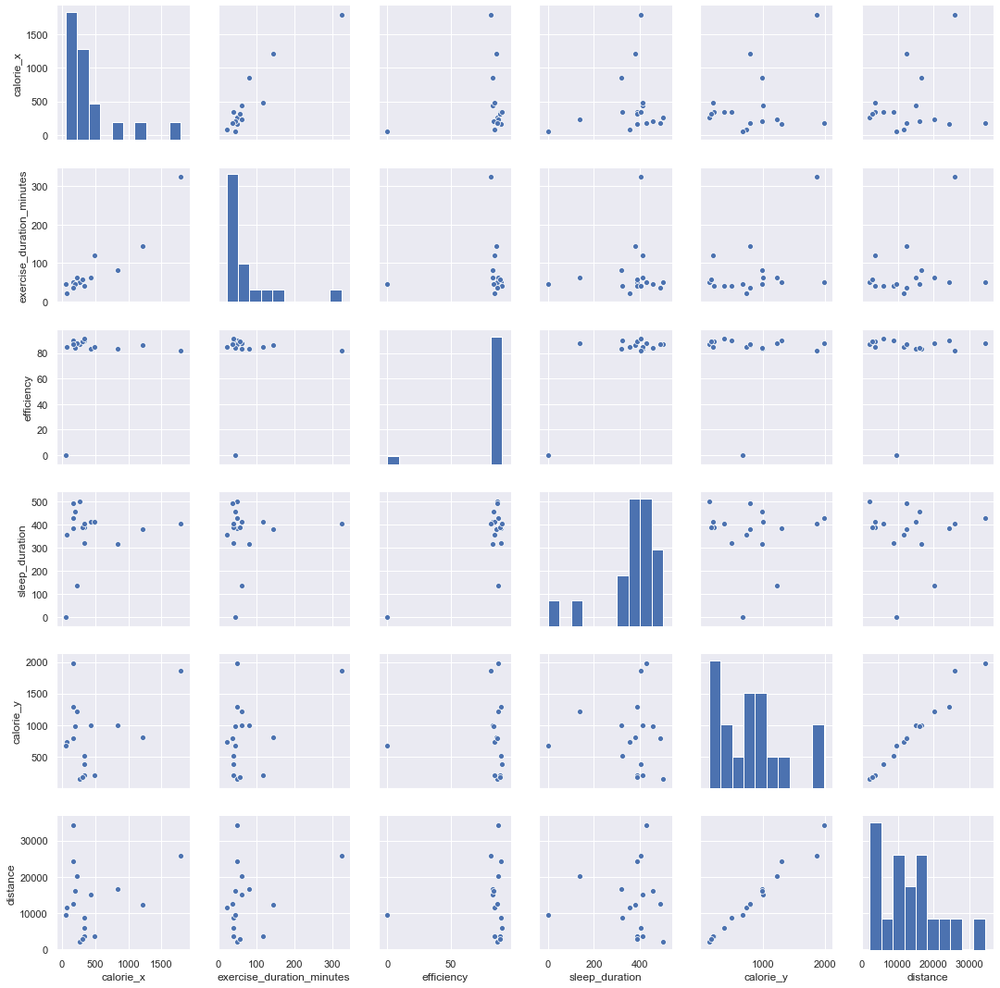

In [258]:
sns.pairplot(merged_steps_sleep_exercise.loc[:,merged_steps_sleep_exercise.dtypes == 'float64'])

### According to the group of graphs above, total steps distance per day and total calorie spent for steps are cprrelated. Overall sleep duration is not much related to the other parameters in the table. Calorie used during exercise is also correlated with exercise duration which was shown in previously (Exercise data section). 

### Correlation between Steps total Distance per Day and Total Calorie

In [259]:
fig = px.scatter(by_date_sum_steps, x='distance', y='calorie', marginal_y="box",
           marginal_x="box",trendline="ols")

fig.show()

### According to the graph above and fitted line, calorie is correlated linearly with distance. The equation is y=0.06x + 1.39 (y:Calorie(cal), x: Distance (m)). Also, we can see that he/she usually spends 308-962 cal (median=510 cal) and walks for 5088-15294 steps (median=8884 steps) per day.

### Based on walking information in exercise data, we know that the person's median walking speed is 1.27 m/s. If we assume this speed for all the steps data, we can plot calories vs time as following:

In [260]:
by_date_sum_steps.loc[:,'time_spent_minutes']=pd.to_numeric(by_date_sum_steps.loc[:,'distance'])/(1.27*60)

In [261]:
fig = px.scatter(by_date_sum_steps, x='time_spent_minutes', y='calorie', marginal_y="box",
           marginal_x="box",trendline="ols")
fig.show()

### Graph above and fitted line show that the relation between calorie and total walking minutes is as following: y=4.69x + 1.39 (y:calorie(cal),walking time (min)). Using this equation, 15 minutes walk uses 71.74 cal and 30 minutes walk uses 142.09 cal. Comparing this value with Exercise Calorie chart shows that the person's weight is between 175-200 lb. 

## Floors climbed data

In [262]:
floors_df= pd.read_csv("floors_climbed.csv", delimiter=',')
floors_df

,Unnamed: 0,start_time,pkg_name,update_time,create_time,time_offset,datauuid,custom,end_time,floor,deviceuuid
0,0,2018-05-02 12:42:15.000,com.sec.android.app.shealth,2018-05-02 12:49:48.489,2018-05-02 12:49:48.475,UTC-0300,e4c884ab-eff3-d1bb-e518-c2aae50809a8,NaN,2018-05-02 12:42:28.000,1.0,F/D7+hL5E5
1,1,2018-05-06 14:20:14.000,com.sec.android.app.shealth,2018-05-06 14:29:13.042,2018-05-06 14:29:13.041,UTC-0300,9c540db5-3893-db29-0395-282bcdad84e0,NaN,2018-05-06 14:20:21.000,1.0,F/D7+hL5E5
2,2,2018-05-02 12:35:06.000,com.sec.android.app.shealth,2018-05-02 12:49:48.456,2018-05-02 12:49:48.456,UTC-0300,f133a106-1db6-cdd1-4236-49f945694d6a,NaN,2018-05-02 12:35:18.000,1.0,F/D7+hL5E5
3,3,2018-04-11 12:12:47.000,com.sec.android.app.shealth,2018-04-11 12:17:26.692,2018-04-11 12:17:26.692,UTC-0300,e400bf12-d0a1-c8d9-022d-6a8ff36e9f32,NaN,2018-04-11 12:13:15.000,1.0,F/D7+hL5E5
4,4,2018-04-26 23:02:45.000,com.sec.android.app.shealth,2018-04-26 23:10:57.723,2018-04-26 23:10:57.722,UTC-0300,9d592d6f-cd60-dd1c-2aed-964fbd7f43f1,NaN,2018-04-26 23:03:13.000,1.0,F/D7+hL5E5
...,...,...,...,...,...,...,...,...,...,...,...
1513,1513,2019-05-10 22:17:50.170,com.sec.android.app.shealth,2019-05-10 22:25:39.331,2019-05-10 22:25:39.232,UTC-0300,0c977948-9282-a4be-6b71-04703120ba94,NaN,2019-05-10 22:18:15.171,1.0,F/D7+hL5E5
1514,1514,2019-05-10 22:19:25.170,com.sec.android.app.shealth,2019-05-10 22:25:47.772,2019-05-10 22:25:47.193,UTC-0300,79d95a09-6fc8-3be9-ee2a-7c2a50031e49,NaN,2019-05-10 22:20:55.171,2.0,F/D7+hL5E5
1515,1515,2019-05-10 22:24:05.170,com.sec.android.app.shealth,2019-05-10 22:31:52.257,2019-05-10 22:25:47.794,UTC-0300,5eb63af9-69ed-dd72-1965-343e265bbb55,NaN,2019-05-10 22:26:12.140,7.0,F/D7+hL5E5
1516,1516,2019-05-11 18:44:33.882,com.sec.android.app.shealth,2019-05-11 19:08:20.128,2019-05-11 19:08:19.929,UTC-0300,7899ed23-bfaf-a8c4-a91b-a7b5a72195d4,NaN,2019-05-11 18:45:02.883,1.0,F/D7+hL5E5


In [263]:
floors_df.isnull().sum()

Unnamed: 0        0
start_time        0
pkg_name          0
update_time       0
create_time       0
time_offset       0
datauuid          0
custom         1518
end_time          0
floor             0
deviceuuid        0
dtype: int64

In [264]:
#Adjusting start times based on the time zone
def offset(dataframe,columnname_offset,columnname_torewrite):
    column_offset=[]
    hr= lambda a : int(a[3:6])
    mins= lambda a : int(a[3]+a[6:8])
    for i in dataframe.index:
        hour=(hr(dataframe[columnname_offset][i]))
        minute=(mins(dataframe[columnname_offset][i]))
        human_readable_time=pd.to_datetime(dataframe[columnname_torewrite][i])
        new_time=human_readable_time+datetime.timedelta(hours=hour, minutes=minute )
        column_offset.append(new_time)
    return column_offset

# Apply the offset and create new columns. 
floors_df['offset_start']=offset(floors_df, 'time_offset', 'start_time')

In [265]:
floors_df['start_date']=pd.to_datetime(floors_df['offset_start']).dt.date
floors_df['start']=pd.to_datetime(floors_df['offset_start']).dt.time
floors_df['start_hour']=pd.to_datetime(floors_df['offset_start']).dt.hour

Text(0.5, 1.0, 'Floors Count Distribution')

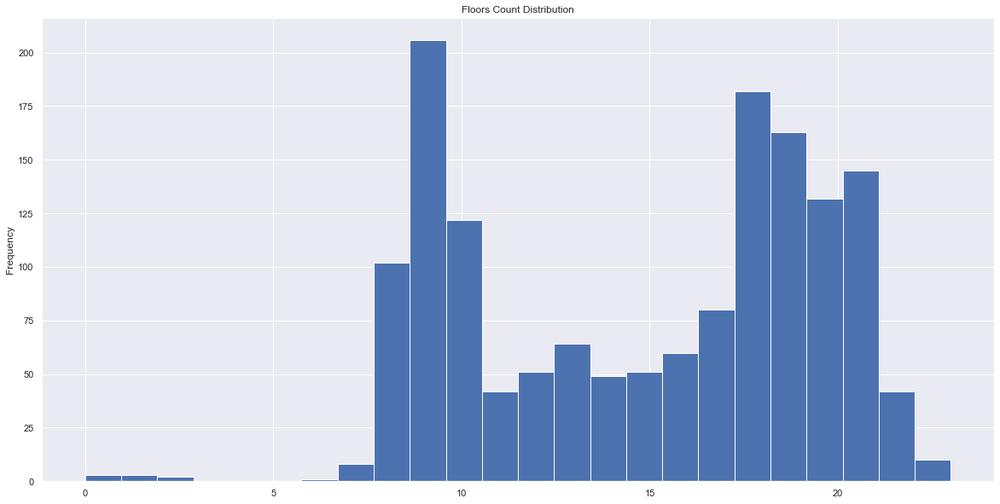

In [266]:
ax_25=floors_df['start_hour'].hist(bins=24,figsize=(20,10))
ax_25.set_ylabel("Frequency")
plt.title('Floors Count Distribution')

### Based on the graph above, he/she most frequently climbs floors around 9 am followed by 6 pm.

In [267]:
by_date_sum_floors=floors_df.groupby('start_date').sum()['floor'].reset_index()

Text(0, 0.5, 'Frequency')

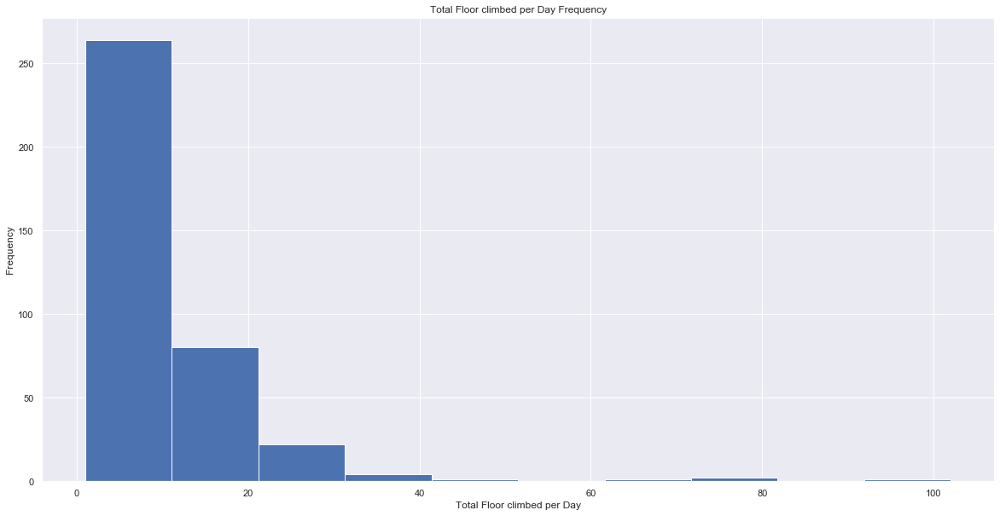

In [268]:
by_date_sum_floors['floor'].hist(figsize=(20,10))
plt.title('Total Floor climbed per Day Frequency')
plt.xlabel('Total Floor climbed per Day')
plt.ylabel('Frequency')

### He/She most frequently climbs 0-10 floors per day.

## Correlation between Floors Climbed, Steps, Exercise, and Sleep data

In [269]:
merged_sleep_exercise.loc[:,'start_date']=merged_sleep_exercise.loc[:,'start_date'].astype(str)
by_date_sum_floors.loc[:,'start_date']=by_date_sum_floors.loc[:,'start_date'].astype(str)
merged_floors_sleep_exercise = pd.merge(left=merged_sleep_exercise, right=by_date_sum_floors, left_on='start_date', right_on='start_date').reset_index()
merged_floors_sleep_exercise

,level_0,index,start_date,calorie,exercise_duration_minutes,time_offset,date,efficiency,quality,sleep_duration,day_of_week_y,week_number,status,floor
0,0,0,2017-12-19,160.901,30.272167,UTC-0400,2017-12-19,93.174065,NaN,273.000010,Tuesday,0,No_Travel,10.0
1,1,1,2017-12-24,553.224,61.963850,UTC-0700,2017-12-24,93.262410,NaN,525.067368,Sunday,0,Travel,12.0
2,2,2,2017-12-29,366.661,68.925250,UTC-0700,2017-12-29,92.952385,NaN,487.070497,Friday,1,Travel,5.0
3,3,3,2017-12-30,68.120,15.875533,UTC-0700,2017-12-30,89.778534,NaN,526.102209,Saturday,1,Travel,3.0
4,4,4,2017-12-31,385.162,31.352950,UTC-0700,2017-12-31,90.506050,NaN,478.189880,Sunday,1,Travel,22.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,226,297,2019-04-27,1786.680,324.496533,UTC-0600,2019-04-27,82.000000,NaN,402.620000,Saturday,68,Travel,102.0
227,227,298,2019-04-29,205.070,44.552350,UTC-0300,2019-04-29,84.000000,NaN,455.280000,Monday,69,No_Travel,21.0
228,228,299,2019-04-30,309.020,58.081467,UTC-0300,2019-04-30,89.000000,NaN,389.820000,Tuesday,69,No_Travel,9.0
229,229,300,2019-05-02,336.000,40.000000,UTC-0300,2019-05-02,91.000000,NaN,405.860000,Thursday,69,No_Travel,19.0


In [270]:
merged_floors_sleep_exercise.loc[:,'start_date']=merged_floors_sleep_exercise.loc[:,'start_date'].astype(str)
by_date_sum_steps.loc[:,'offset_start_date']=by_date_sum_steps.loc[:,'offset_start_date'].astype(str)
merged_floors_steps_sleep_exercise = pd.merge(left=merged_sleep_exercise, right=by_date_sum_steps, left_on='start_date', right_on='offset_start_date').reset_index()
merged_floors_steps_sleep_exercise

,level_0,index,start_date,calorie_x,exercise_duration_minutes,time_offset,date,efficiency,quality,sleep_duration,day_of_week_y,week_number,status,offset_start_date,count,calorie_y,distance,time_spent_minutes
0,0,285,2019-04-07,171.370000,49.408350,UTC-0300,2019-04-07,88.0,NaN,427.68,Sunday,65,No_Travel,2019-04-07,48144,1981.908947,34255.151860,449.542675
1,1,286,2019-04-08,169.510000,49.567400,UTC-0300,2019-04-08,90.0,NaN,386.10,Monday,66,No_Travel,2019-04-08,33448,1296.340945,24219.228173,317.837640
2,2,287,2019-04-09,336.000000,40.000000,UTC-0300,2019-04-09,89.0,NaN,389.82,Tuesday,66,No_Travel,2019-04-09,4964,214.410000,3606.107002,47.324239
3,3,288,2019-04-11,261.300000,49.128950,UTC-0300,2019-04-11,87.0,NaN,501.99,Thursday,66,No_Travel,2019-04-11,3254,142.750000,2225.216005,29.202310
4,4,289,2019-04-13,336.000000,40.000000,UTC-0300,2019-04-13,90.0,NaN,322.20,Saturday,66,No_Travel,2019-04-13,12199,509.899985,8884.609976,116.595931
5,5,290,2019-04-15,1214.848000,144.683100,UTC-0600,2019-04-15,86.0,NaN,379.26,Monday,67,Travel,2019-04-15,15302,801.790000,12313.399996,161.593176
6,6,291,2019-04-16,228.710000,61.553033,UTC-0600,2019-04-16,88.0,NaN,137.28,Tuesday,67,Travel,2019-04-16,28794,1222.079965,20205.908705,265.169406
7,7,292,2019-04-17,441.477000,62.542500,UTC-0600,2019-04-17,83.0,NaN,414.17,Wednesday,67,Travel,2019-04-17,20337,1000.639998,15041.901968,197.400288
8,8,293,2019-04-18,484.830000,118.945317,UTC-0600,2019-04-18,85.0,NaN,413.10,Thursday,67,Travel,2019-04-18,4950,208.260000,3622.605010,47.540748
9,9,294,2019-04-20,77.990000,21.622300,UTC-0600,2019-04-20,84.5,NaN,356.80,Saturday,67,Travel,2019-04-20,16261,737.839991,11686.531036,153.366549


In [271]:
merged_floors_steps_sleep_exercise.drop(columns=['quality'], axis=1, inplace=True)

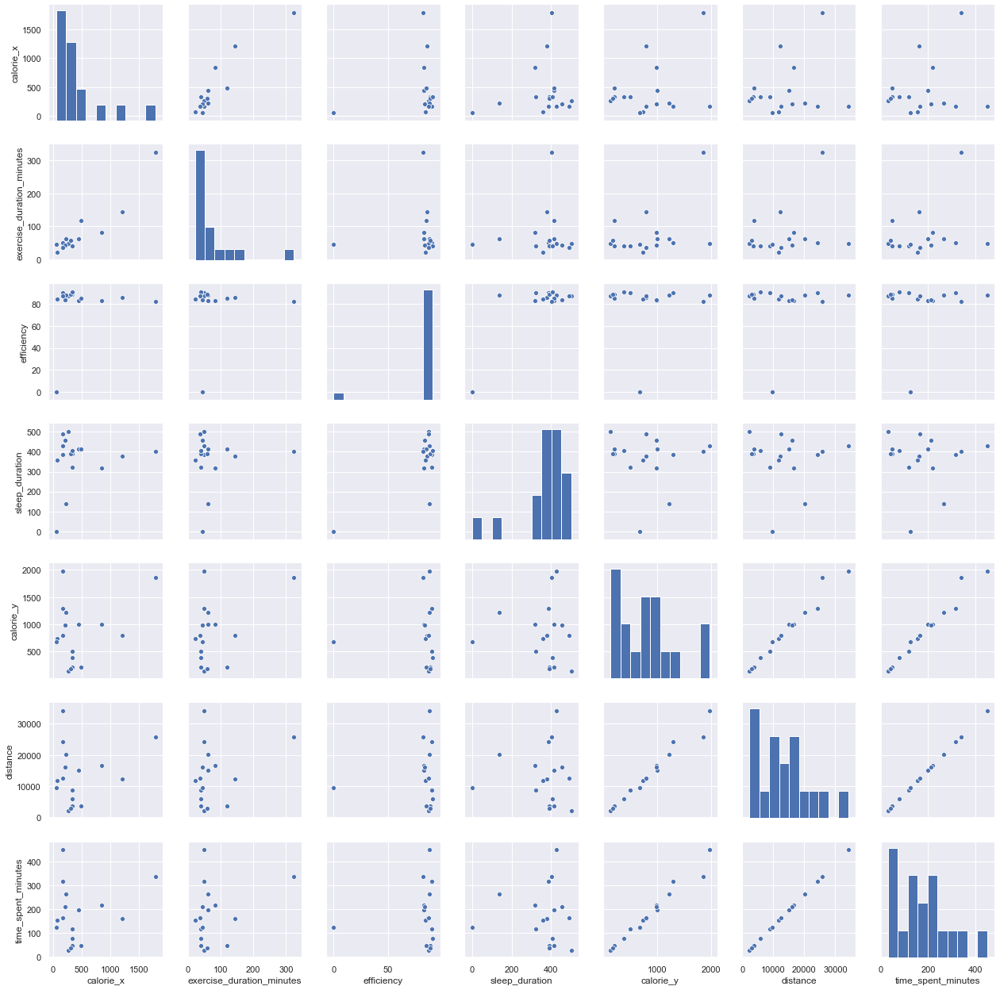

In [273]:
sns.pairplot(merged_floors_steps_sleep_exercise.loc[:,merged_floors_steps_sleep_exercise.dtypes == 'float64'])

According to the graphs above, floors climbed is not correlated with other variables.

## Correlation between Floors Climbed and Heart Rate

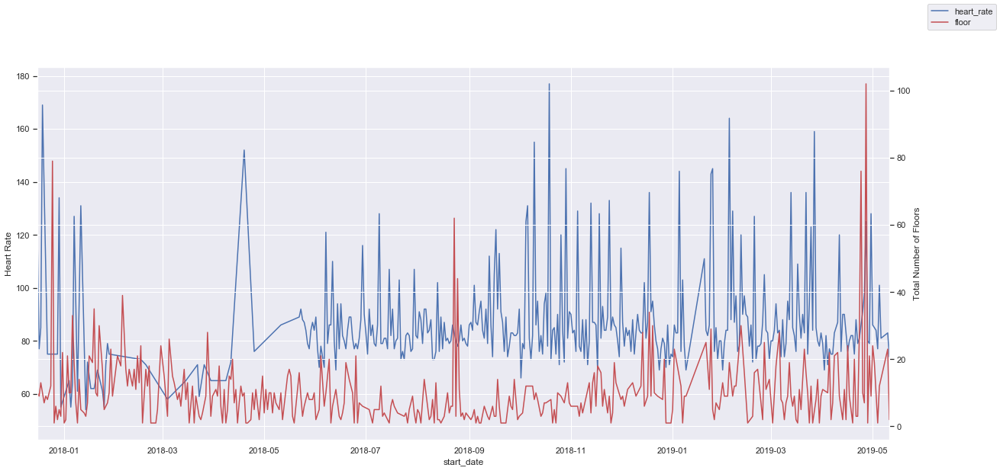

In [274]:
by_date_sum_floors.loc[:,'start_date']=pd.to_datetime(by_date_sum_floors['start_date'])
ax_11 = bydate_heart_rate_max.plot(x="start_date", y="heart_rate", legend=False, figsize=(20,10))
ax_12 = ax_11.twinx()
by_date_sum_floors.plot(x="start_date", y="floor", ax=ax_12, legend=False, color="r")
ax_12.figure.legend()
ax_12.set_ylabel('Total Number of Floors')
ax_11.set_ylabel('Heart Rate')
#ax_12.set_xlim('2018-01','2018-05')

plt.show()

The graph above shows that trends for floors climbed and heart rate are not correlated.

# Stress Data

In [275]:
stress_df= pd.read_csv("stress.csv", delimiter=',')
stress_df

,Unnamed: 0,create_time,time_offset,max,custom,end_time,deviceuuid,start_time,score,pkg_name,update_time,min,binning_data,datauuid,tag_id,comment,algorithm
0,0,2018-03-22 00:50:01.137,UTC-0300,NaN,7cb2f698-6e9e-48b0-a7fa-4ee889cfc5f9.custom.json,NaN,jQfnryI8/B,2018-03-22 00:49:55.970,31.000000,com.sec.android.app.shealth,2018-03-22 00:50:01.137,NaN,NaN,7cb2f698-6e9e-48b0-a7fa-4ee889cfc5f9,10002,NaN,NaN
1,1,2016-08-13 04:07:34.246,UTC-0600,NaN,NaN,NaN,jQfnryI8/B,2016-08-13 04:07:27.341,46.820553,com.sec.android.app.shealth,2016-08-13 04:07:34.246,NaN,NaN,f0541bdf-0627-47fa-93e8-0edfd62d238a,10002,NaN,NaN
2,2,2018-10-16 22:58:43.629,UTC-0300,56.0,adb8916f-2bfa-457a-a5a9-a141e3b2547c.custom.json,2018-10-16 22:58:38.737,jQfnryI8/B,2018-10-16 22:58:38.737,56.000000,com.sec.android.app.shealth,2018-10-16 22:58:43.629,56.0,NaN,adb8916f-2bfa-457a-a5a9-a141e3b2547c,10002,NaN,1.0
3,3,2019-01-02 23:22:54.750,UTC-0400,92.0,86a7f4c7-8266-4499-bac5-ddf0b6ed6168.custom.json,2019-01-02 23:22:34.279,jQfnryI8/B,2019-01-02 23:22:34.279,92.000000,com.sec.android.app.shealth,2019-01-02 23:22:54.750,92.0,NaN,86a7f4c7-8266-4499-bac5-ddf0b6ed6168,10009,NaN,1.0
4,4,2019-02-08 14:29:32.875,UTC-0400,23.0,8b95506d-3de2-4a94-a682-1fff6dd0b6e4.custom.json,2019-02-08 14:29:29.021,jQfnryI8/B,2019-02-08 14:29:29.021,23.000000,com.sec.android.app.shealth,2019-02-08 14:29:32.875,23.0,NaN,8b95506d-3de2-4a94-a682-1fff6dd0b6e4,10002,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147,147,2019-03-11 11:48:38.121,UTC-0300,7.0,51713b5a-babc-4ad7-9d80-38b3b302aba1.custom.json,2019-03-11 11:48:34.298,jQfnryI8/B,2019-03-11 11:48:34.298,7.000000,com.sec.android.app.shealth,2019-03-11 11:48:38.121,7.0,NaN,51713b5a-babc-4ad7-9d80-38b3b302aba1,10002,NaN,1.0
148,148,2018-07-29 19:45:11.501,UTC-0300,NaN,8b370b5d-f4bd-4e96-b2c2-22057b5b5313.custom.json,NaN,jQfnryI8/B,2018-07-29 19:45:07.566,62.000000,com.sec.android.app.shealth,2018-07-29 19:45:11.501,NaN,NaN,8b370b5d-f4bd-4e96-b2c2-22057b5b5313,10002,NaN,NaN
149,149,2019-03-14 00:08:19.974,UTC-0300,1.0,9c04831a-0ffa-4cc4-a1ab-fb1f1ba6488b.custom.json,2019-03-14 00:08:16.441,jQfnryI8/B,2019-03-14 00:08:16.441,1.000000,com.sec.android.app.shealth,2019-03-14 00:08:19.974,1.0,NaN,9c04831a-0ffa-4cc4-a1ab-fb1f1ba6488b,10002,NaN,1.0
150,150,2016-06-13 10:03:55.361,UTC+0530,NaN,NaN,NaN,jQfnryI8/B,2016-06-13 10:03:50.958,50.076923,com.sec.android.app.shealth,2016-06-13 10:03:55.361,NaN,NaN,ec25ad21-4761-4528-b24f-7d1bbe08e371,10002,NaN,NaN


In [276]:
stress_df=stress_df.loc[:,['start_time','score','time_offset']]

In [277]:
def offset(dataframe,columnname_offset,columnname_torewrite):
    column_offset=[]
    hr= lambda a : int(a[3:6])
    mins= lambda a : int(a[3]+a[6:8])
    for i in dataframe.index:
        hour=(hr(dataframe[columnname_offset][i]))
        minute=(mins(dataframe[columnname_offset][i]))
        human_readable_time=pd.to_datetime(dataframe[columnname_torewrite][i])
        new_time=human_readable_time+datetime.timedelta(hours=hour, minutes=minute )
        column_offset.append(new_time)
    return column_offset

# Apply the offset and create new columns. 
stress_df['offset_start']=offset(stress_df, 'time_offset', 'start_time')

In [278]:
stress_df['start_date']=pd.to_datetime(stress_df['offset_start']).dt.date

In [279]:
stress_df['start']=pd.to_datetime(stress_df['offset_start']).dt.time

In [280]:
stress_df['start_hour']=pd.to_datetime(stress_df['offset_start']).dt.hour

Text(0.5, 1.0, 'Stress Measurment Distribution')

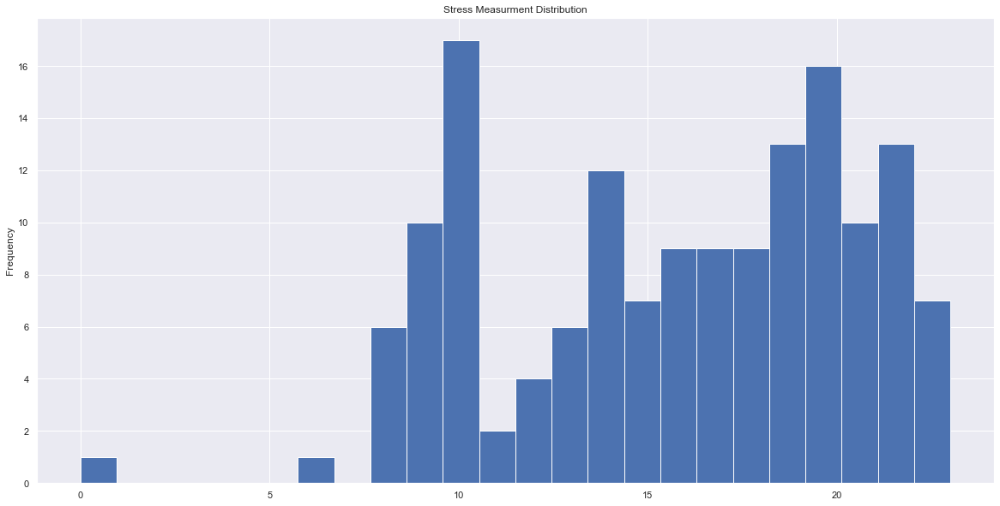

In [281]:
ax_25=stress_df['start_hour'].hist(bins=24,figsize=(20,10))
ax_25.set_ylabel("Frequency")
plt.title('Stress Measurment Distribution')

### The graph above just shows at which times he/she usually measures stress. He/She most frequently measured it at 10 am followed by 7 pm.

In [282]:
stress_df.loc[:,'day_week']= stress_df.loc[:,'offset_start'].dt.day_name()

In [294]:
by_date_stress=stress_df.groupby('start_date', as_index=False).agg({'score':'mean', 'day_week':'first'})
by_date_stress

,start_date,score,day_week
0,2016-06-10,42.262928,Friday
1,2016-06-11,41.715332,Saturday
2,2016-06-13,50.076923,Monday
3,2016-06-14,43.663730,Tuesday
4,2016-06-17,55.753300,Friday
...,...,...,...
87,2019-04-01,0.000000,Monday
88,2019-04-08,0.000000,Monday
89,2019-04-13,42.000000,Saturday
90,2019-04-17,1.000000,Wednesday


Text(0, 0.5, 'Avg Stress Score')

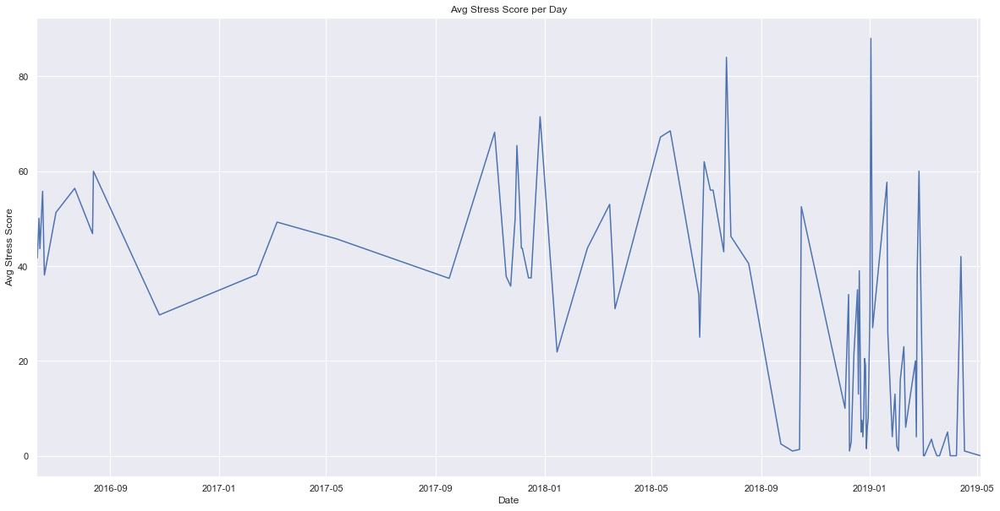

In [284]:
stress_df.groupby('start_date').mean()['score'].plot(kind='line',stacked=True,figsize=(20,10))
plt.title('Avg Stress Score per Day')
plt.xlabel('Date')
plt.ylabel('Avg Stress Score') 

In [285]:
#Plotting stress score of each day for each day of week
by_date_stress.loc[:,'start_date']=by_date_stress.loc[:,'start_date'].astype(str)
fig = px.scatter(by_date_stress, x='start_date', y='score',color='day_week', marginal_y="box")
fig.show()

In [286]:
bydate_heart_rate.loc[:,'start_date']=merged_sleep_exercise.loc[:,'start_date'].astype(str)
by_date_stress.loc[:,'start_date']=by_date_stress.loc[:,'start_date'].astype(str)
stress_heart = pd.merge(left=bydate_heart_rate, right=by_date_stress, left_on='start_date', right_on='start_date').reset_index()

In [287]:
#Plotting heart rate of each day for each day of week
fig = px.scatter(stress_heart, x='score', y='heart_rate',color='day_week', marginal_y="box",marginal_x="box")
fig.show()

### Based on graph above, stress score and heart rate are not correlated. Based on median values, the person usually has the highest stress on Tuesdays and the lowest stress on wednesdays. For heart rate, he/she has highest median heart rate on Sunday followed by Saturdays.

# Analyzing all variables together:

In [288]:
merged_floors_steps_sleep_exercise.loc[:,'date']=merged_floors_steps_sleep_exercise.loc[:,'date'].astype(str)
bydate_heart_rate.loc[:,'start_date']=bydate_heart_rate.loc[:,'start_date'].astype(str)
merged_heart_floors_steps_sleep_exercise=pd.merge(left=merged_floors_steps_sleep_exercise, right=bydate_heart_rate, left_on='date', right_on='start_date')

In [289]:
merged_floors_steps_sleep_exercise

,level_0,index,start_date,calorie_x,exercise_duration_minutes,time_offset,date,efficiency,sleep_duration,day_of_week_y,week_number,status,offset_start_date,count,calorie_y,distance,time_spent_minutes
0,0,285,2019-04-07,171.370000,49.408350,UTC-0300,2019-04-07,88.0,427.68,Sunday,65,No_Travel,2019-04-07,48144,1981.908947,34255.151860,449.542675
1,1,286,2019-04-08,169.510000,49.567400,UTC-0300,2019-04-08,90.0,386.10,Monday,66,No_Travel,2019-04-08,33448,1296.340945,24219.228173,317.837640
2,2,287,2019-04-09,336.000000,40.000000,UTC-0300,2019-04-09,89.0,389.82,Tuesday,66,No_Travel,2019-04-09,4964,214.410000,3606.107002,47.324239
3,3,288,2019-04-11,261.300000,49.128950,UTC-0300,2019-04-11,87.0,501.99,Thursday,66,No_Travel,2019-04-11,3254,142.750000,2225.216005,29.202310
4,4,289,2019-04-13,336.000000,40.000000,UTC-0300,2019-04-13,90.0,322.20,Saturday,66,No_Travel,2019-04-13,12199,509.899985,8884.609976,116.595931
5,5,290,2019-04-15,1214.848000,144.683100,UTC-0600,2019-04-15,86.0,379.26,Monday,67,Travel,2019-04-15,15302,801.790000,12313.399996,161.593176
6,6,291,2019-04-16,228.710000,61.553033,UTC-0600,2019-04-16,88.0,137.28,Tuesday,67,Travel,2019-04-16,28794,1222.079965,20205.908705,265.169406
7,7,292,2019-04-17,441.477000,62.542500,UTC-0600,2019-04-17,83.0,414.17,Wednesday,67,Travel,2019-04-17,20337,1000.639998,15041.901968,197.400288
8,8,293,2019-04-18,484.830000,118.945317,UTC-0600,2019-04-18,85.0,413.10,Thursday,67,Travel,2019-04-18,4950,208.260000,3622.605010,47.540748
9,9,294,2019-04-20,77.990000,21.622300,UTC-0600,2019-04-20,84.5,356.80,Saturday,67,Travel,2019-04-20,16261,737.839991,11686.531036,153.366549


In [290]:
merged_heart_floors_steps_sleep_exercise

,level_0,index,start_date_x,calorie_x,exercise_duration_minutes,time_offset,date,efficiency,sleep_duration,day_of_week_y,week_number,status,offset_start_date,count,calorie_y,distance,time_spent_minutes,start_date_y,heart_rate
0,0,285,2019-04-07,171.370000,49.408350,UTC-0300,2019-04-07,88.0,427.68,Sunday,65,No_Travel,2019-04-07,48144,1981.908947,34255.151860,449.542675,2019-04-07,59.921875
1,1,286,2019-04-08,169.510000,49.567400,UTC-0300,2019-04-08,90.0,386.10,Monday,66,No_Travel,2019-04-08,33448,1296.340945,24219.228173,317.837640,2019-04-08,60.168675
2,2,287,2019-04-09,336.000000,40.000000,UTC-0300,2019-04-09,89.0,389.82,Tuesday,66,No_Travel,2019-04-09,4964,214.410000,3606.107002,47.324239,2019-04-09,59.615385
3,3,288,2019-04-11,261.300000,49.128950,UTC-0300,2019-04-11,87.0,501.99,Thursday,66,No_Travel,2019-04-11,3254,142.750000,2225.216005,29.202310,2019-04-11,58.820000
4,4,289,2019-04-13,336.000000,40.000000,UTC-0300,2019-04-13,90.0,322.20,Saturday,66,No_Travel,2019-04-13,12199,509.899985,8884.609976,116.595931,2019-04-13,64.259259
5,5,290,2019-04-15,1214.848000,144.683100,UTC-0600,2019-04-15,86.0,379.26,Monday,67,Travel,2019-04-15,15302,801.790000,12313.399996,161.593176,2019-04-15,60.800000
6,6,291,2019-04-16,228.710000,61.553033,UTC-0600,2019-04-16,88.0,137.28,Tuesday,67,Travel,2019-04-16,28794,1222.079965,20205.908705,265.169406,2019-04-16,61.973684
7,7,292,2019-04-17,441.477000,62.542500,UTC-0600,2019-04-17,83.0,414.17,Wednesday,67,Travel,2019-04-17,20337,1000.639998,15041.901968,197.400288,2019-04-17,59.681818
8,8,293,2019-04-18,484.830000,118.945317,UTC-0600,2019-04-18,85.0,413.10,Thursday,67,Travel,2019-04-18,4950,208.260000,3622.605010,47.540748,2019-04-18,70.052632
9,9,294,2019-04-20,77.990000,21.622300,UTC-0600,2019-04-20,84.5,356.80,Saturday,67,Travel,2019-04-20,16261,737.839991,11686.531036,153.366549,2019-04-20,64.623529


In [291]:
correlations = {}
columns = merged_heart_floors_steps_sleep_exercise.loc[:,merged_heart_floors_steps_sleep_exercise.dtypes == 'float64'].columns.tolist()

for col_a, col_b in itertools.combinations(columns, 2):
    correlations[col_a + '__' + col_b] = pearsonr(merged_heart_floors_steps_sleep_exercise.loc[:, col_a], merged_heart_floors_steps_sleep_exercise.loc[:, col_b])

result = DataFrame.from_dict(correlations, orient='index')
result.columns = ['correlation', 'p-value']

print(result.sort_values(by='correlation', ascending=False))

                                               correlation        p-value
distance__time_spent_minutes                      1.000000  1.454414e-116
calorie_y__distance                               0.984808   8.081072e-13
calorie_y__time_spent_minutes                     0.984808   8.081072e-13
calorie_x__exercise_duration_minutes              0.926916   8.925792e-08
efficiency__sleep_duration                        0.741589   6.559702e-04
exercise_duration_minutes__calorie_y              0.420355   9.295065e-02
calorie_x__calorie_y                              0.328863   1.974447e-01
exercise_duration_minutes__time_spent_minutes     0.300370   2.414289e-01
exercise_duration_minutes__distance               0.300370   2.414289e-01
calorie_x__distance                               0.217683   4.013025e-01
calorie_x__time_spent_minutes                     0.217683   4.013025e-01
calorie_x__efficiency                             0.150258   5.648683e-01
calorie_x__sleep_duration             

### Based on the correlation values above, we can see that all the variables we found correlation between them have high correlation here. Other than those, other variables are not correlated.

In [298]:
correlations = {}
columns = merged_heart_floors_sleep_exercise.loc[:,merged_heart_floors_sleep_exercise.dtypes == 'float64'].columns.tolist()

for col_a, col_b in itertools.combinations(columns, 2):
    correlations[col_a + '__' + col_b] = pearsonr(merged_heart_floors_sleep_exercise.loc[:, col_a], merged_heart_floors_sleep_exercise.loc[:, col_b])

result = DataFrame.from_dict(correlations, orient='index')
result.columns = ['correlation', 'p-value']

print(result.sort_values(by='correlation', ascending=False))

                                           correlation        p-value
calorie__exercise_duration_minutes            0.881891   0.000000e+00
efficiency__sleep_duration                    0.623665   0.000000e+00
exercise_duration_minutes__floor              0.283635   0.000000e+00
calorie__floor                                0.227747  1.347033e-242
calorie__sleep_duration                       0.071050   1.145840e-24
calorie__efficiency                           0.062729   1.431560e-19
exercise_duration_minutes__sleep_duration     0.049298   1.164214e-12
exercise_duration_minutes__efficiency         0.047564   6.928402e-12
floor__heart_rate                             0.000618   9.290317e-01
calorie__heart_rate                           0.000299   9.655698e-01
exercise_duration_minutes__heart_rate         0.000261   9.699919e-01
efficiency__heart_rate                        0.000036   9.959125e-01
sleep_duration__heart_rate                   -0.000024   9.972510e-01
efficiency__floor   

### Same as mentioned earlier,  correlation values above, we can see that all the variables we found correlation between them have high correlation here. Other than those, other variables are not correlated.

In [300]:
fig = px.scatter_matrix(merged_heart_floors_sleep_exercise,
    dimensions=['calorie','exercise_duration_minutes','efficiency','week_number','floor','heart_rate'],
    color="day_of_week_y",width=1800, height=1800)
fig.show()

### No clusters are observed in 2 graphs above. And the parameters showing correlation were already analyzed before.

# Applying KNN to find possible correlation between exercise calorie and Sleep duration with day of week

In [301]:
var_1 = merged_heart_floors_sleep_exercise[['calorie','sleep_duration']].copy()

target= merged_heart_floors_sleep_exercise['day_of_week_y'].copy()
X =var_1.values
y =target.values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [302]:
print (X.shape,X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(20775, 2) (14542, 2) (6233, 2) (14542,) (6233,)


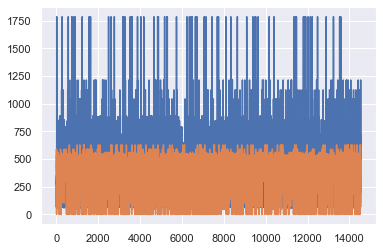

In [303]:
plt.plot(X_train)

In [304]:
df_2=remove_outlier(merged_heart_floors_sleep_exercise,'calorie')

In [305]:
df_2=remove_outlier(df_2,'sleep_duration')

In [306]:
df_2=remove_outlier(df_2,'floor')

In [307]:
var_1 = df_2[['calorie','sleep_duration']].copy()

target= df_2['day_of_week_y'].copy()
X =var_1.values
y =target.values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

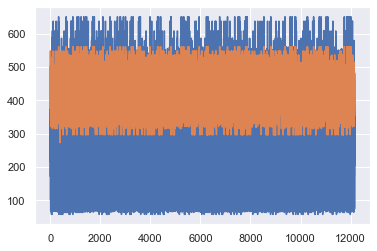

In [308]:
plt.plot(X_train)

In [309]:
sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)

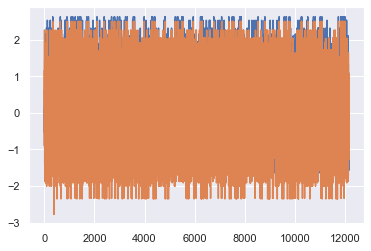

In [310]:
plt.plot(X_train_std)

In [311]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_std,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

In [312]:
y_pred_train=knn.predict(X_train_std)

In [314]:
y_pred_test=knn.predict(X_test_std)

In [315]:
train_acc=accuracy_score(y_train, y_pred_train)
train_acc

0.9990135635018496

In [316]:
test_acc=accuracy_score(y_test,y_pred_test)
test_acc

0.9998082086689681

In [317]:
confusion_matrix(y_test, y_pred_test)

array([[856,   0,   0,   0,   0,   0,   0],
       [  0, 865,   0,   0,   0,   0,   0],
       [  0,   0, 659,   0,   0,   0,   0],
       [  0,   0,   0, 571,   0,   0,   0],
       [  0,   1,   0,   0, 694,   0,   0],
       [  0,   0,   0,   0,   0, 844,   0],
       [  0,   0,   0,   0,   0,   0, 724]], dtype=int64)

In [319]:
from sklearn.model_selection import cross_val_score
#knn.fit(X_train, np.ravel(y_train,order='C'))
#creating odd list of K for KNN
k_list= list(range(1,50))
# subsetting just the odd ones
neighbors = list(filter(lambda x: x % 2 != 0, k_list))
#empty list that will hold cv scores
cv_scores = []
#perform 10-fold cross validation
for k in neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train_std, np.ravel(y_train), cv=5, scoring='accuracy')
    cv_scores.append(scores.mean())
sum(cv_scores)/len(cv_scores)

0.9990134275222929

In [320]:
# search for an optimal value of K for KNN

# range of k we want to try
k_range = range(1, 31)
# empty list to store scores
k_scores = []

# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, X_train_std, y_train, cv=5, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())


print(k_scores)
print(np.mean(k_scores))

[0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932, 0.9990134275222932]
0.999013427522293


1 0.9990134275222932
2 0.9990134275222932
3 0.9990134275222932
4 0.9990134275222932
5 0.9990134275222932
6 0.9990134275222932
7 0.9990134275222932
8 0.9990134275222932
9 0.9990134275222932
10 0.9990134275222932
11 0.9990134275222932
12 0.9990134275222932
13 0.9990134275222932
14 0.9990134275222932
15 0.9990134275222932
16 0.9990134275222932
17 0.9990134275222932
18 0.9990134275222932
19 0.9990134275222932
20 0.9990134275222932
21 0.9990134275222932
22 0.9990134275222932
23 0.9990134275222932
24 0.9990134275222932
25 0.9990134275222932
26 0.9990134275222932
27 0.9990134275222932
28 0.9990134275222932
29 0.9990134275222932
30 0.9990134275222932


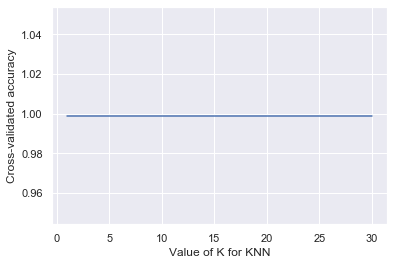

In [321]:
# plot how accuracy changes as we vary k
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
# plt.plot(x_axis, y_axis)
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-validated accuracy')

for c, value in enumerate(k_scores, 1):
    print(c, value)


### Based on the analysis above, KNN does not fit well and it's highest accuracy would be around 0.27 for 29 neighbours.

# Conclusions:
1. The person lives in time zone of Atlantic Standard Time.
2. The person normally sleeps around 9 pm- 1 am and most frequently sleeps at 10 pm-11 pm. He/She sometimes sleeps after 1 am. The person also sometimes takes naps during the day.
3. The person sleeps for total of about 400 min (~7 hours) per day. He/She sleeps the most on Thursday nights and the least on Sunday nights.
4. He/She most frequently exercises around 11 am, followed by 7 pm-11 pm and 12 am.
5. The person exercised during vacation for about average time of 66 minutes (min=16 min, max=324 min) per day. However, when the person was not on vacation, he/she exercised for about average time of 55 minutes (min= 15 min, max= 224 min) per day.
6. The person mostly walks for exercise. He/she sometimes goes swimming. He/She rarely goes running, cycling, Yoga and hiking. As mentioned earlier, the person sometimes (128 times during this time period) does  exercises which are not included in the categories of health app.
7. Exercise duration and calories was different depending on the exercise type. Calorie and exercise duration are linearly correlated for Cycling, Walking and Yoga, and we can see the trend line coefficients for each exercise type. The longest exercise duration was for Cycling, followed by Yoga, Swimming, Running, and Walking, by order. However, the amount of average calories was the highest for Running, Cycling,Swimming,Yoga, and Walking, by order. This behaviour can be also seen in the slopes for different activity types. Among the activity types, Swimming and Running did not have a good correlation between Calorie and duration.
8. His/her average walking speed was 1.27 m/s (~2.84mph), walking duration median was 19 minutes and it is mostly between 16-27 minutes. The calorie median was 84 cal and it was mostly between 68-111 cal.
9. Based on calorie vs exercisee duration for walking and information on Exercise Calorie chart, we can estimate person's weight. In our graph, the line equation is: calorie = 3.736*exercise_duration_min + 8.316.The person's median speed is 1.27 m/s (2.84 mph). From the equation, for 15 minutes and 30 minutes, the calorie can be calculated as 64.356 cal and 120.396 cal. respectively. Based on the calorie chart, these values correspond to a person with about 175 lb (79 kg) weight.
10. The person exercises most frequently on Tuesdays and least frequently on Sundays.
11. The person's heart rate is usually steady. There were few instances that he/she had spikes in heart rate. 2 times in Jan. 2018 was probably because of hard exercise (since the calorie was high too). The other time in Apr. 2018 was a gradual increase in heart rate and had the same rate as it decreased to normal heart rate. This might be because of heart problem or an stressful event in the period of life.
12. The person normally walks at 9 am- 11 pm. The highest average steps count was for 7 pm followed by 8 pm and the lowest for 1 am - 7 am when he/she is sleeping.
13. He/She most frequently climbs 0-10 floors per day.
14. Stress score and heart rate are not correlated. Based on median values, the person usually has the highest stress on Tuesdays and the lowest stress on wednesdays. For heart rate, he/she has highest median heart rate on Sunday followed by Saturdays.

